# TASK-7 Stock Market Prediction using Numerical and Textual Analysis

 - Create a hybrid model for stock price/performance prediction using numerical analysis of historical stock prices, and sentimental analysis of news headlines.
 - Stock to analyze and predict SENSEX (S&P BSE SENSEX).
 - Use either R or Python, or both for separate analysis and then combine the findings to create a hybrid model.

In [1]:
# Importing the libraries
import os
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.arima_model import ARIMA
import nltk
import re
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('vader_lexicon')
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem.porter import PorterStemmer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
import xgboost 
import lightgbm 

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


pip install lightgbm

pip install pmdarima

In [2]:
# TIME SERIES ANALYSIS

df_prices = pd.read_csv('BSESN.csv')
print(df_prices.head())
print(df_prices.size)

         Date         Open         High          Low        Close  \
0  2000-01-03  5209.540039  5384.660156  5209.540039  5375.109863   
1  2000-01-04  5533.979980  5533.979980  5376.430176  5491.009766   
2  2000-01-05  5265.089844  5464.350098  5184.479980  5357.000000   
3  2000-01-06  5424.209961  5489.859863  5391.330078  5421.529785   
4  2000-01-07  5358.279785  5463.250000  5330.580078  5414.479980   

     Adj Close  Volume  
0  5375.109863     0.0  
1  5491.009766     0.0  
2  5357.000000     0.0  
3  5421.529785     0.0  
4  5414.479980     0.0  
35882


In [3]:
# Converting Date column to datetime datatype

df_prices['Date'] = pd.to_datetime(df_prices['Date'])
df_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5126 entries, 0 to 5125
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       5126 non-null   datetime64[ns]
 1   Open       5040 non-null   float64       
 2   High       5040 non-null   float64       
 3   Low        5040 non-null   float64       
 4   Close      5040 non-null   float64       
 5   Adj Close  5040 non-null   float64       
 6   Volume     5040 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 280.5 KB


Text(0, 0.5, 'Close')

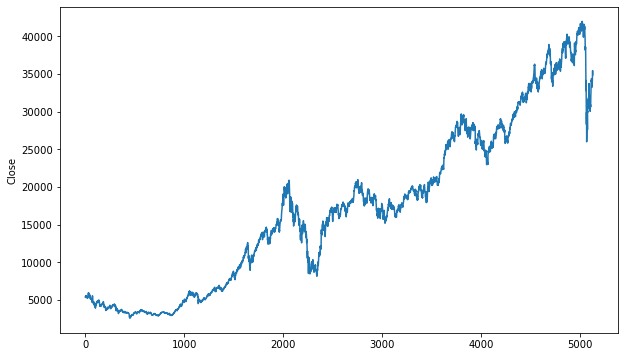

In [4]:
df_prices.dropna(inplace = True)
plt.figure(figsize=(10, 6))
df_prices['Close'].plot()
plt.ylabel('Close')

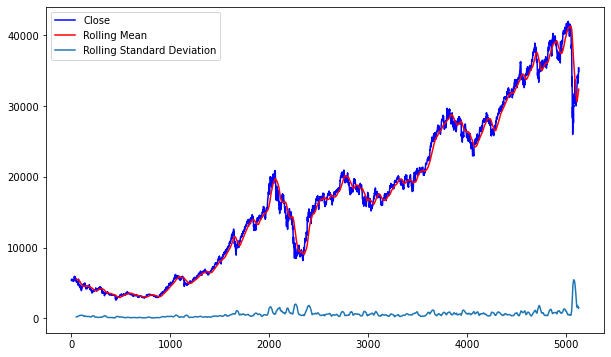

In [6]:
# Plotting moving average

close = df_prices['Close']
ma = close.rolling(window = 50).mean()
std = close.rolling(window = 50).std()

plt.figure(figsize=(10, 6))
df_prices['Close'].plot(color = 'b', label = 'Close')
ma.plot(color = 'r', label = 'Rolling Mean')
std.plot(label = 'Rolling Standard Deviation')
plt.legend()
plt.show()

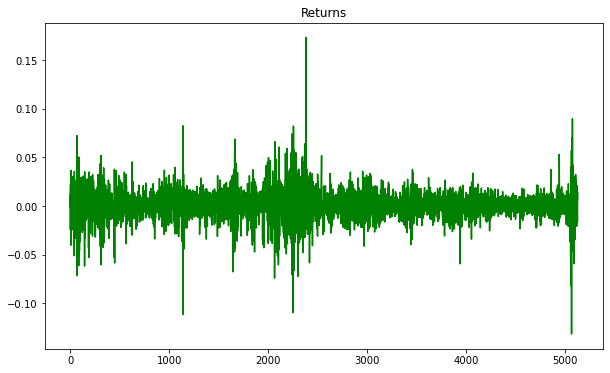

In [8]:
# Plotting returns

returns = close / close.shift(1) - 1

plt.figure(figsize = (10,6))
returns.plot(label='Return', color = 'g')
plt.title("Returns")
plt.show()

In [9]:
train = df_prices[:1000]
test = df_prices[1000:]

In [13]:
def test_stationarity(timeseries):
    rolmean = timeseries.rolling(20).mean()
    rolstd = timeseries.rolling(20).std()

    plt.figure(figsize = (10,8))
    plt.plot(timeseries, color = 'y', label = 'original')
    plt.plot(rolmean, color = 'r', label = 'rolling mean')
    plt.plot(rolstd, color = 'b', label = 'rolling std')
    plt.xlabel('Date')
    plt.legend()
    plt.title('Rolling Mean and Standard Deviation',  fontsize = 20)
    plt.show(block = False)
 
    print('Results of dickey fuller test')
    result = adfuller(timeseries, autolag = 'AIC')
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result, labels):
        print(label+ ' : ' + str(value))
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary")
    else:
        print("Weak evidence against null hypothesis, time series is non-stationary ")
    test_stationarity(train['Close'])

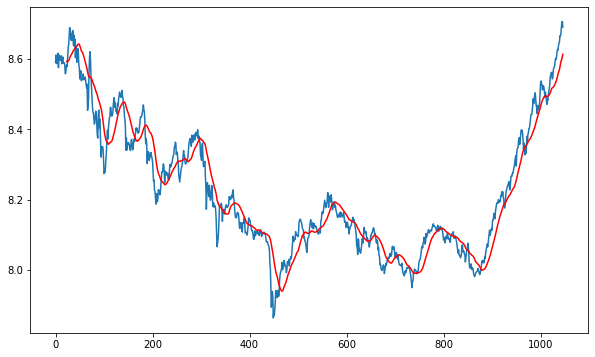

In [14]:
train_log = np.log(train['Close']) 
test_log = np.log(test['Close'])

mav = train_log.rolling(24).mean() 
plt.figure(figsize = (10,6))
plt.plot(train_log) 
plt.plot(mav, color = 'red') 
plt.show()

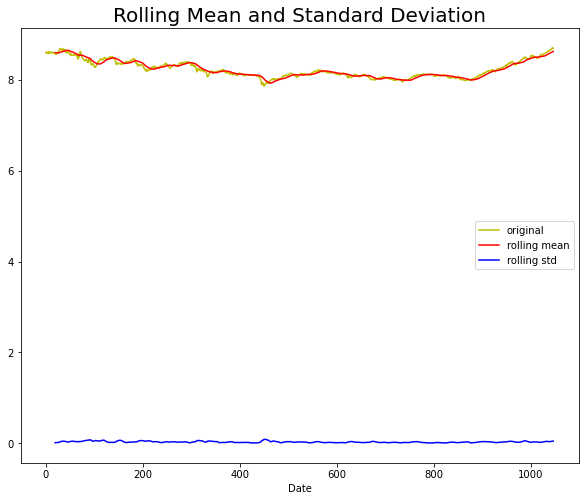

Results of dickey fuller test
ADF Test Statistic : -1.134751292484556
p-value : 0.7010164676681914
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


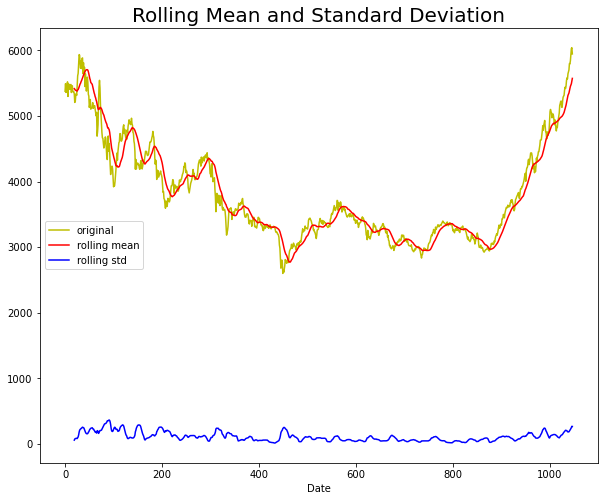

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


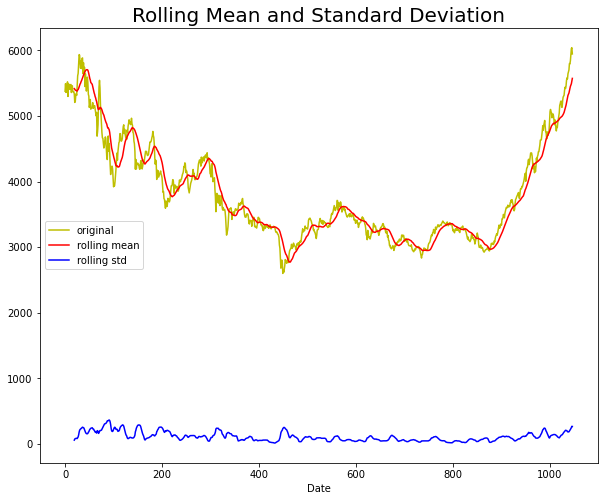

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


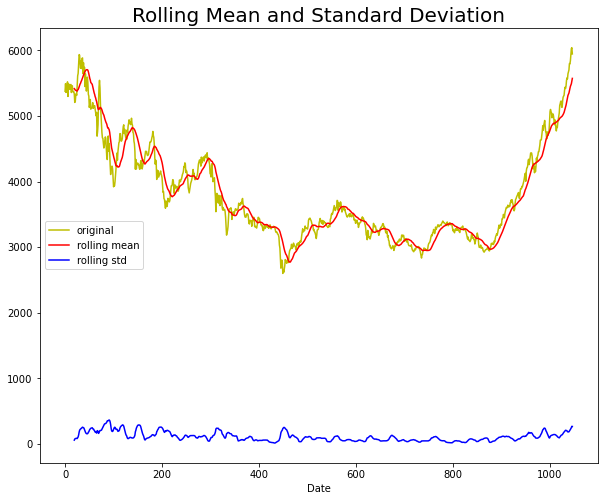

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


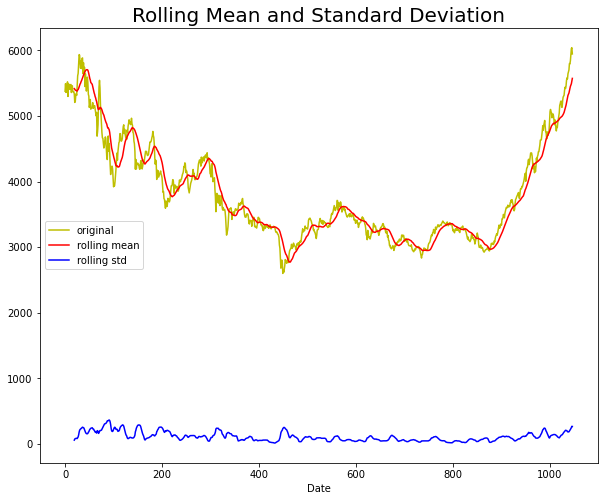

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


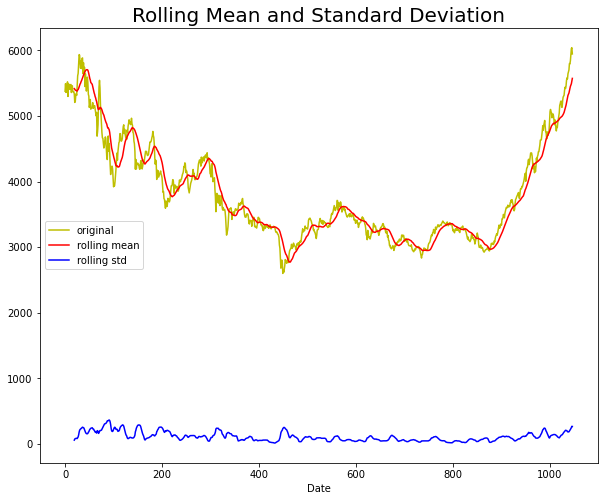

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


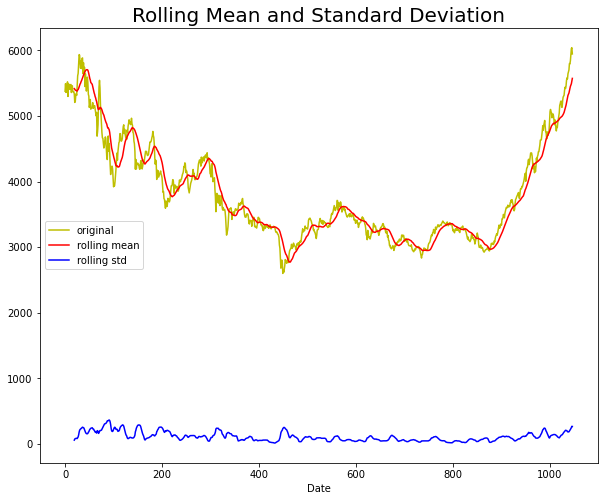

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


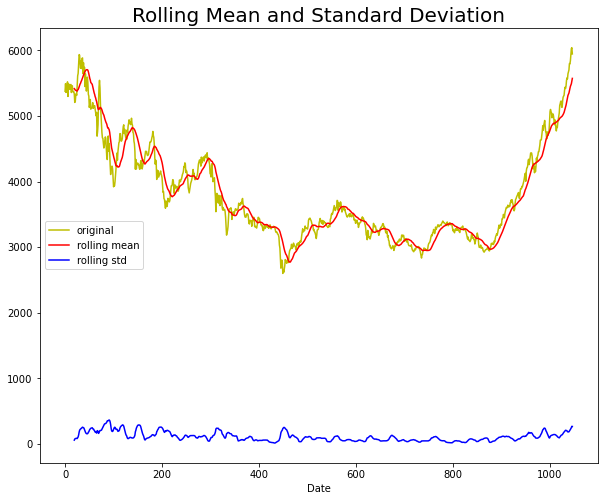

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


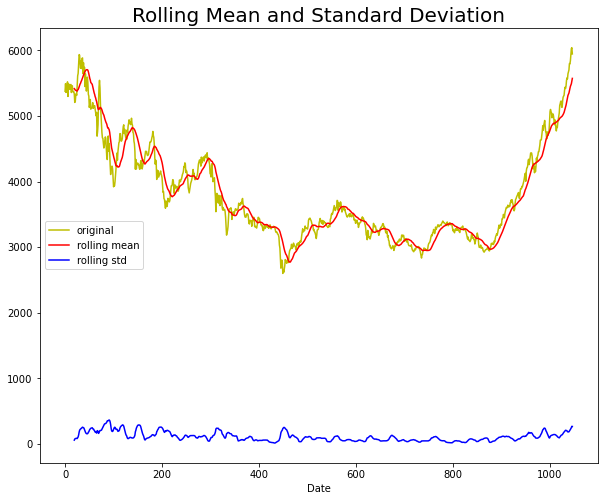

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


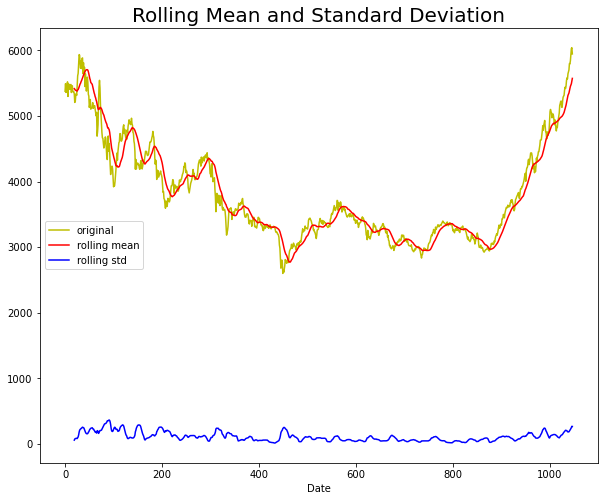

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


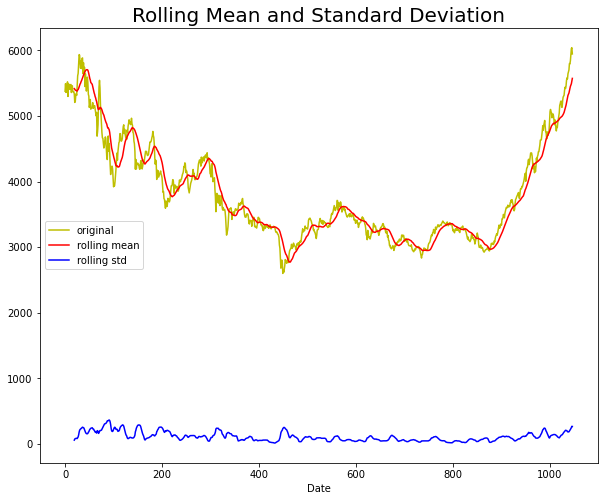

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


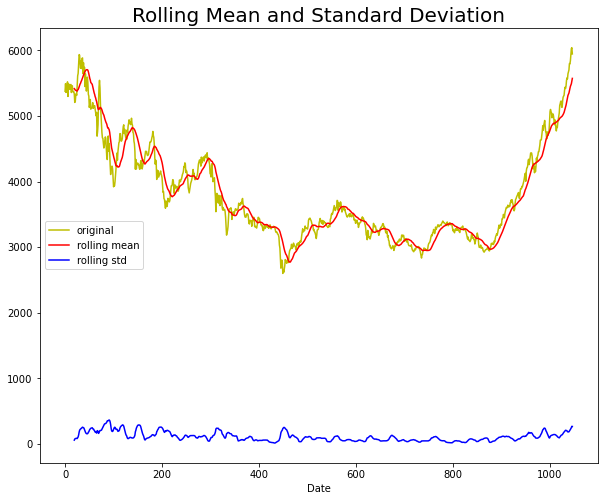

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


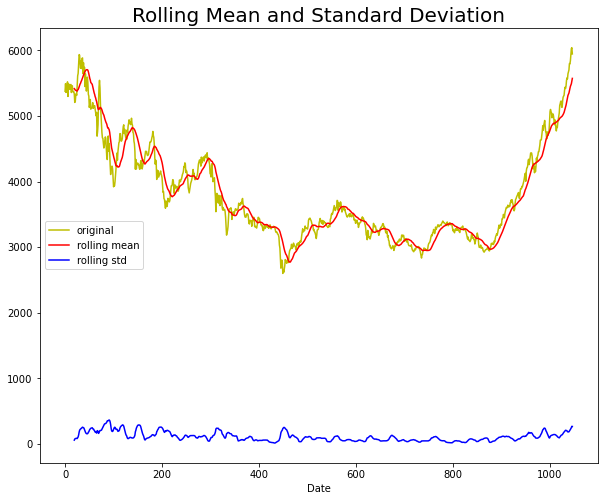

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


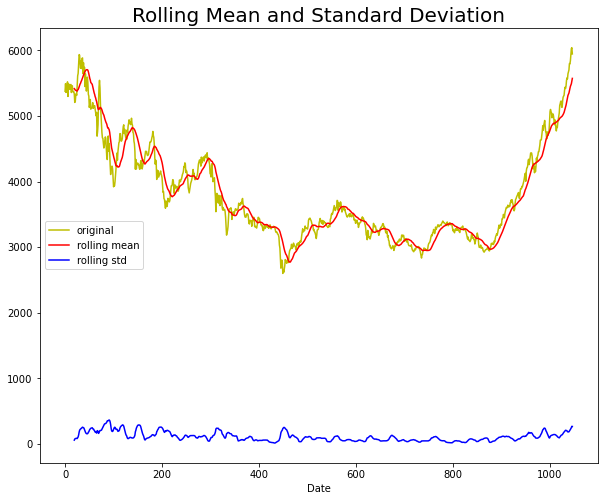

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


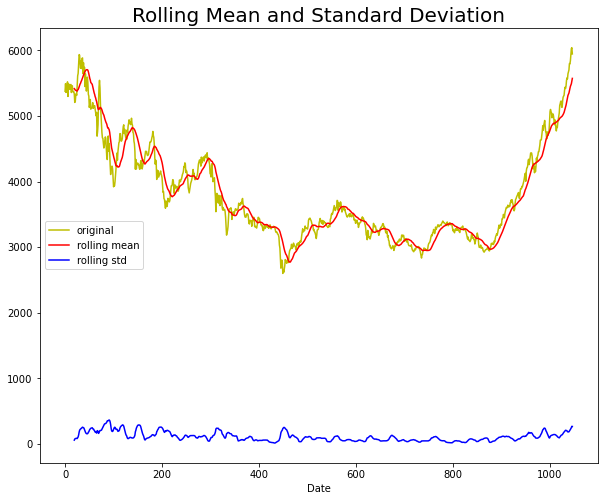

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


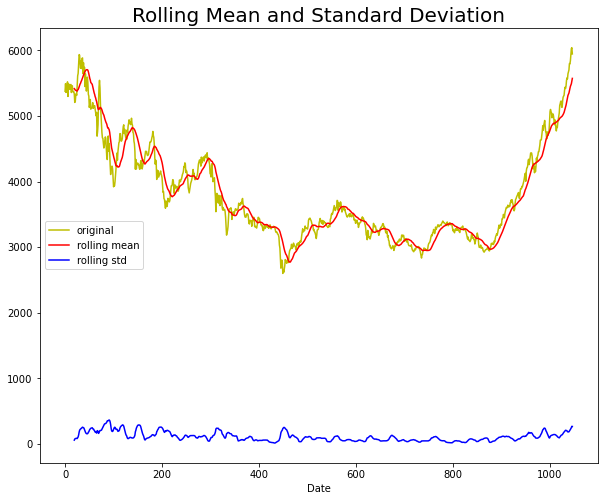

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


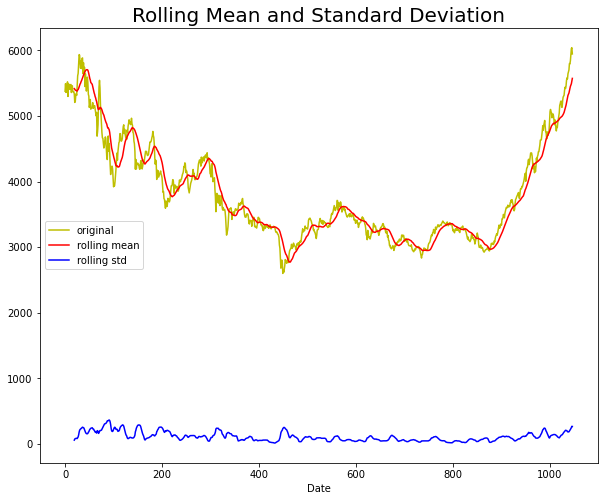

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


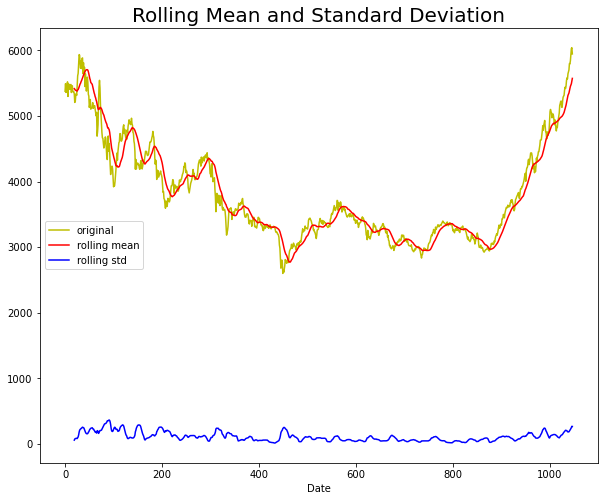

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


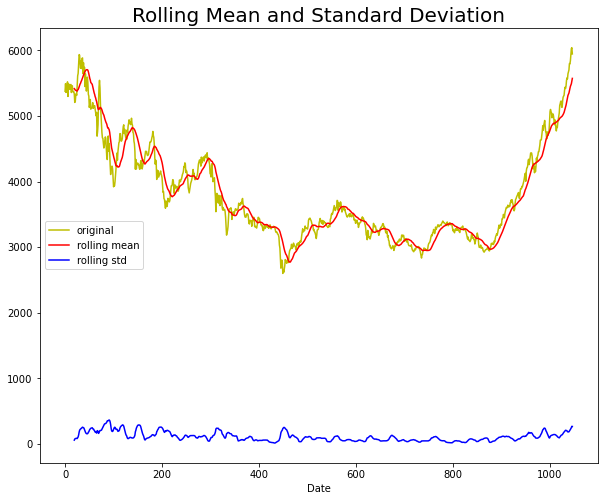

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


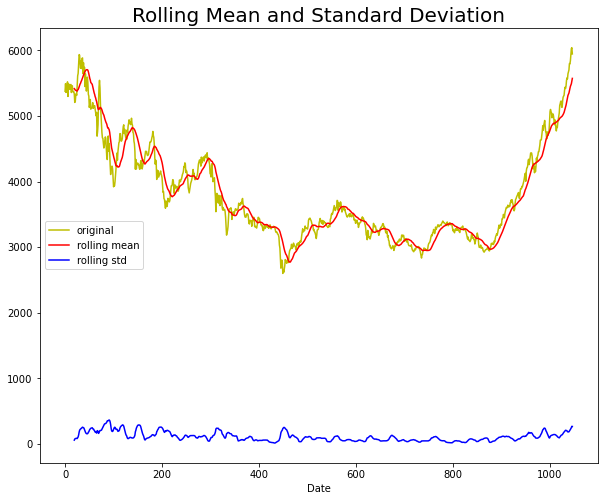

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


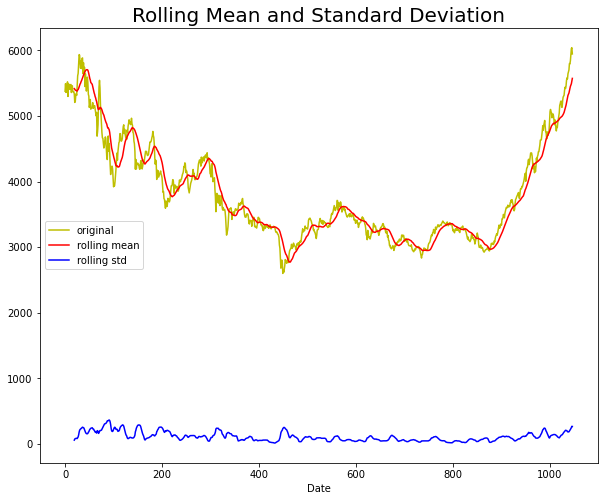

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


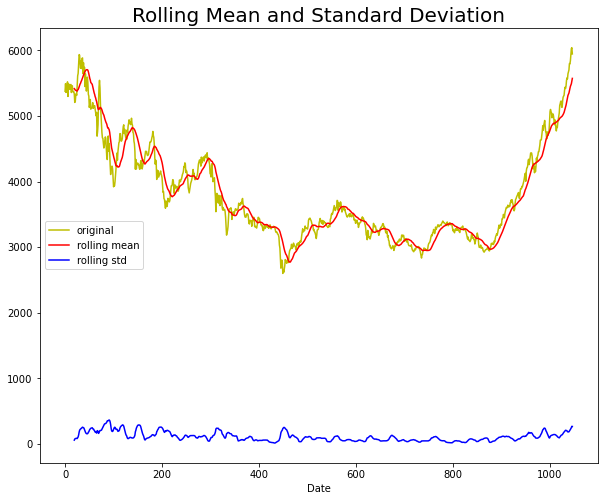

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


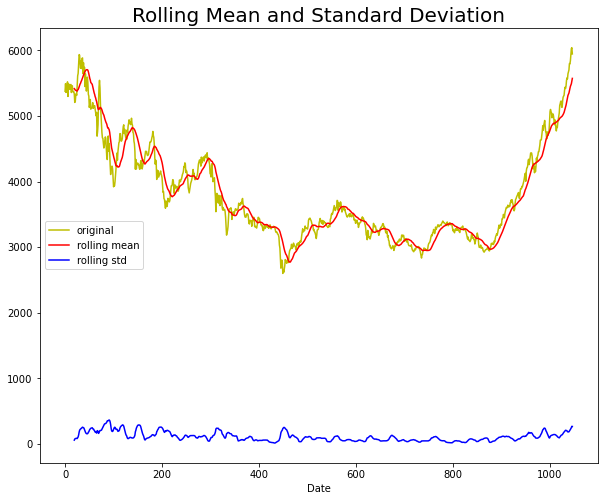

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


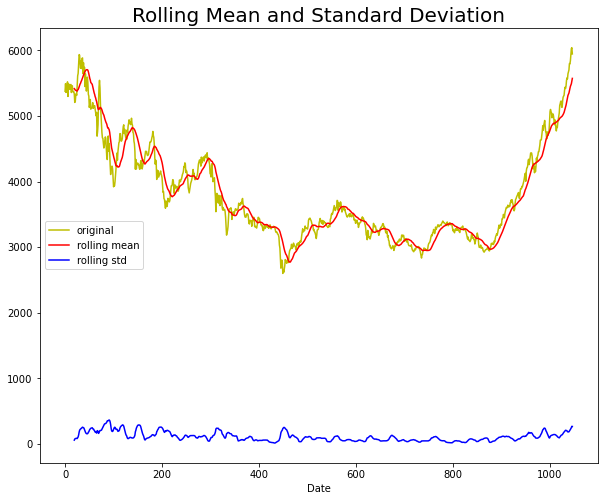

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


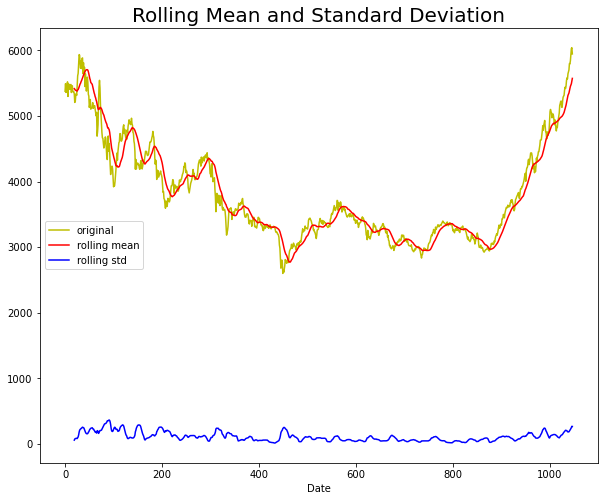

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


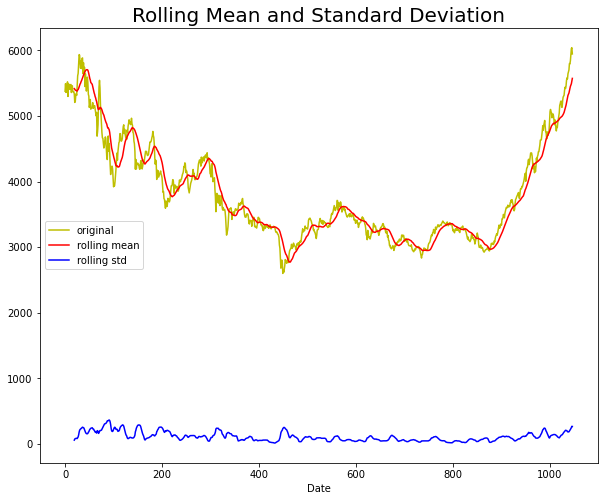

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


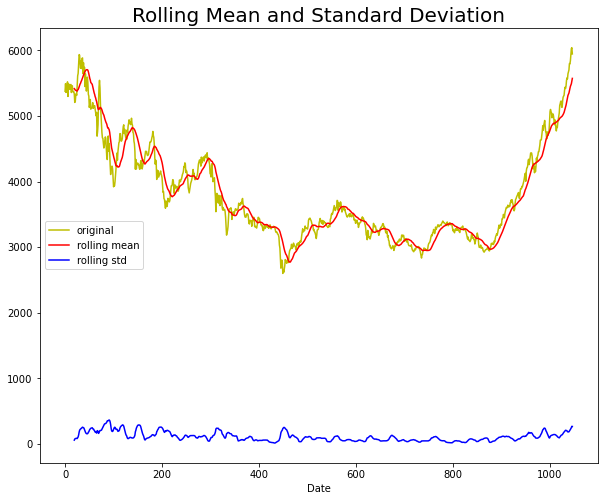

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


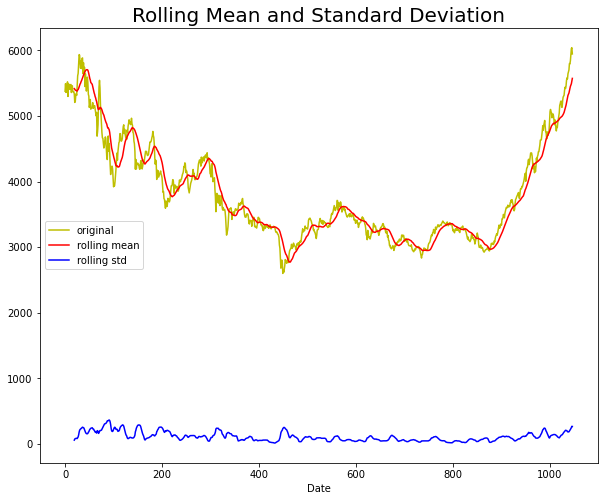

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


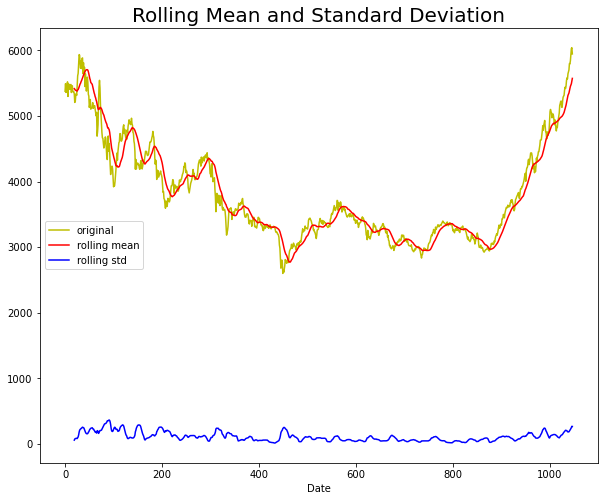

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


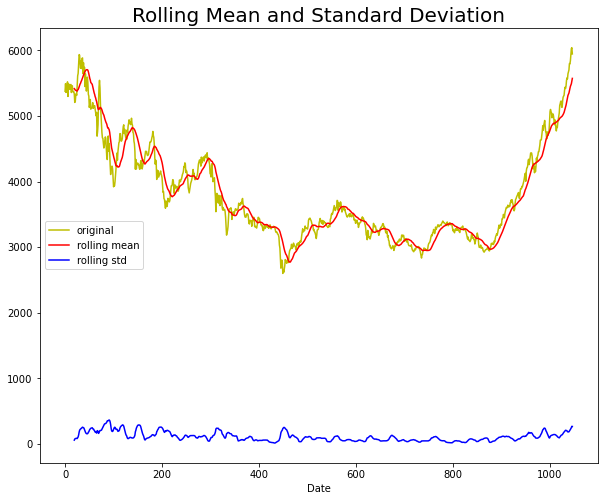

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


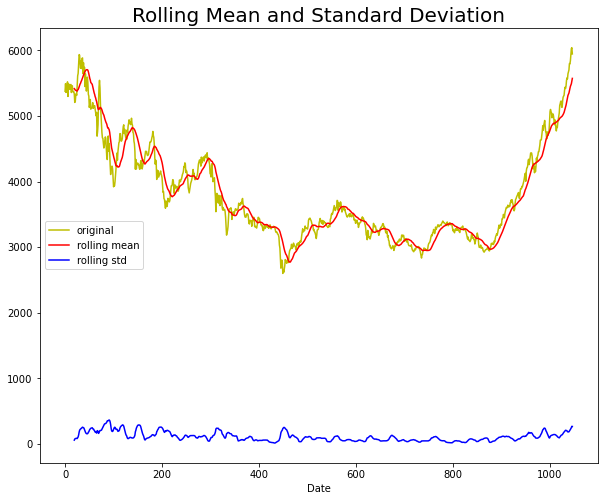

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


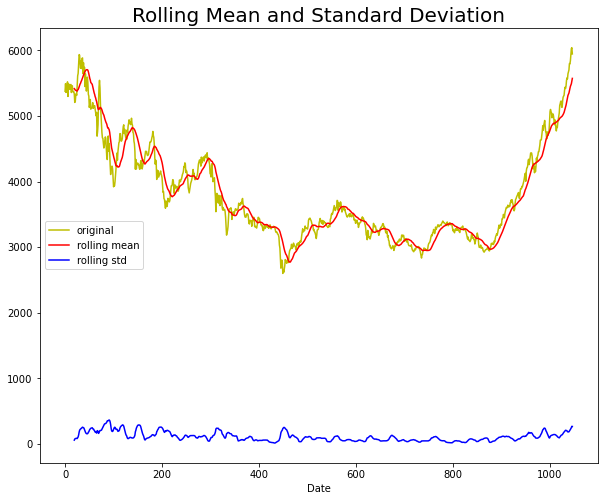

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


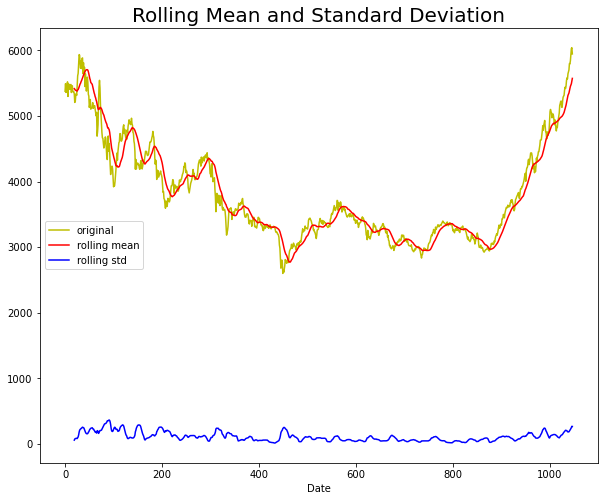

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


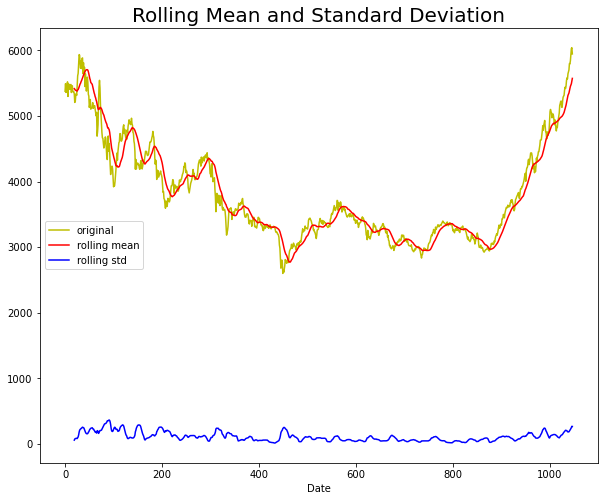

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


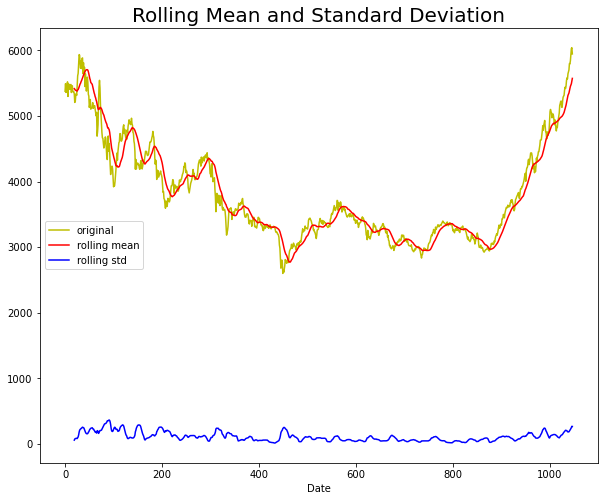

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


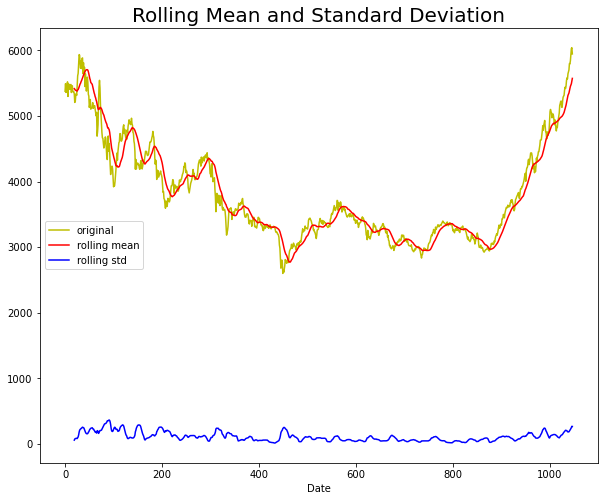

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


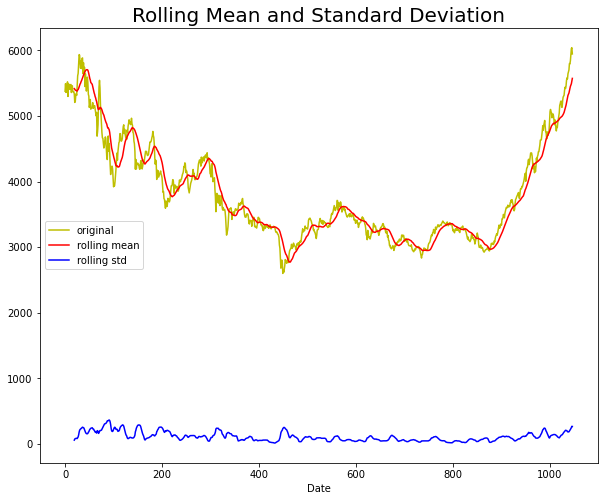

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


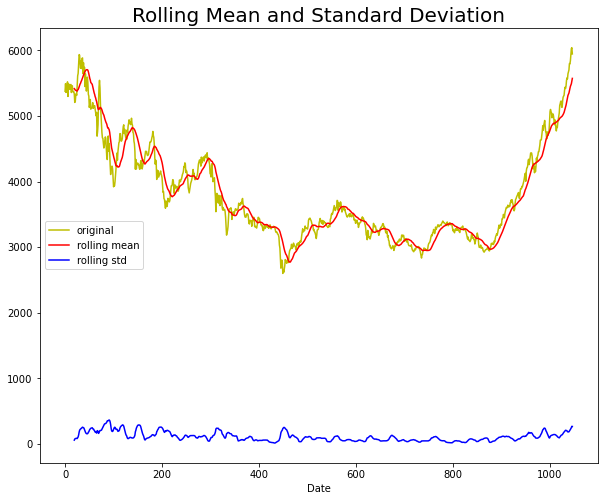

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


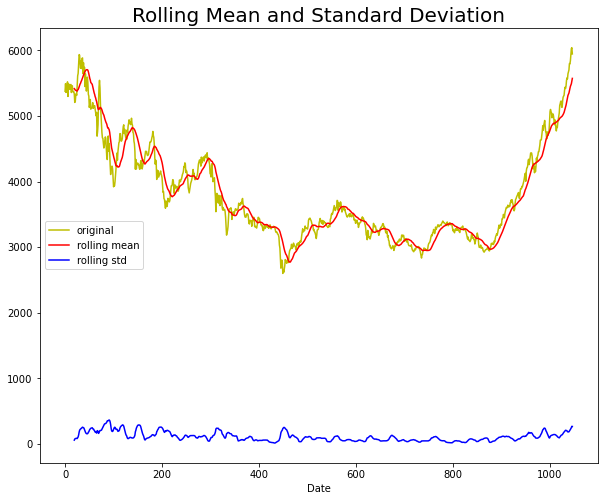

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


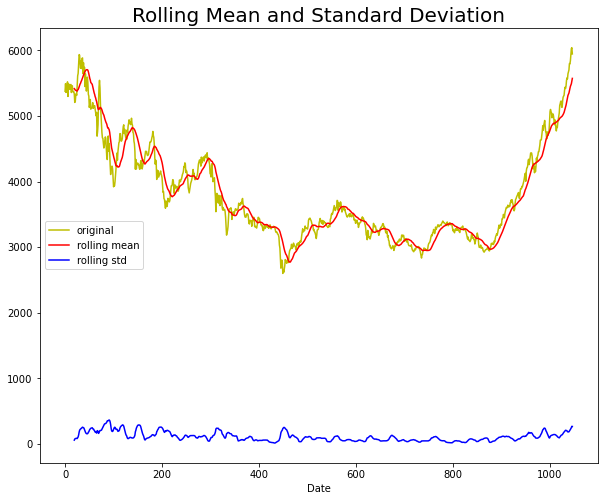

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


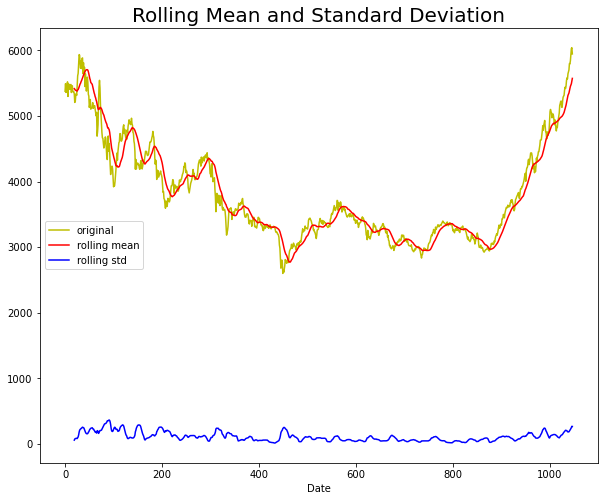

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


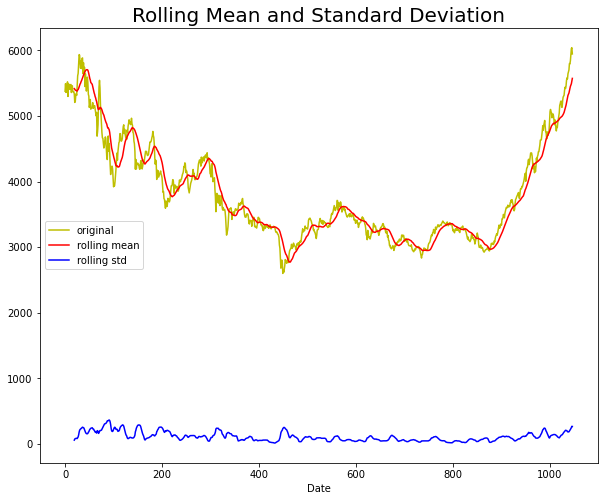

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


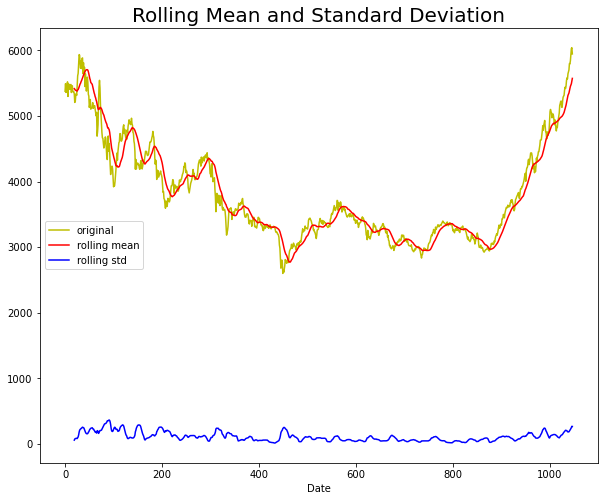

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


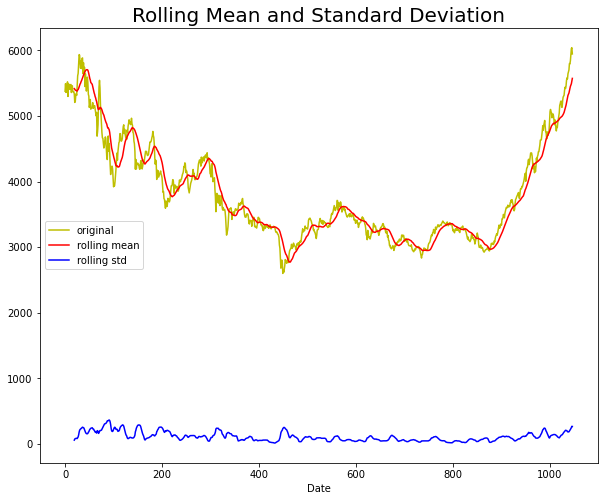

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


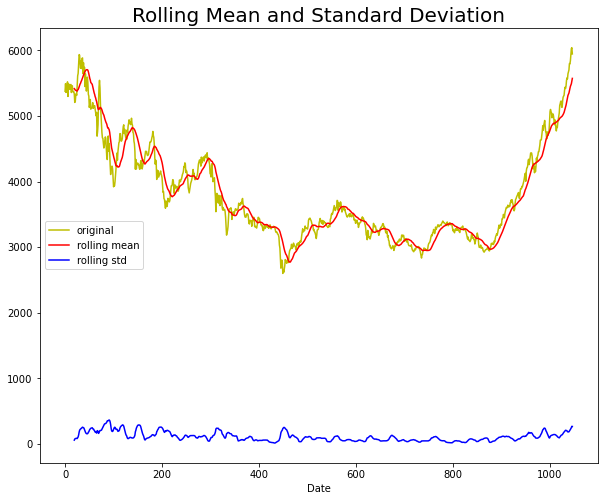

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


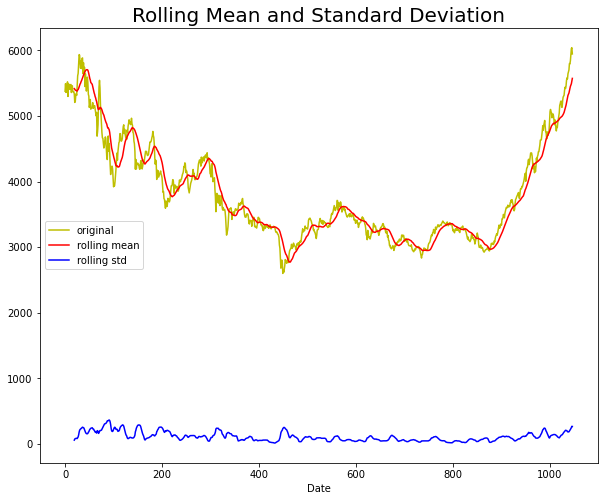

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


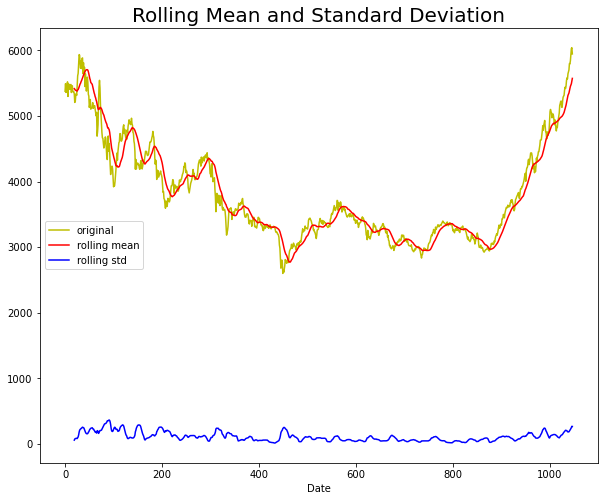

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


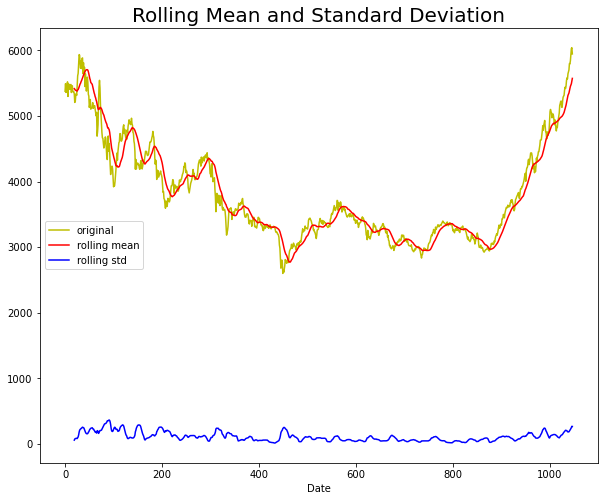

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


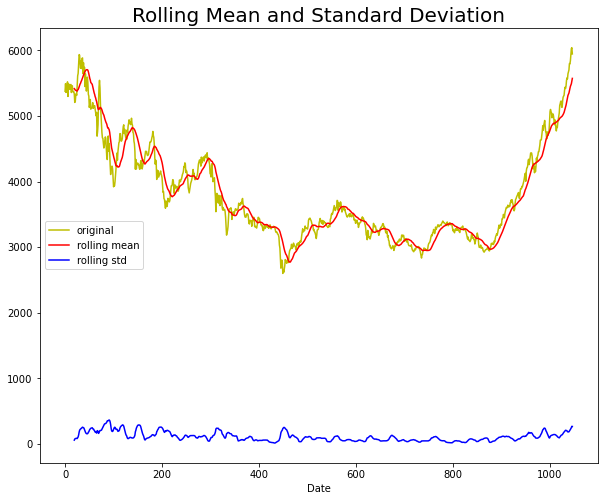

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


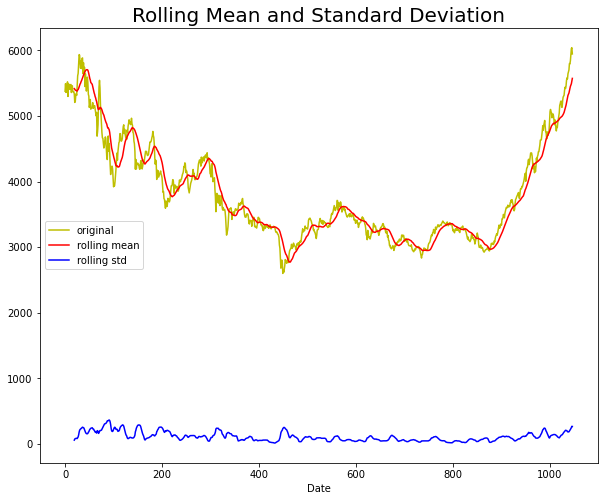

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


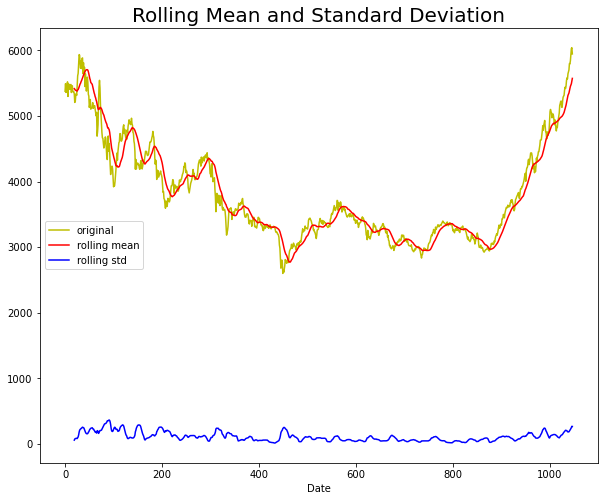

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


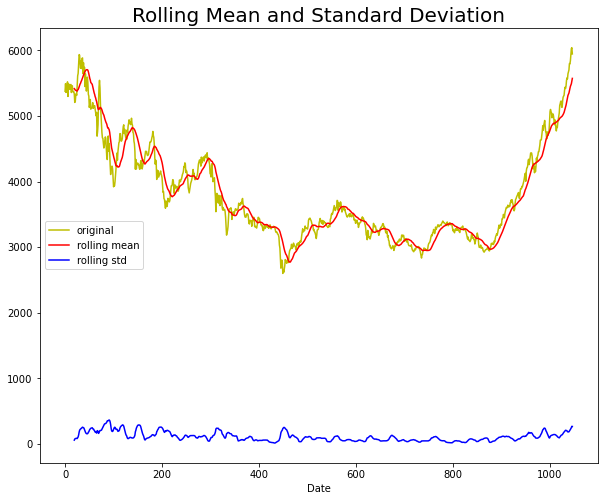

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


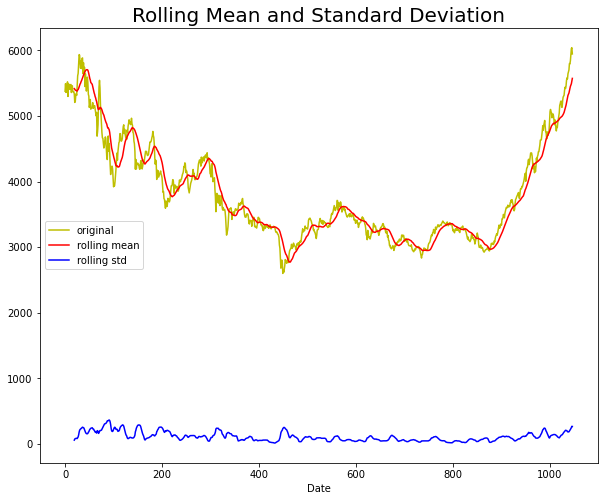

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


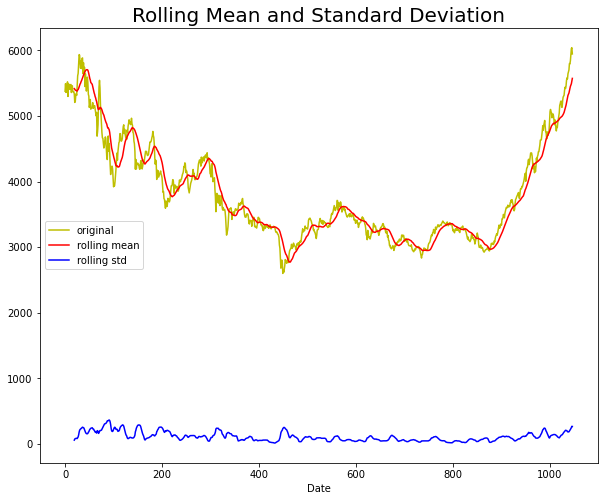

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


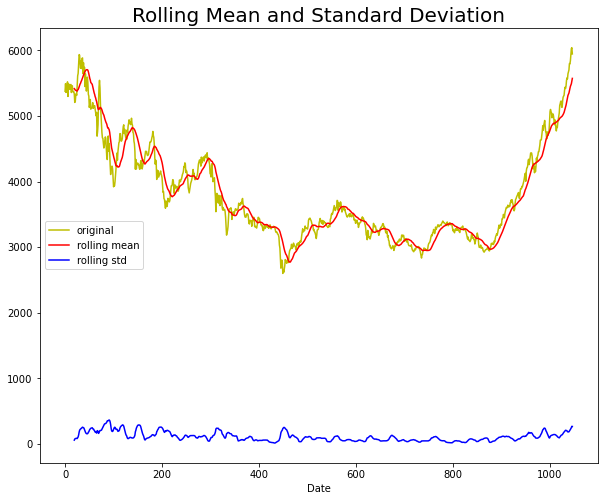

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


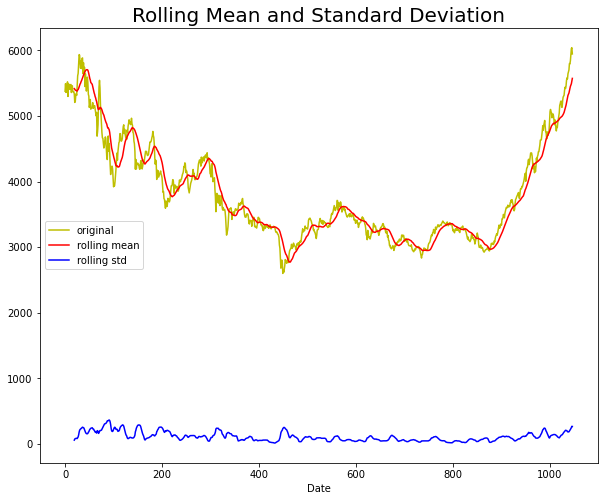

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


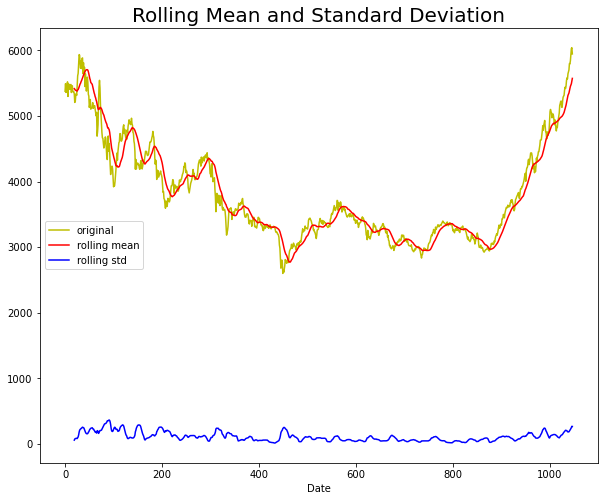

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


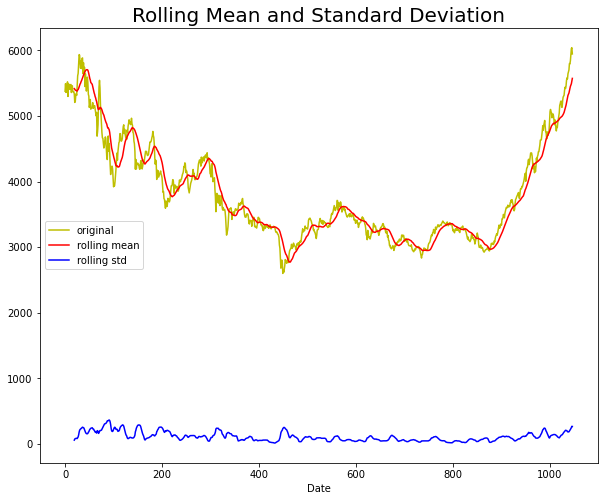

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


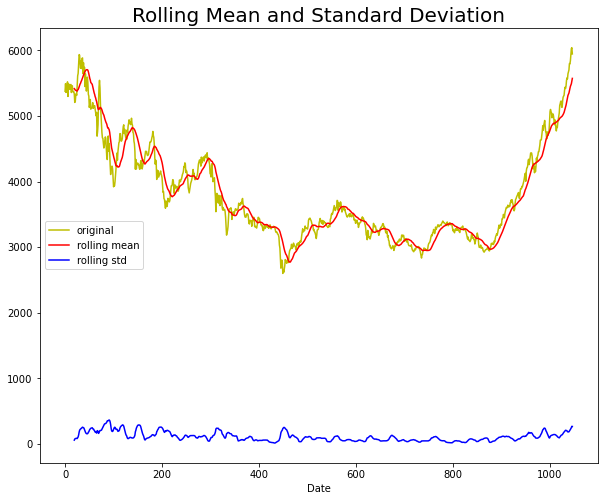

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


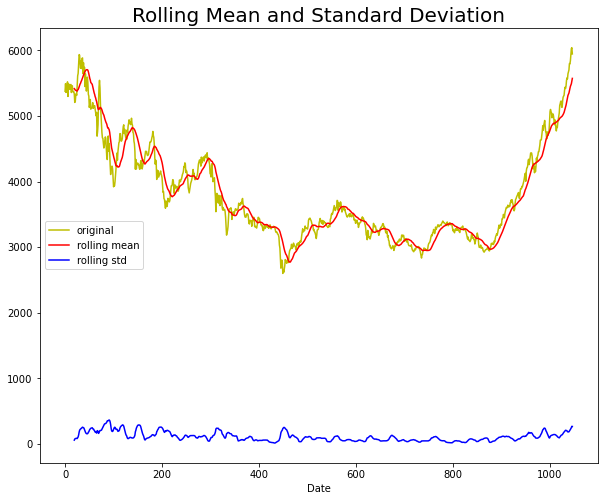

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


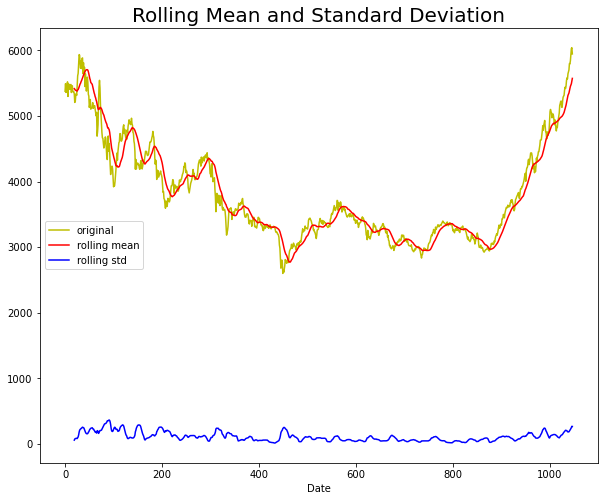

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


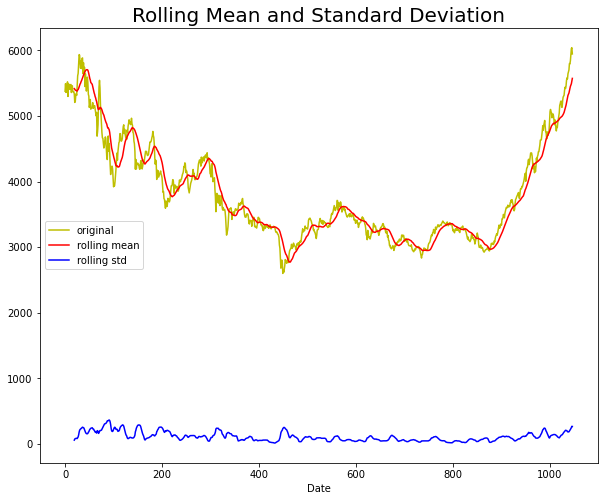

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


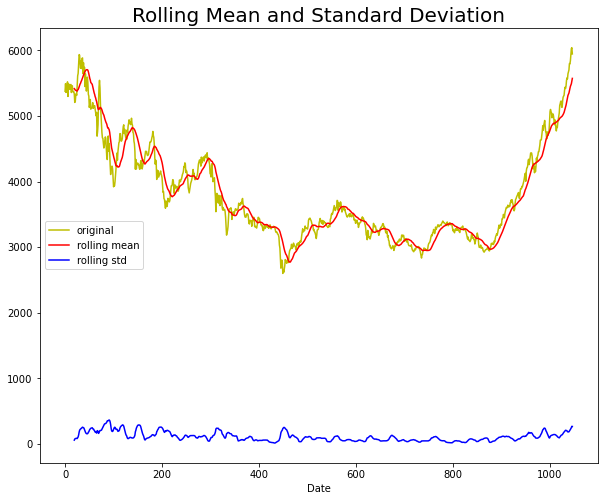

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


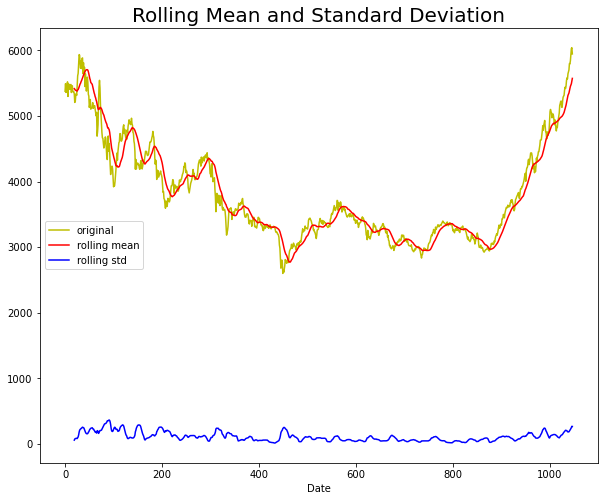

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


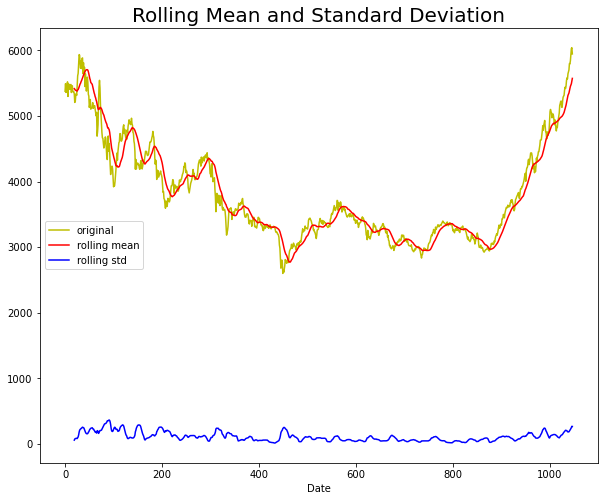

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


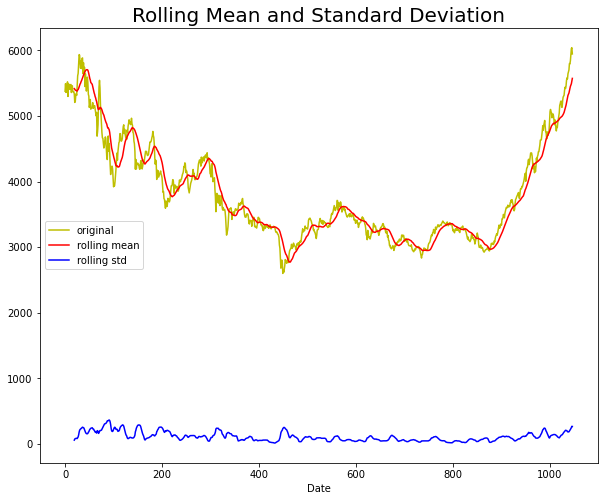

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


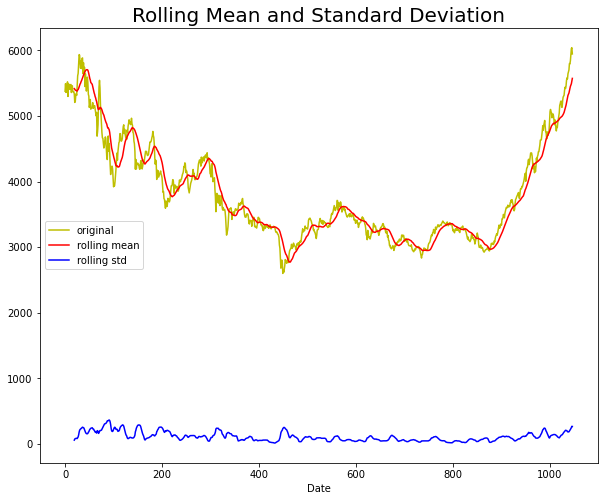

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


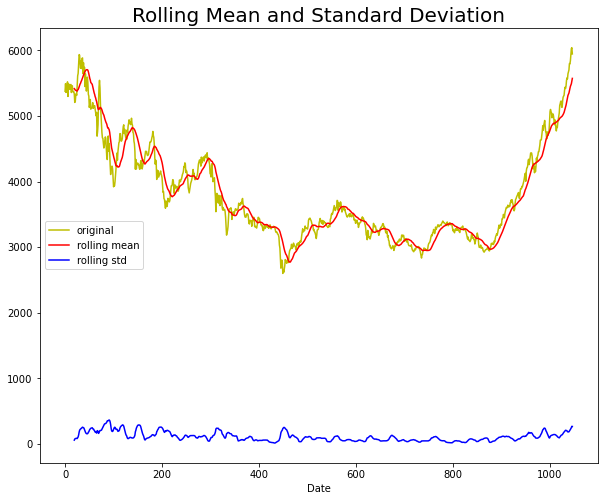

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


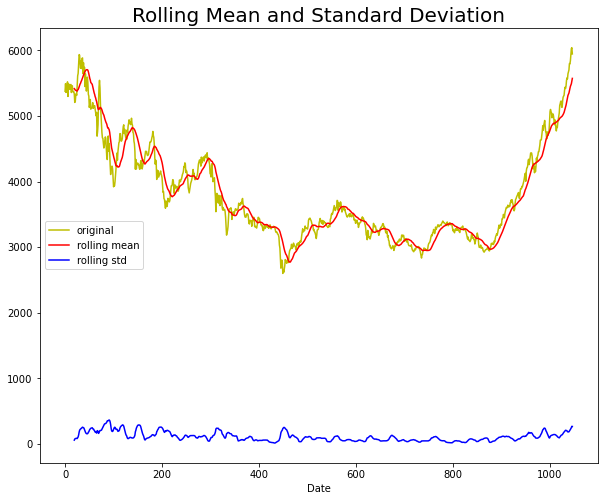

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


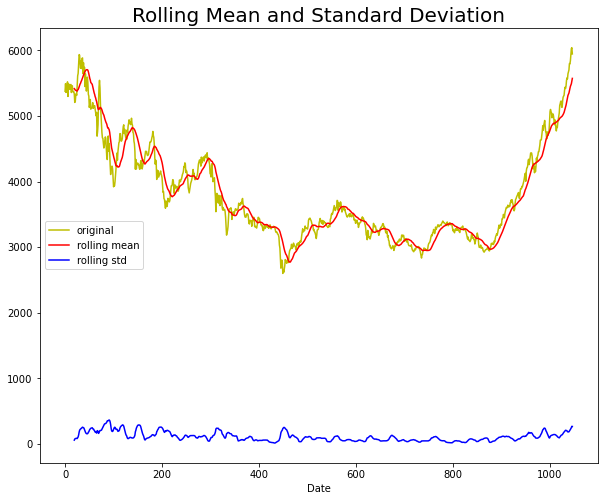

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


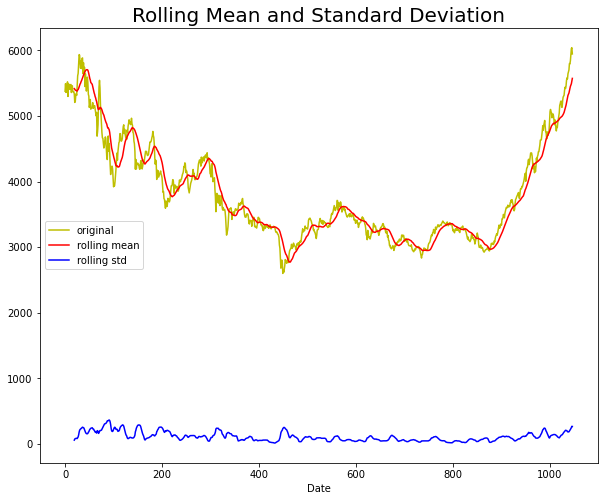

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


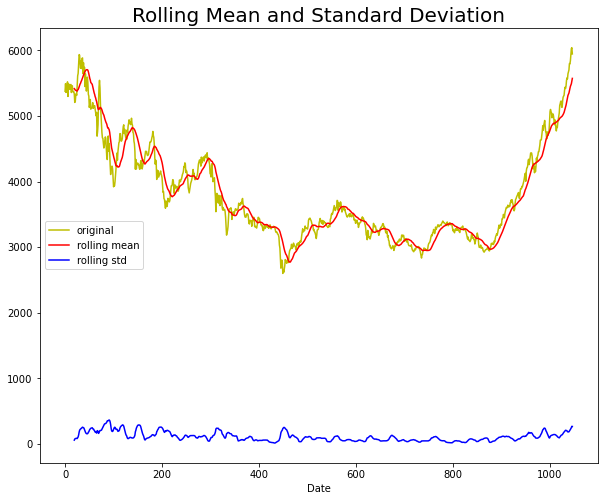

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


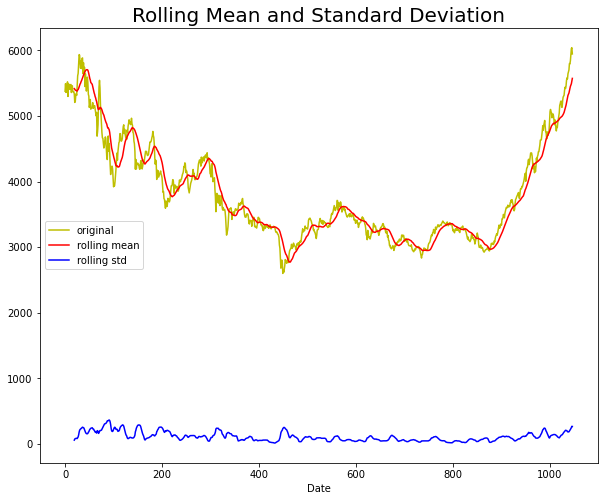

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


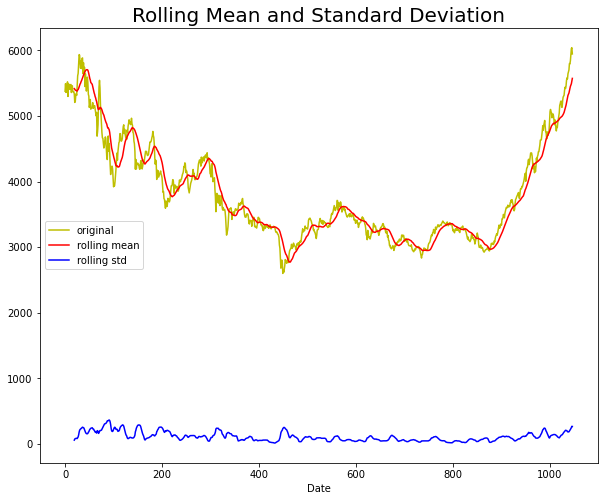

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


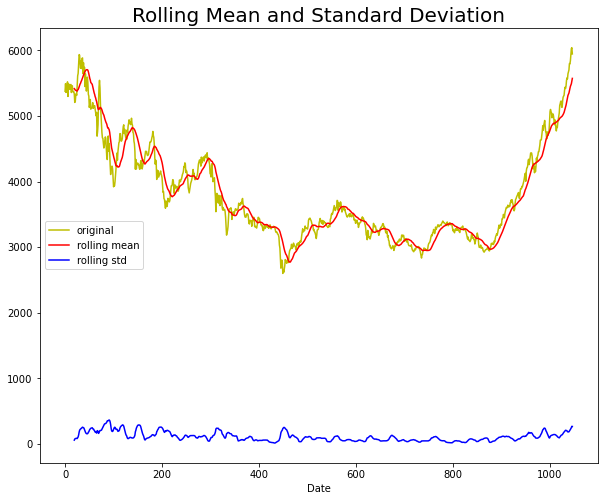

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


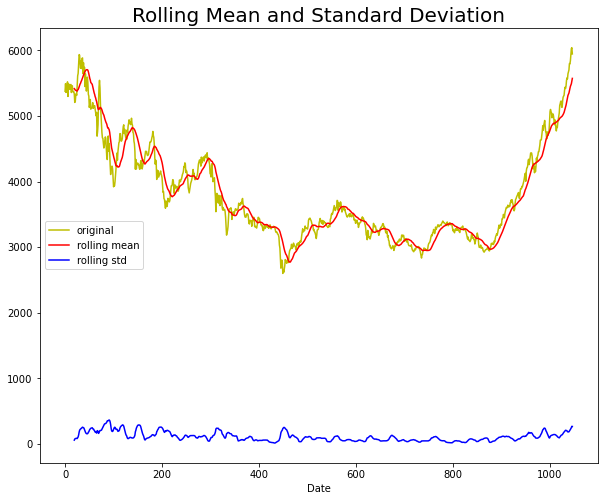

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


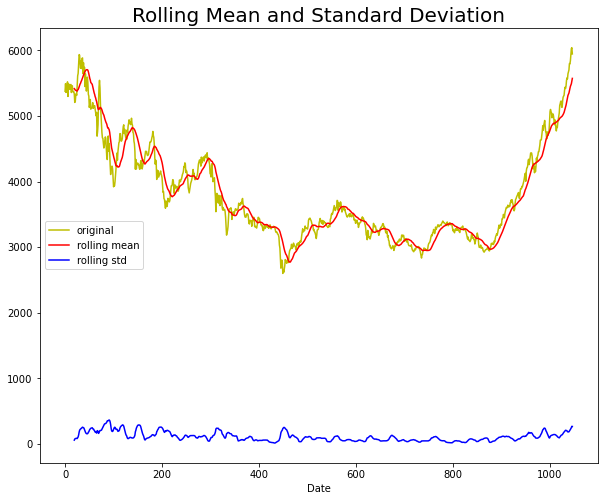

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


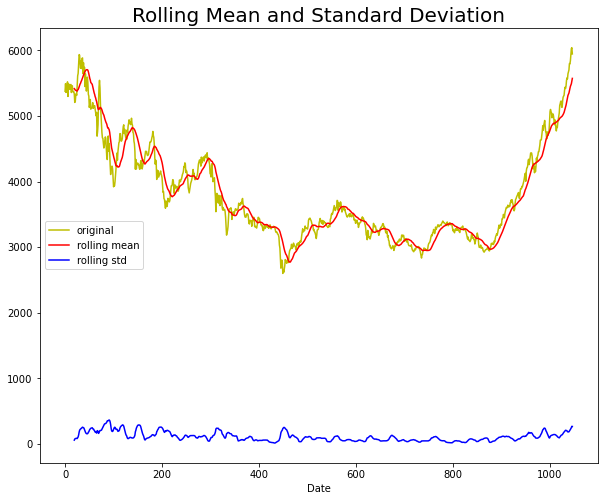

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


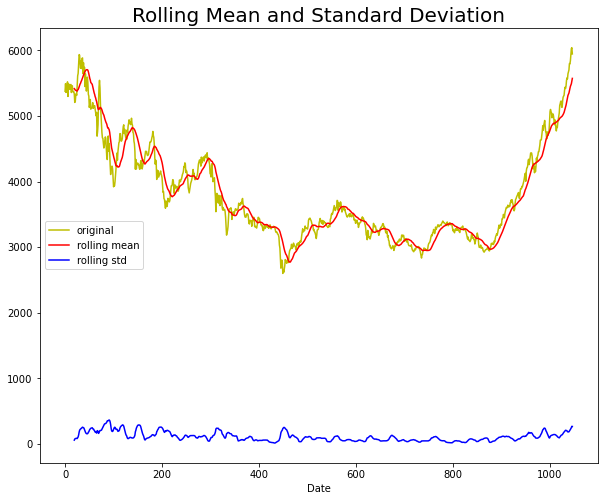

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


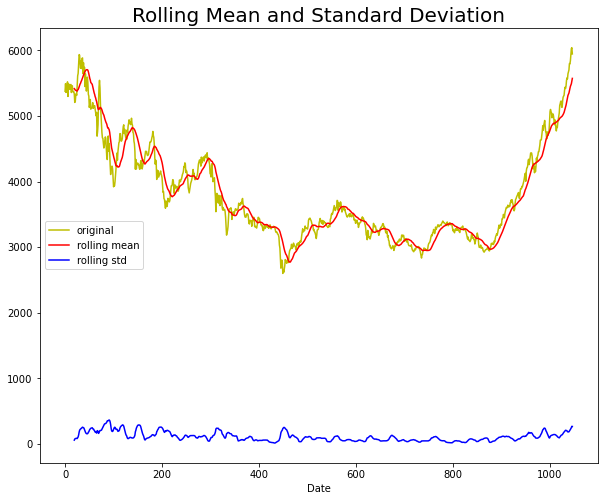

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


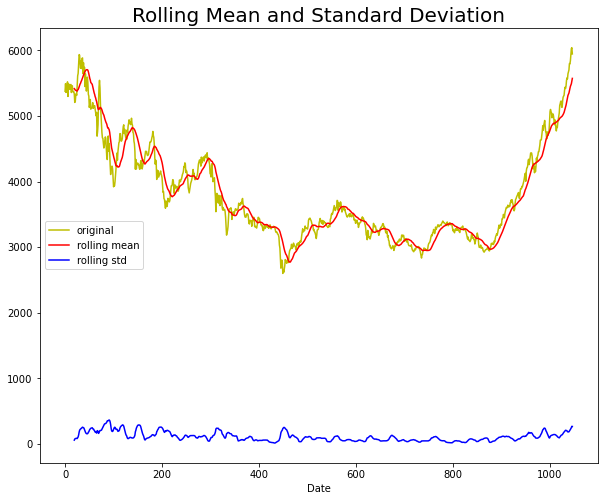

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


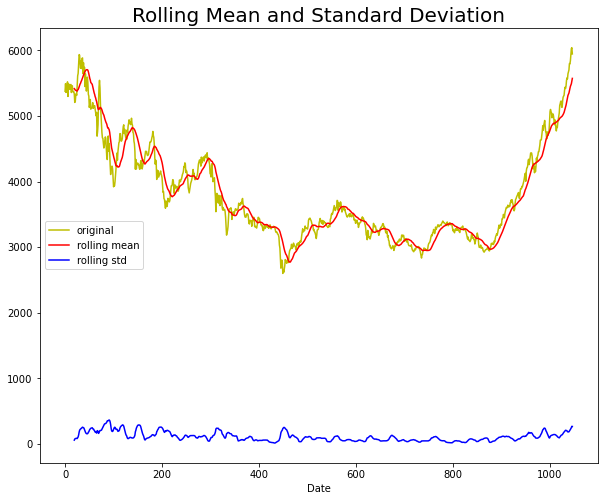

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


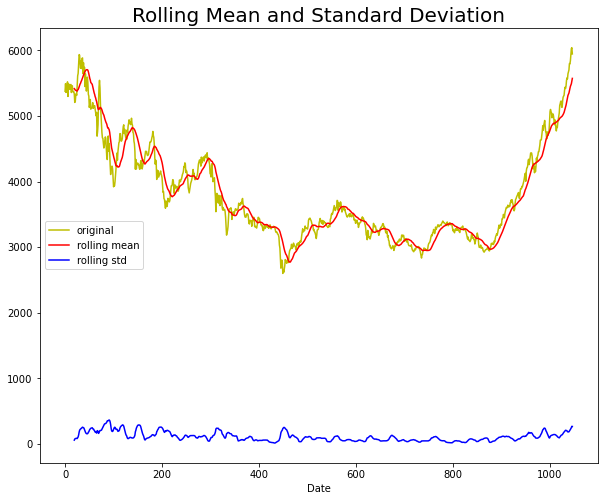

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


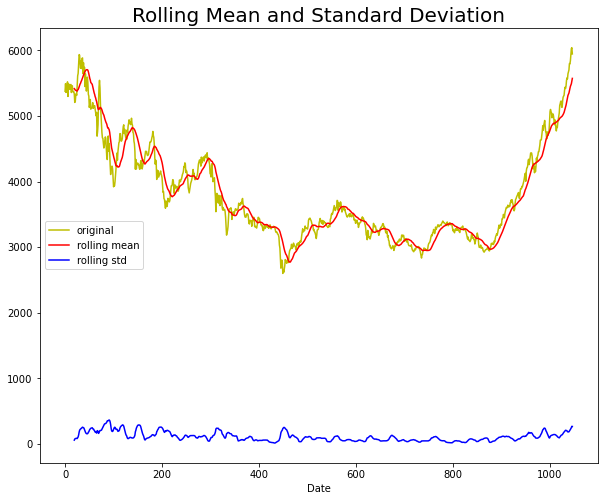

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


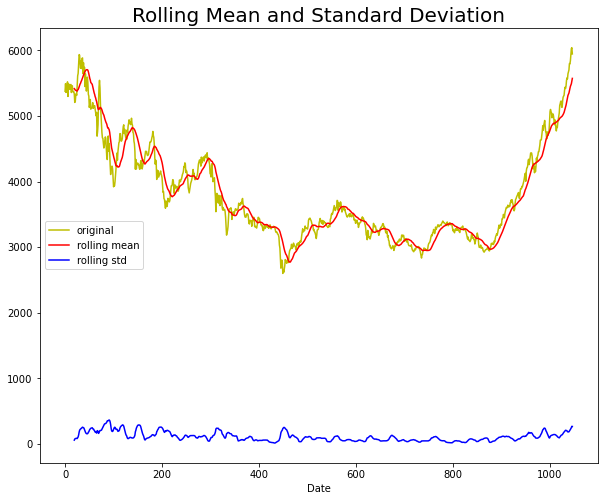

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


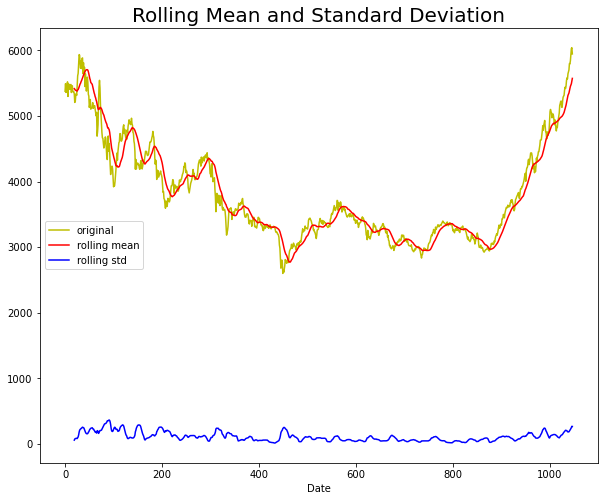

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


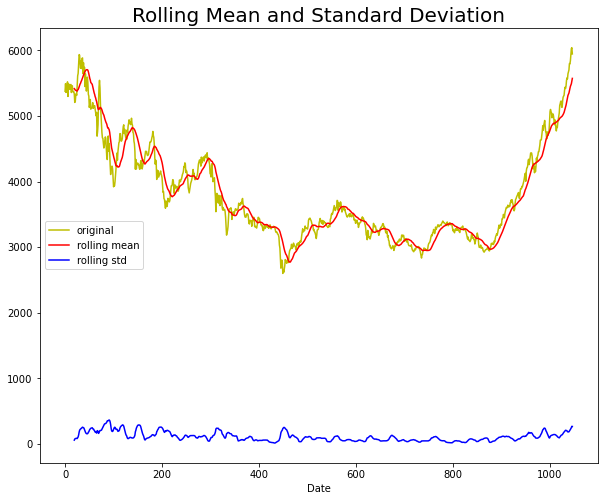

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


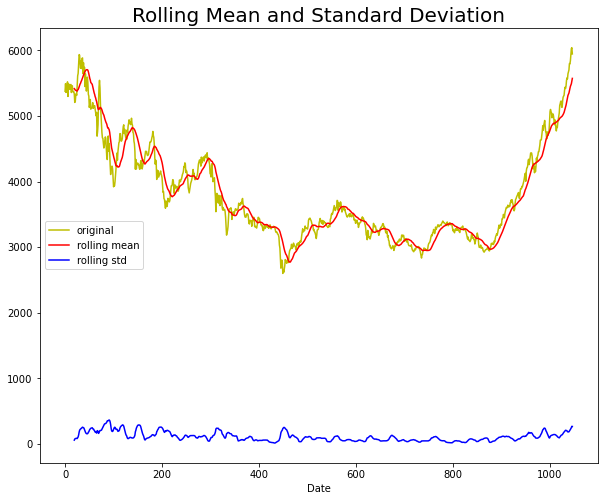

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


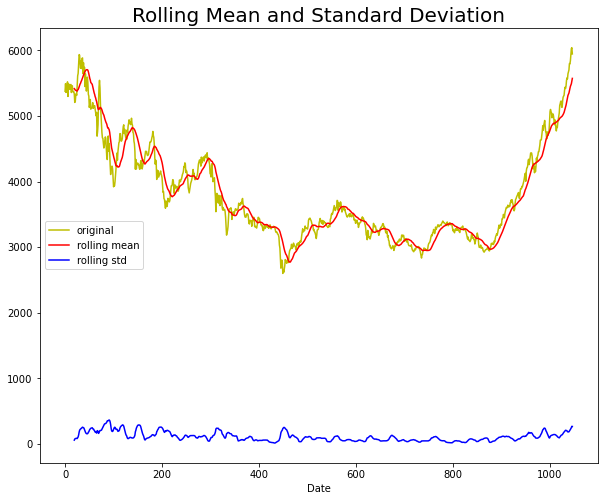

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


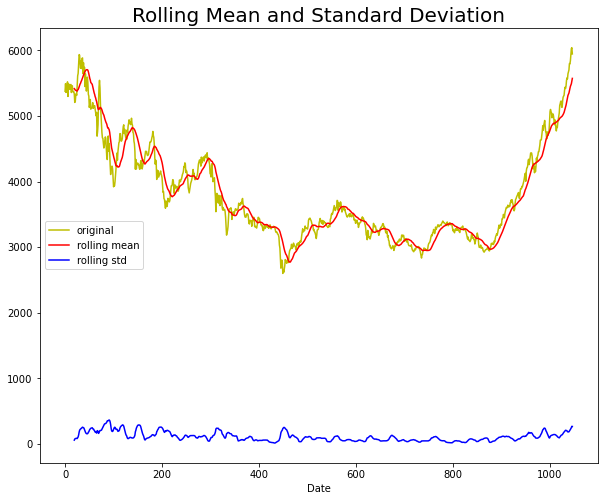

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


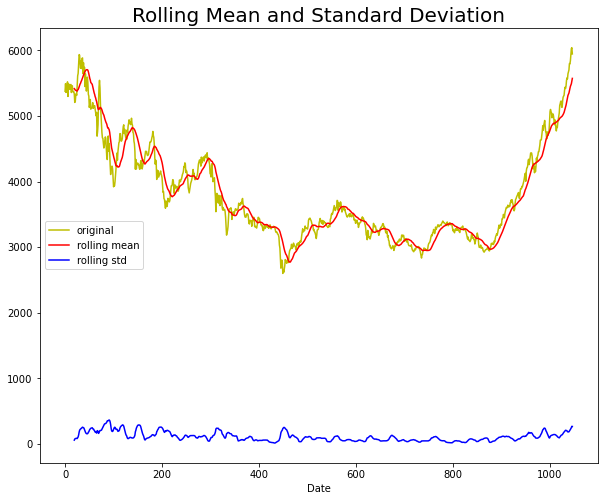

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


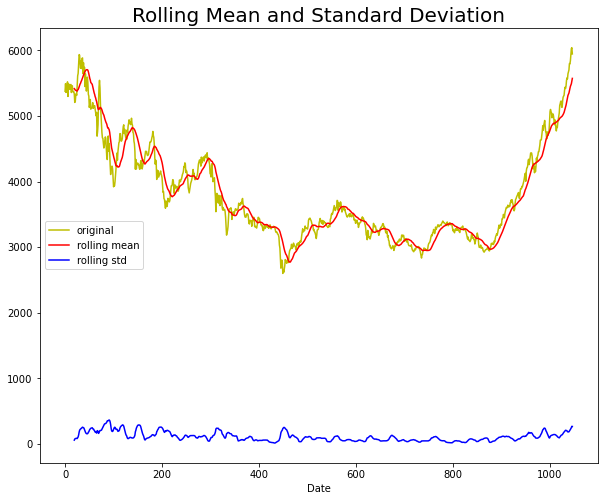

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


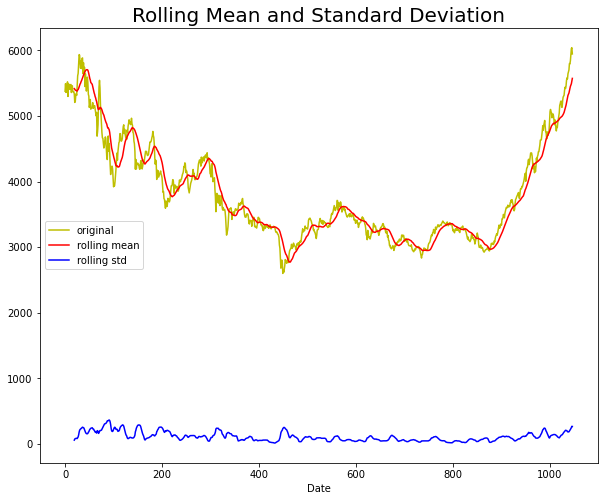

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


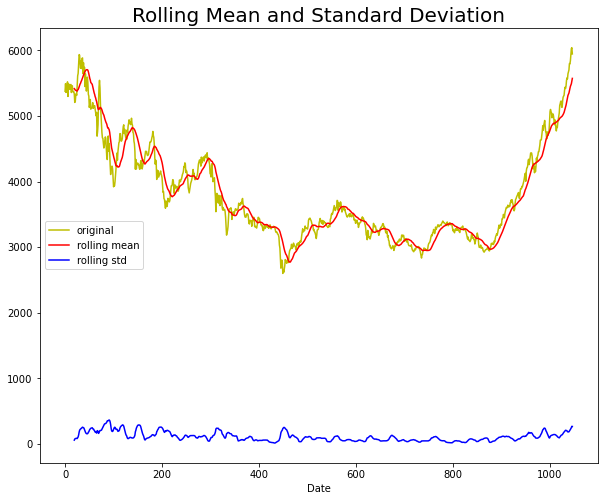

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


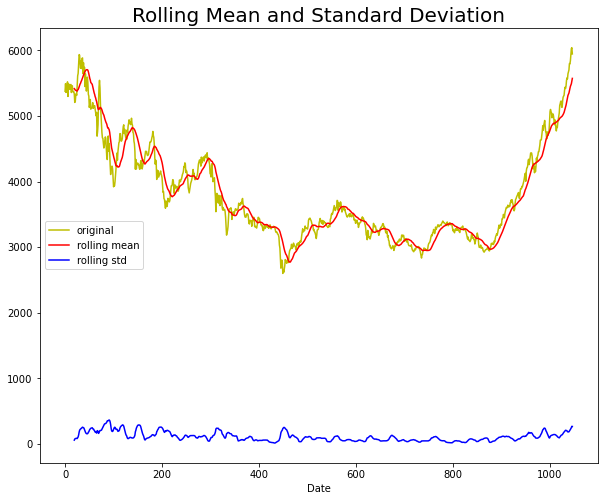

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


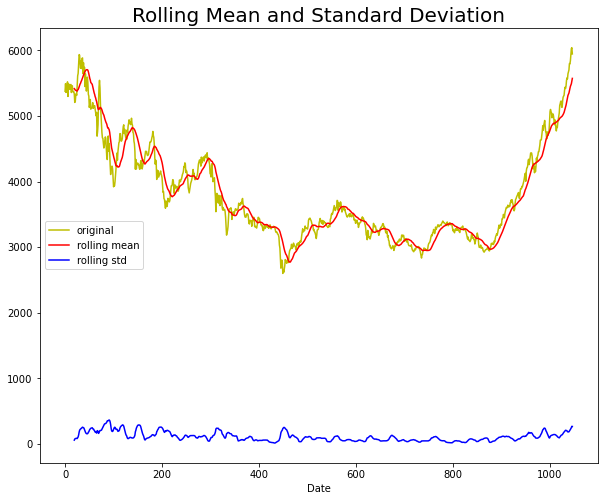

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


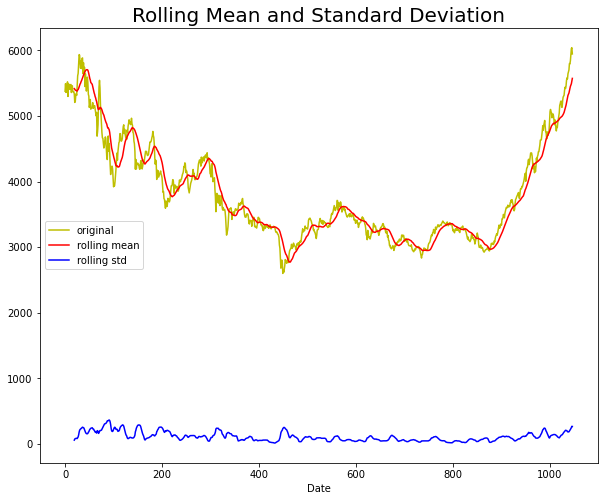

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


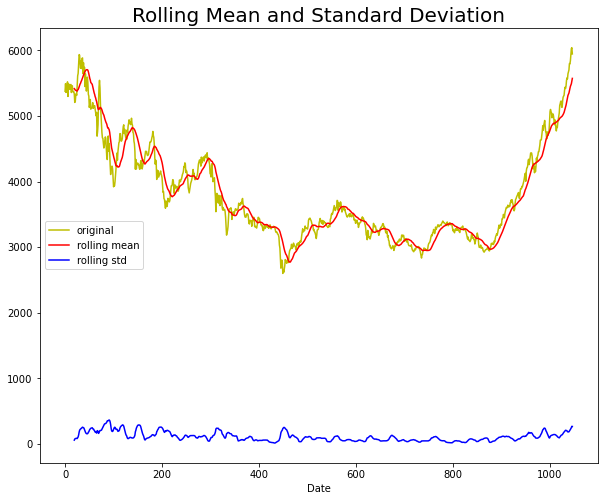

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


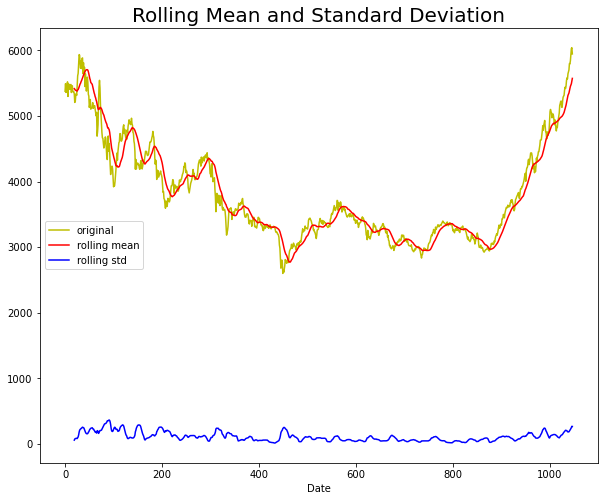

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


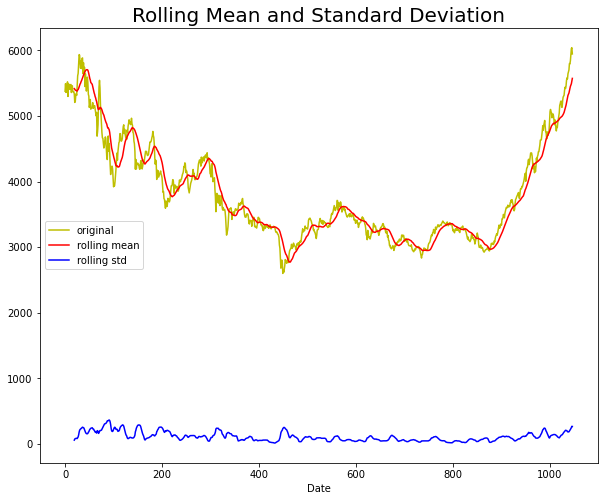

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


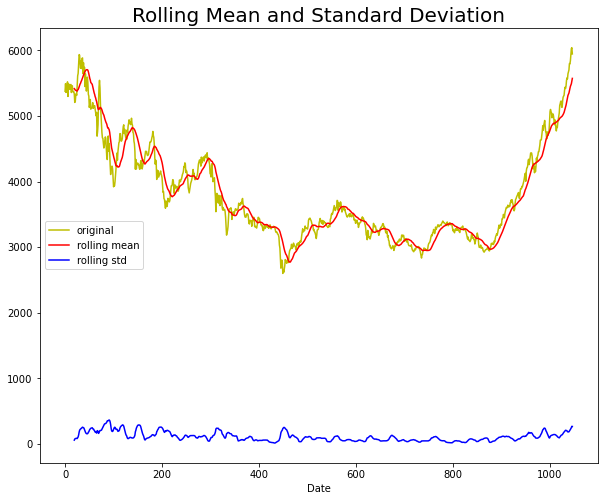

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


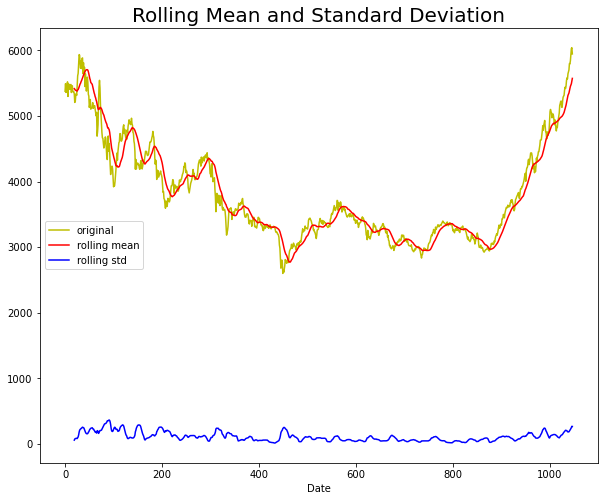

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


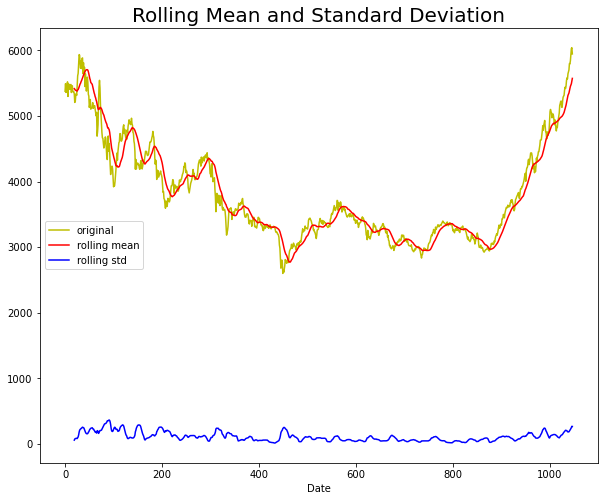

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


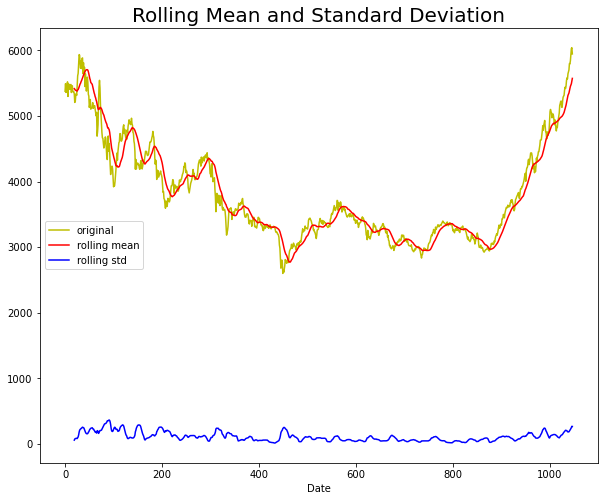

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


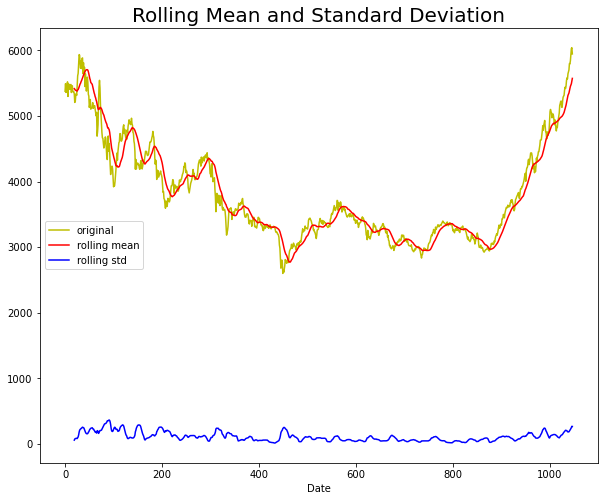

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


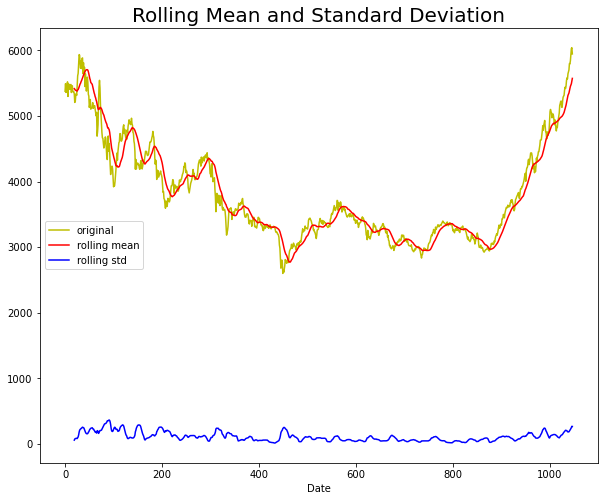

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


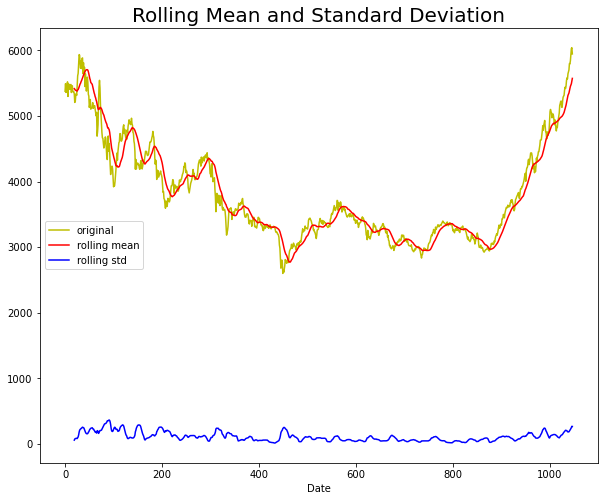

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


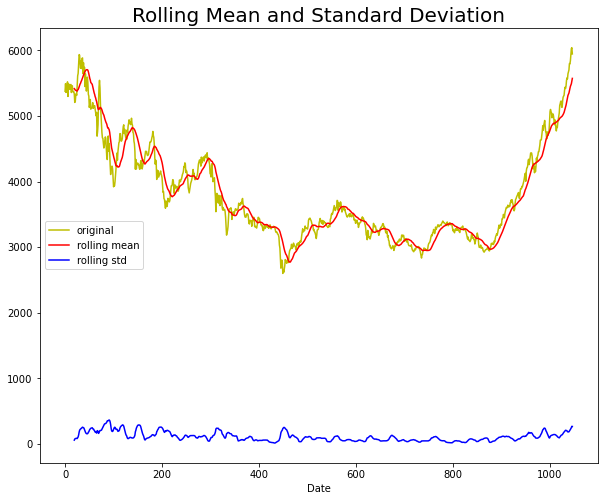

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


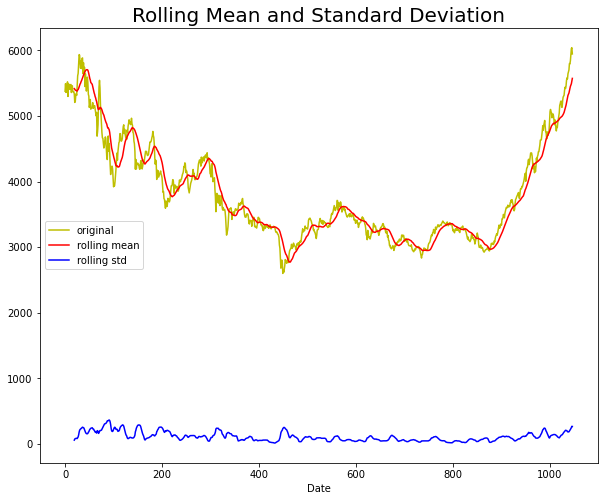

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


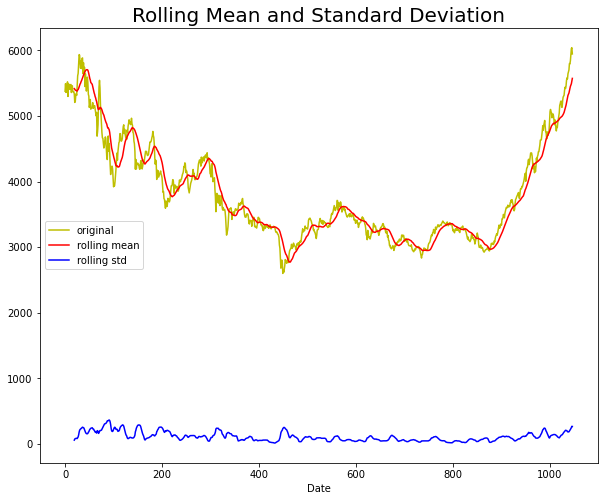

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


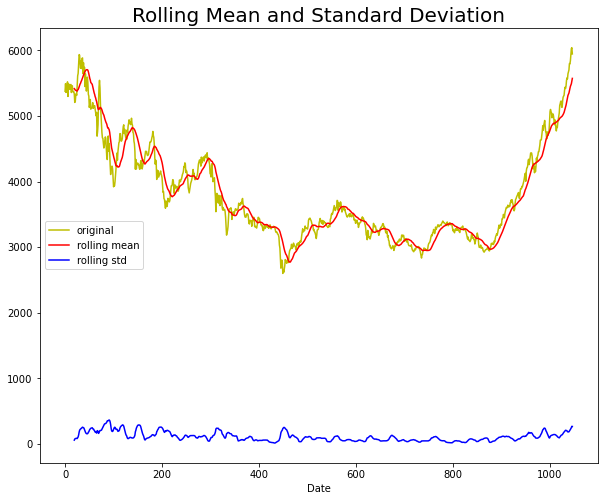

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


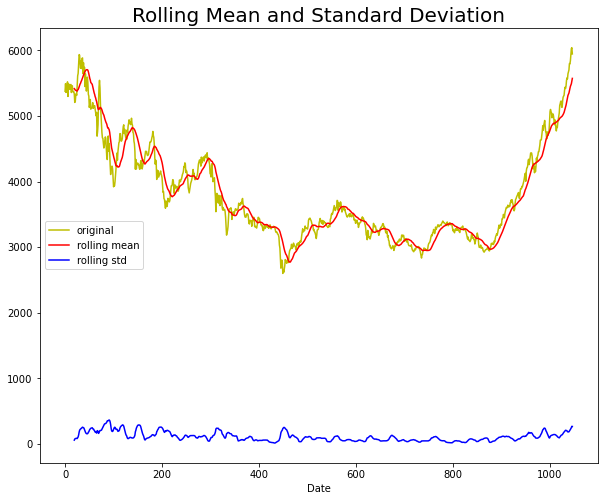

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


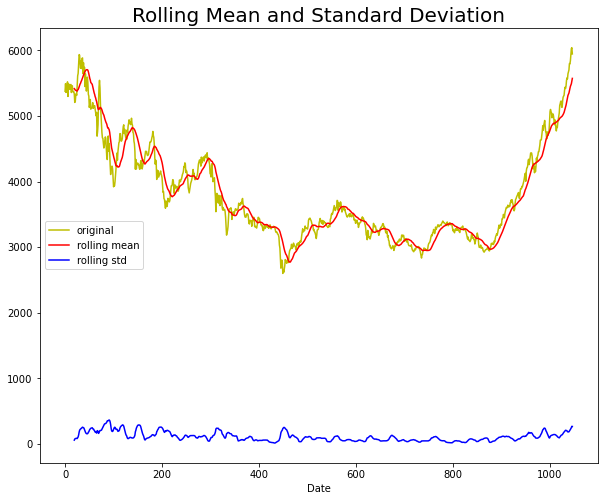

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


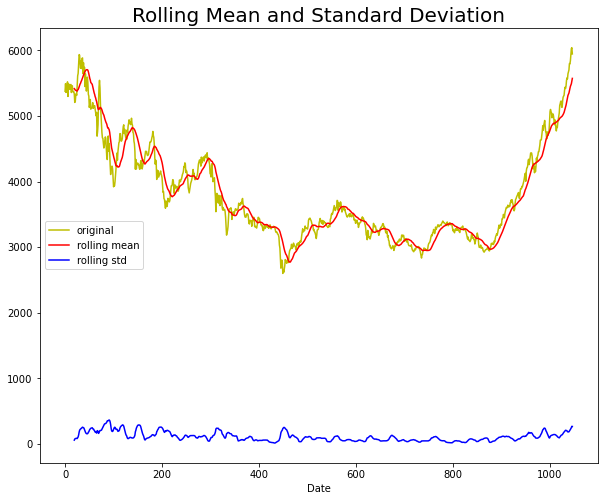

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


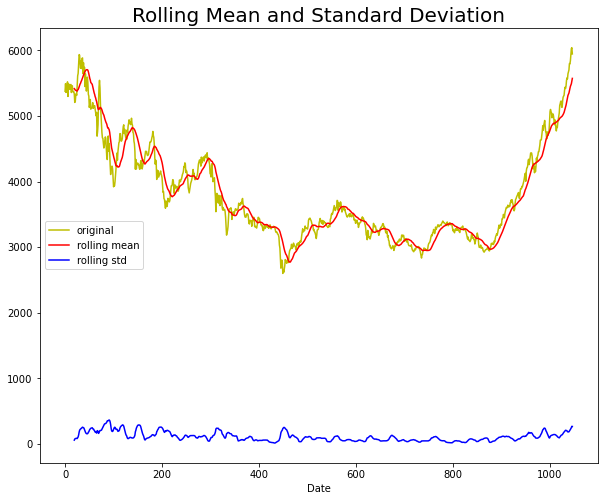

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


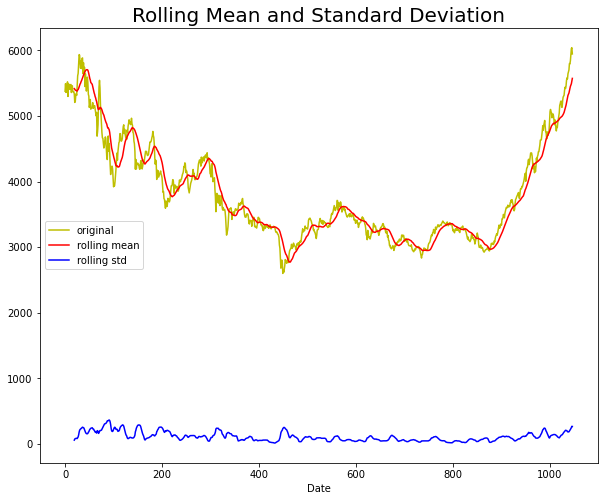

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


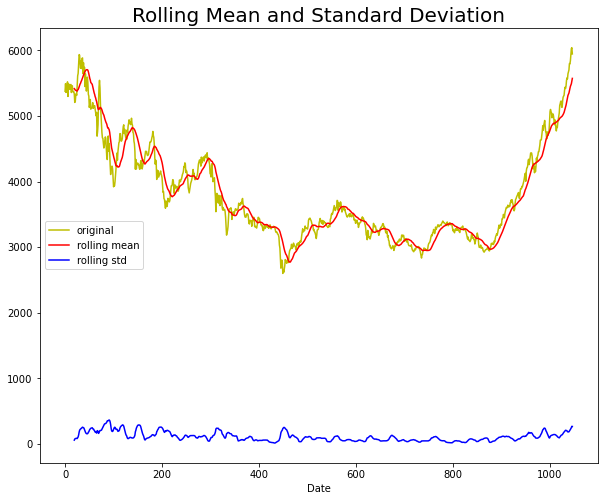

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


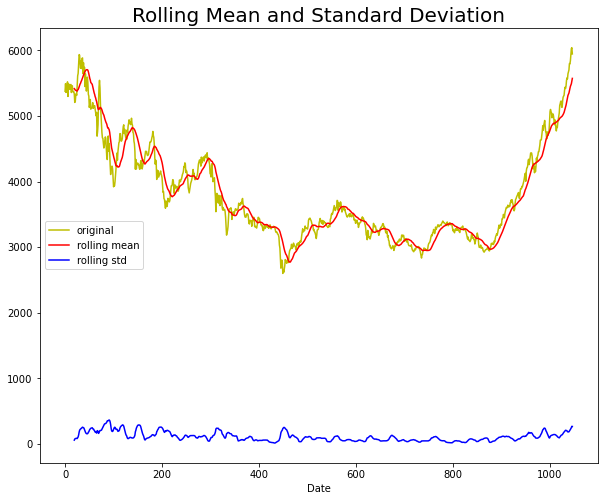

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


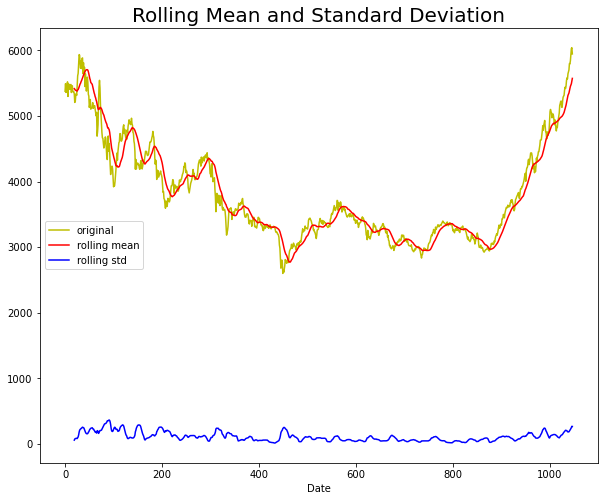

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


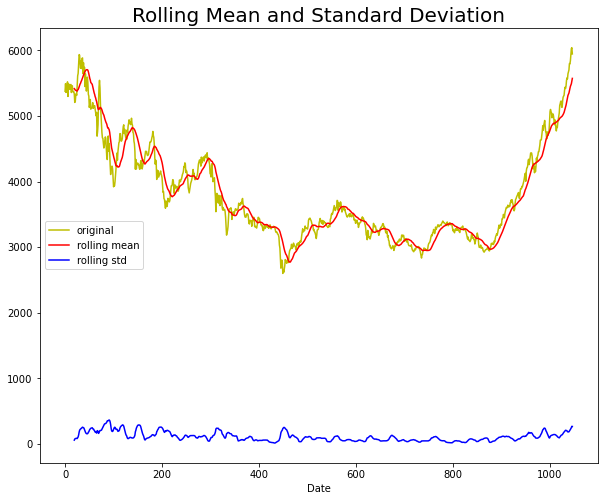

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


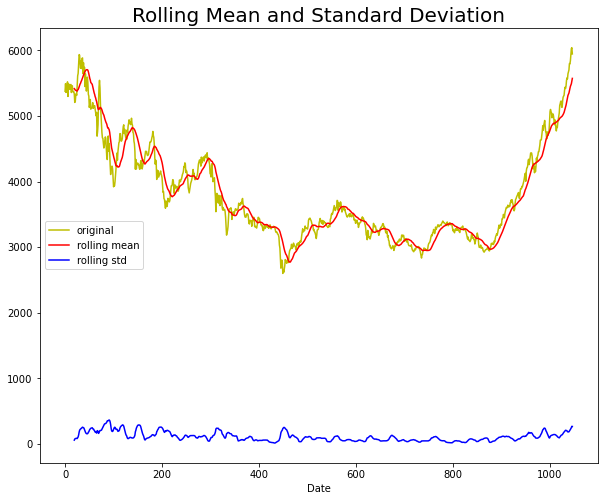

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


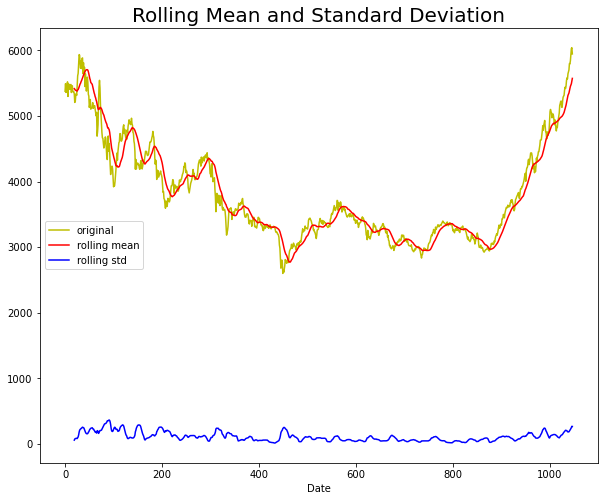

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


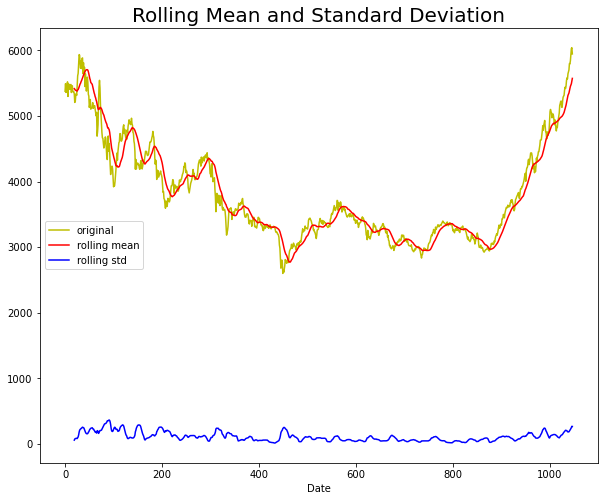

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


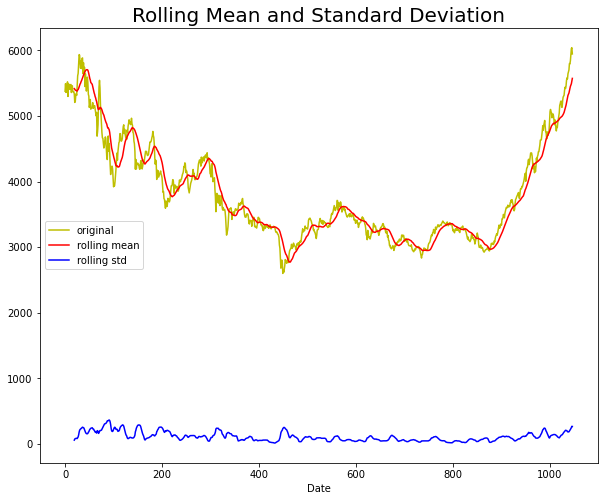

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


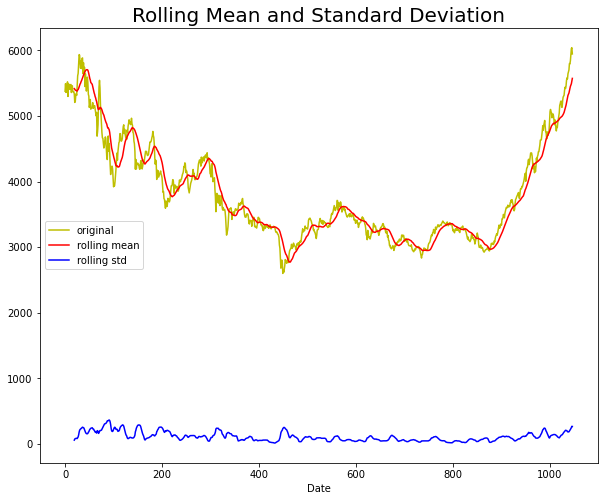

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


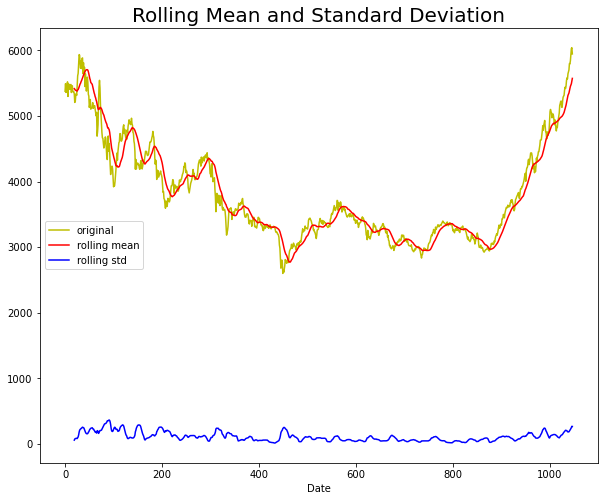

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


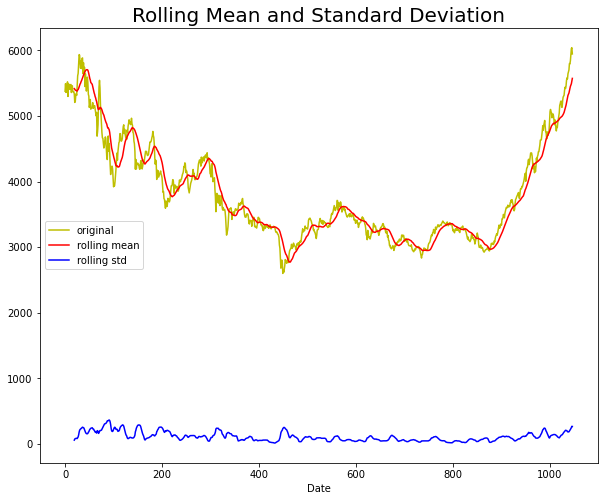

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


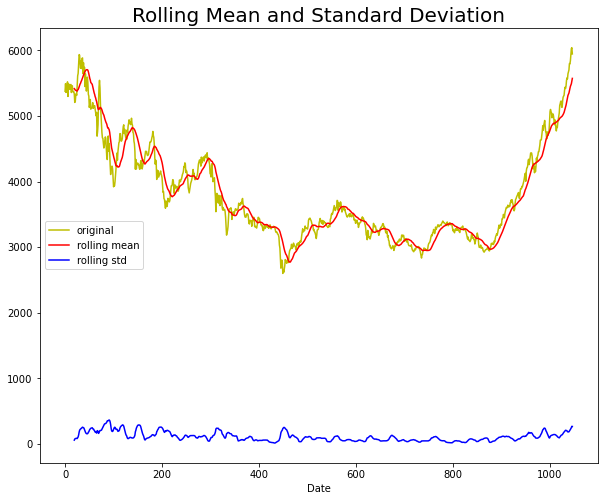

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


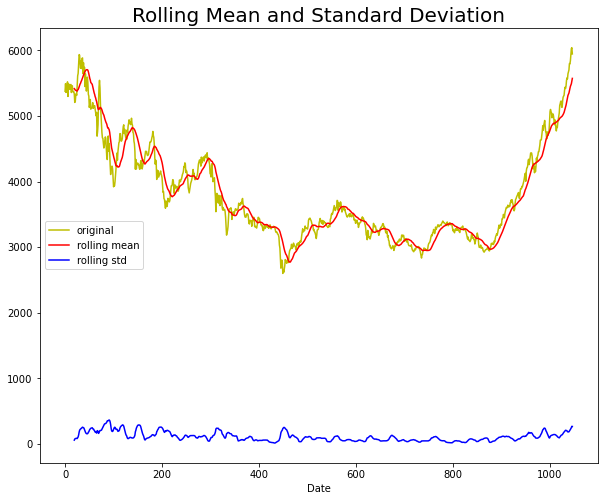

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


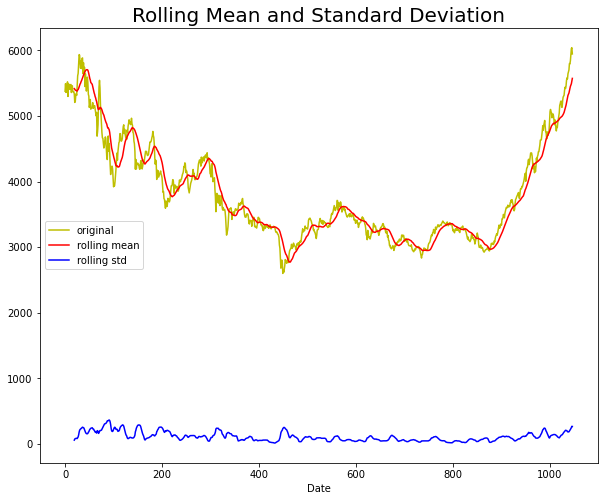

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


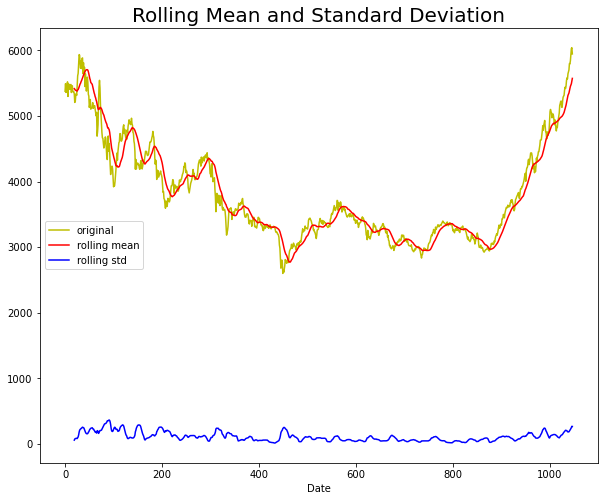

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


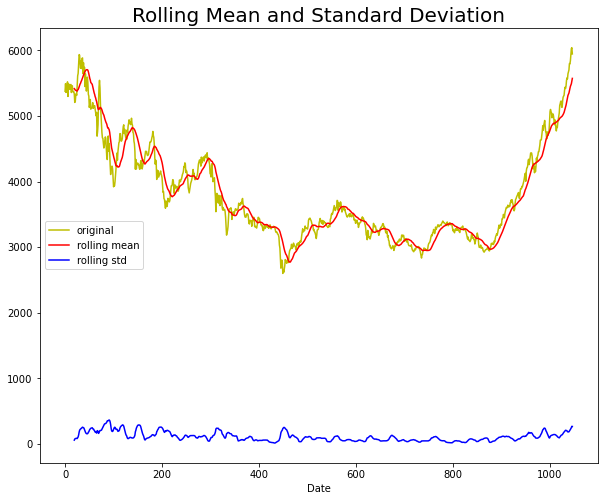

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


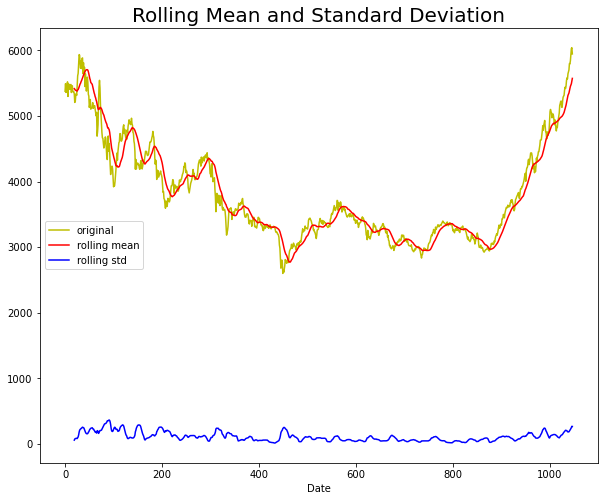

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


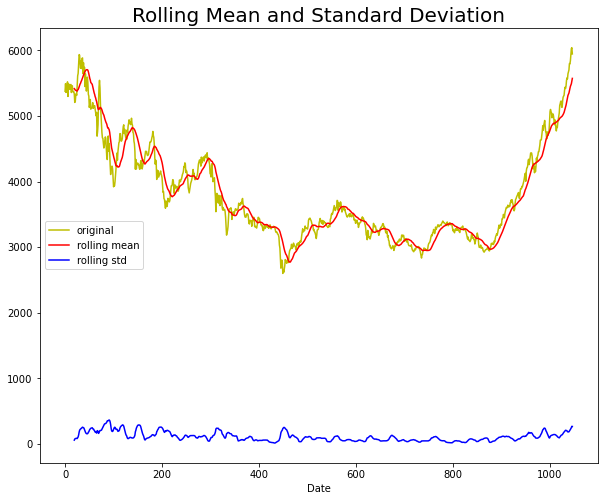

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


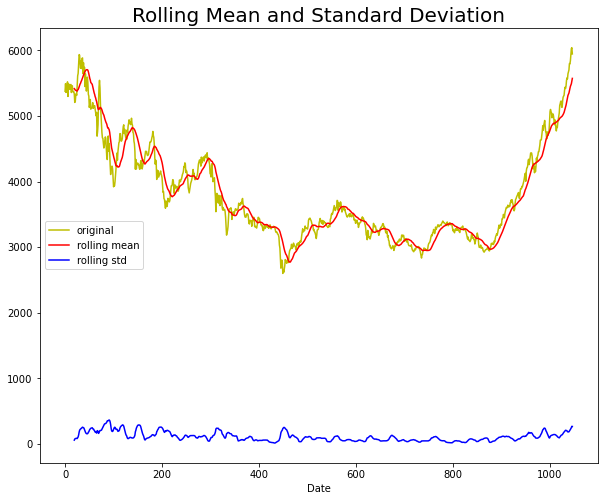

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


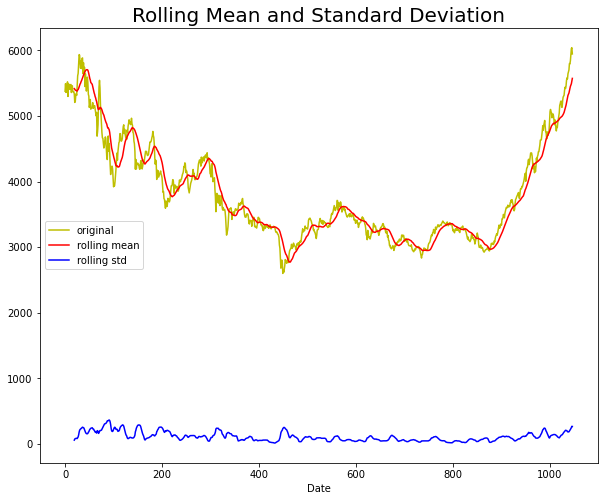

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


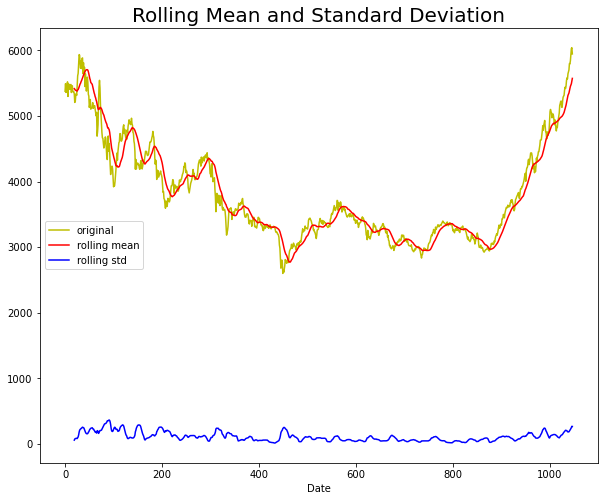

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


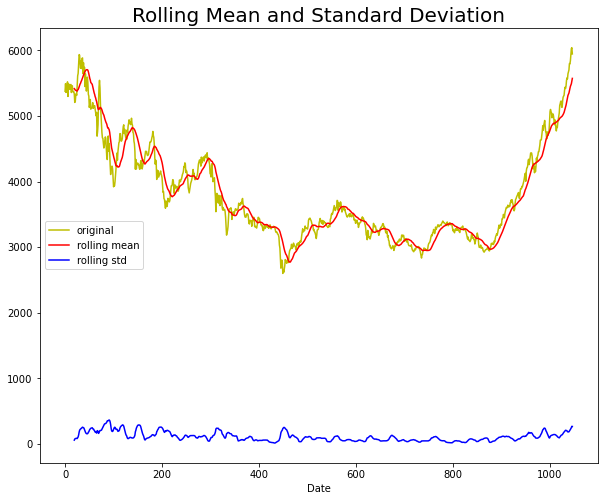

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


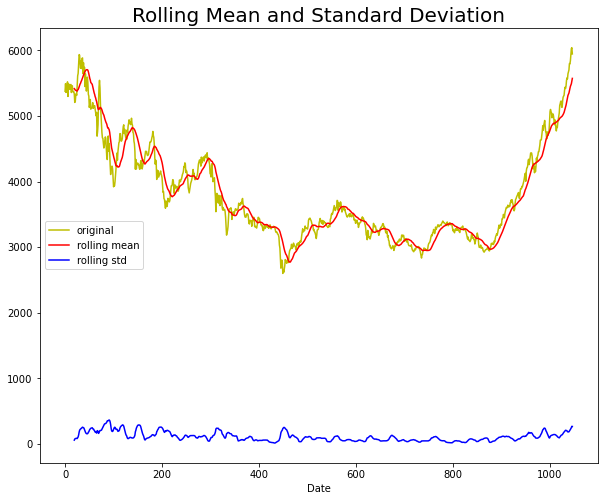

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


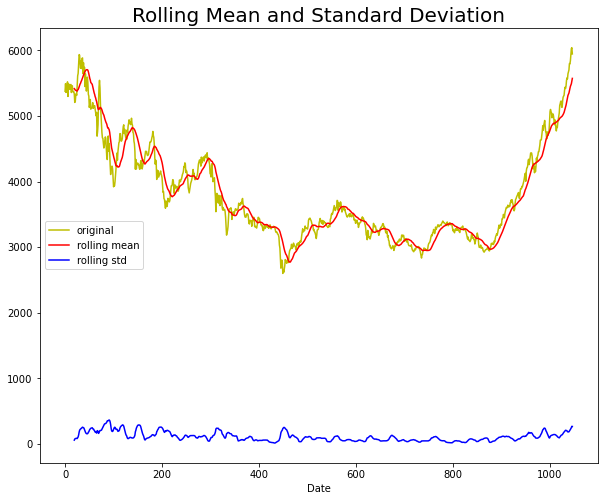

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


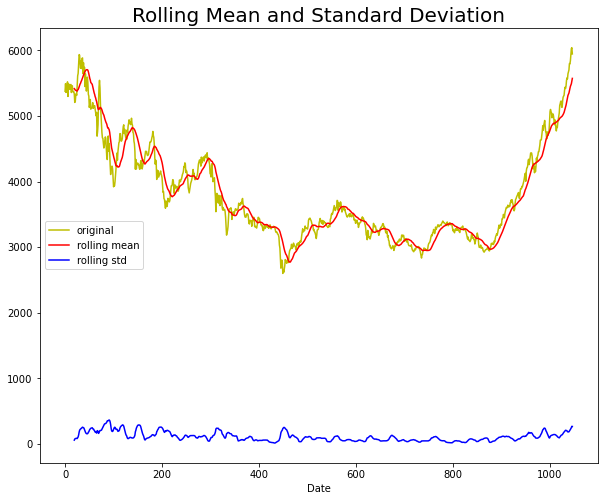

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


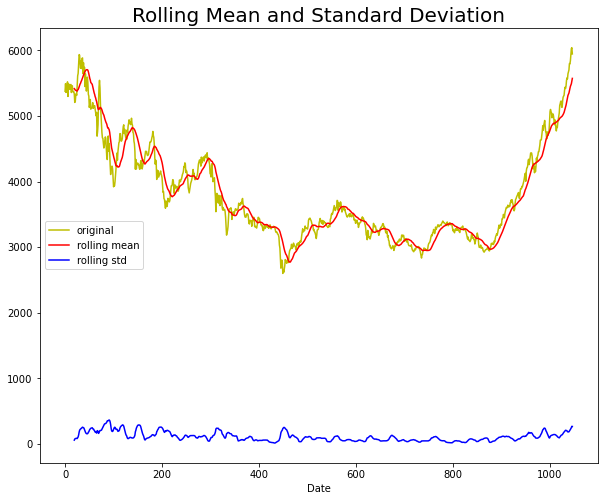

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


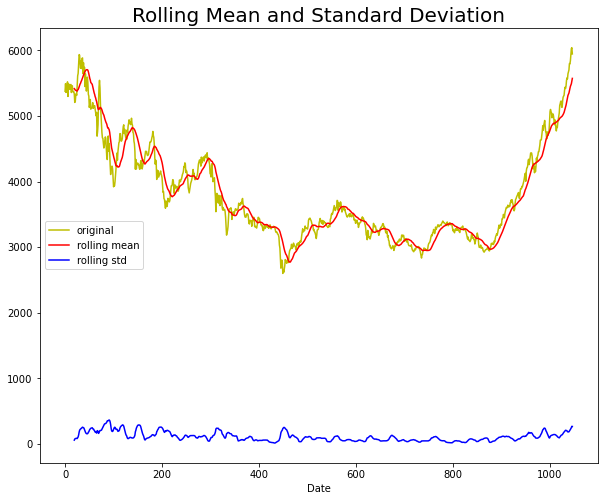

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


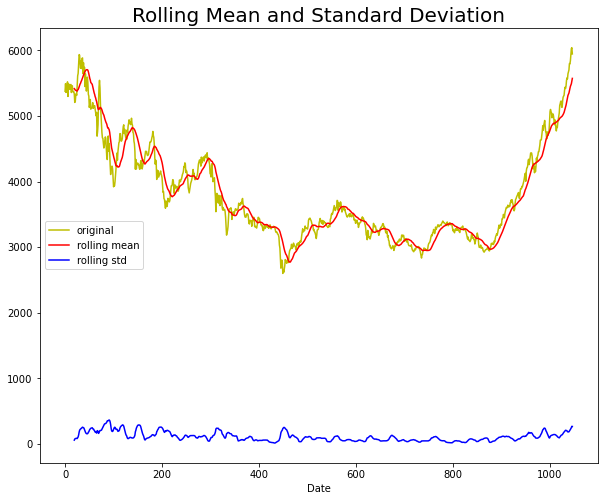

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


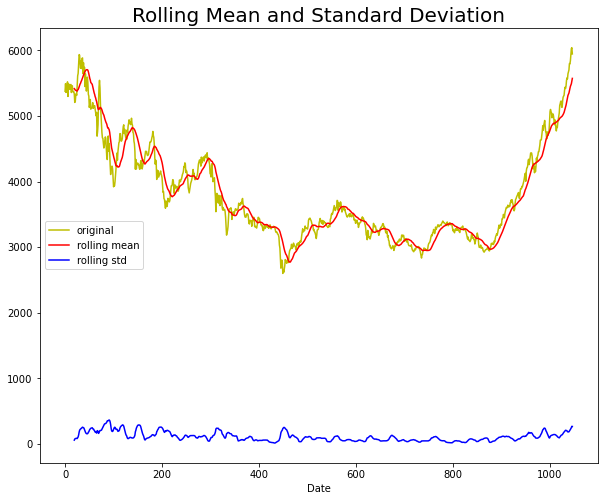

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


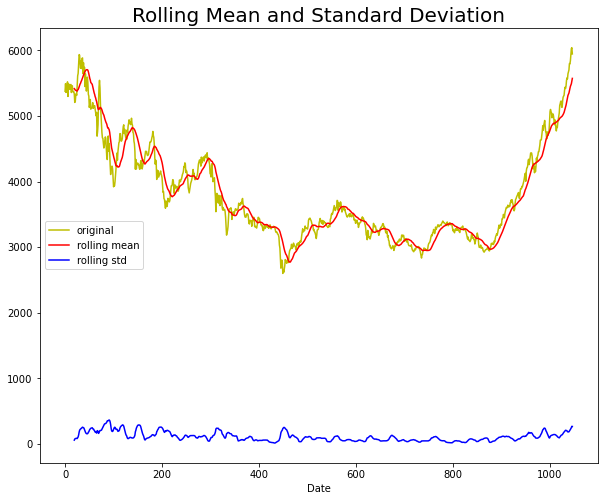

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


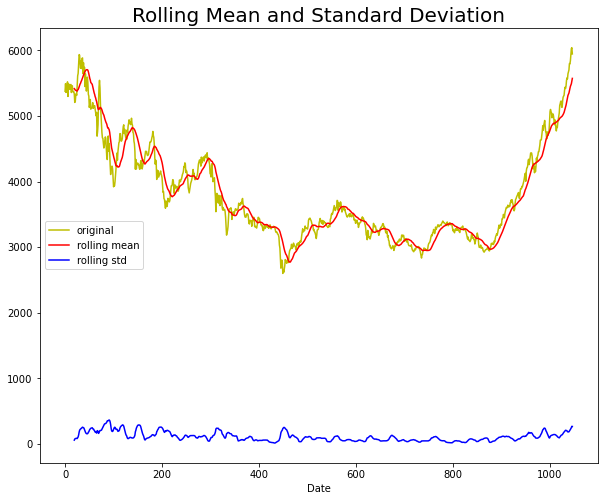

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


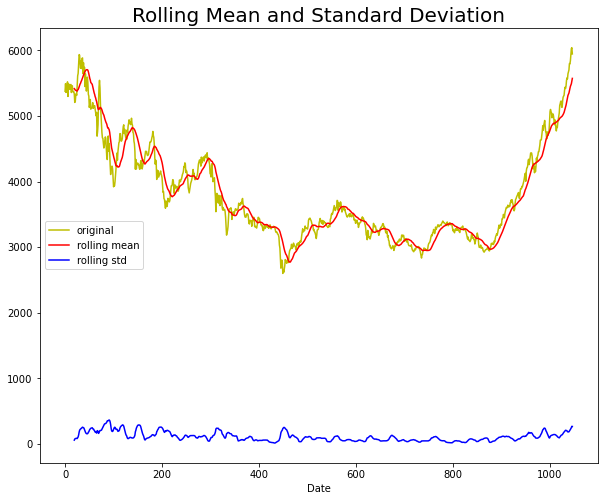

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


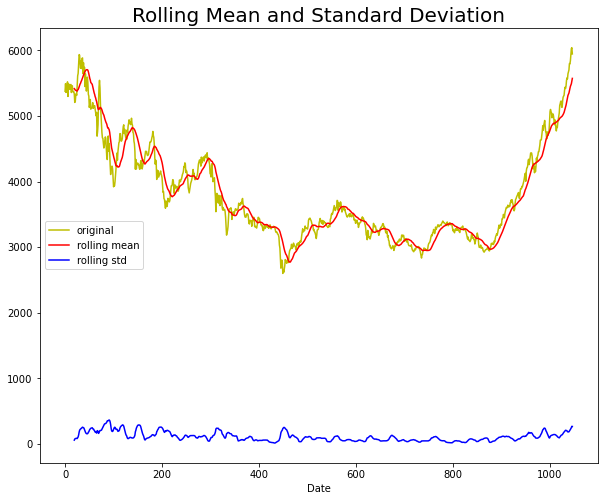

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


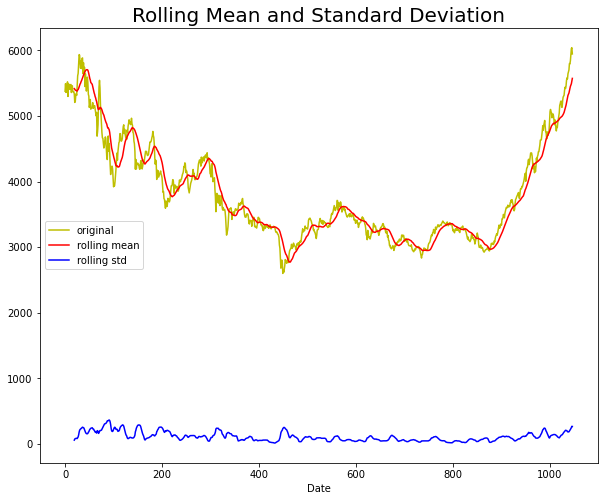

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


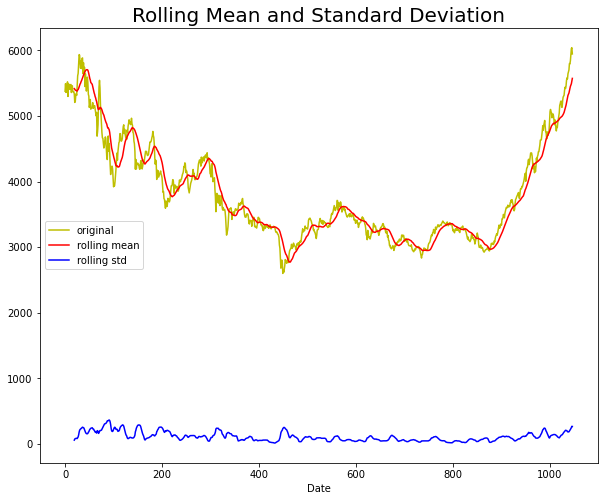

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


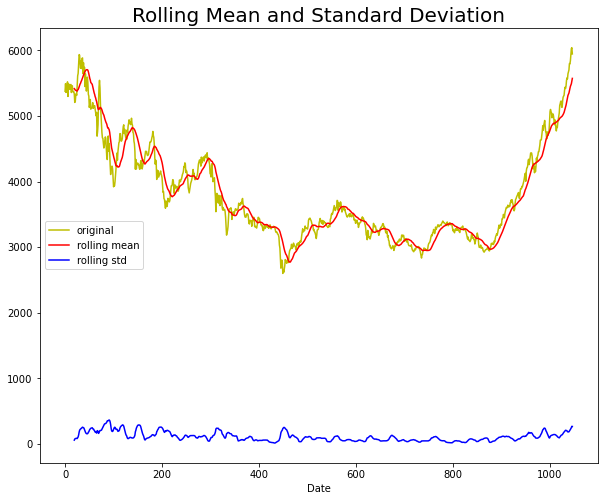

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


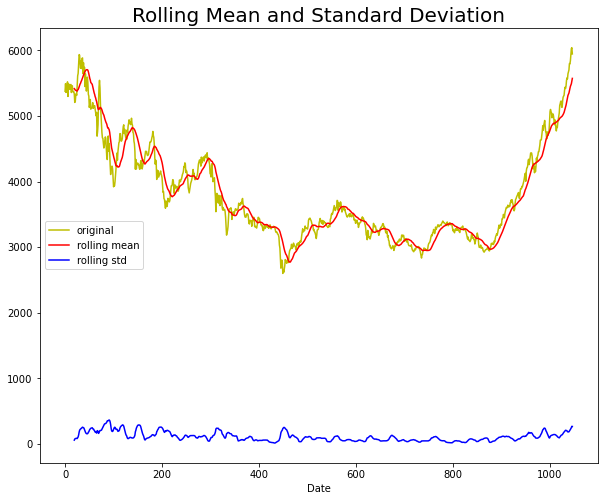

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


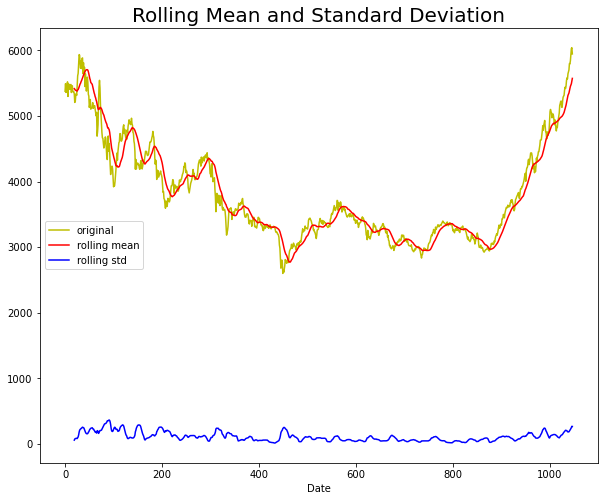

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


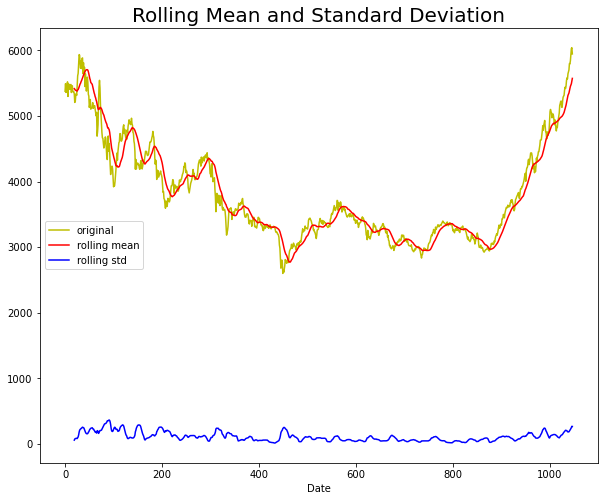

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


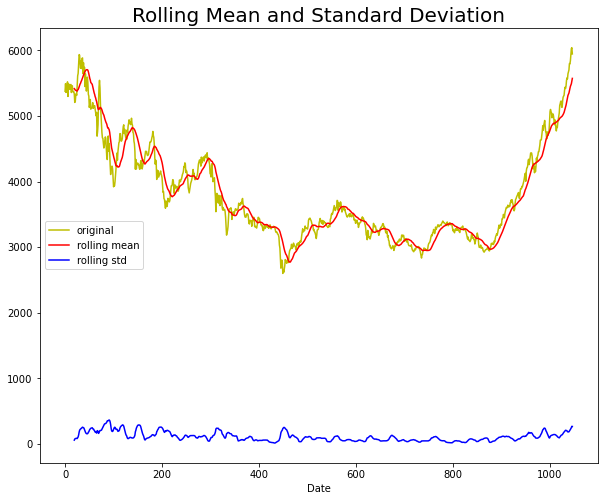

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


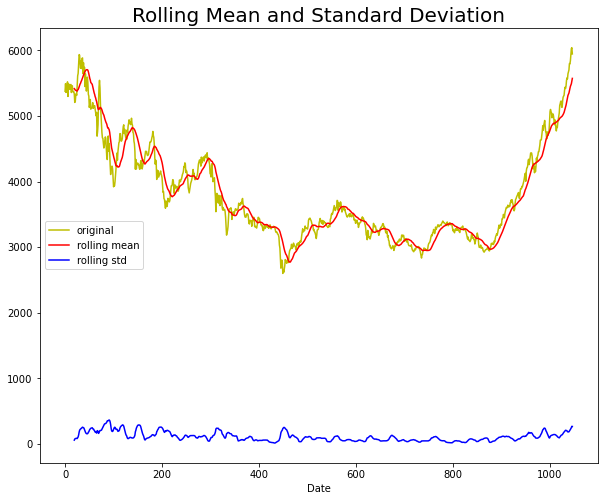

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


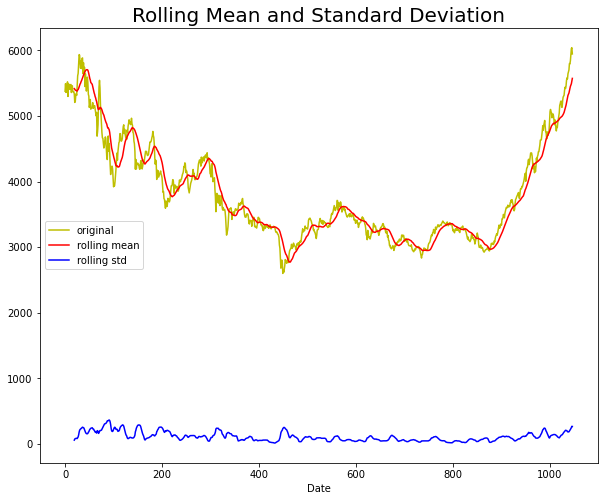

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


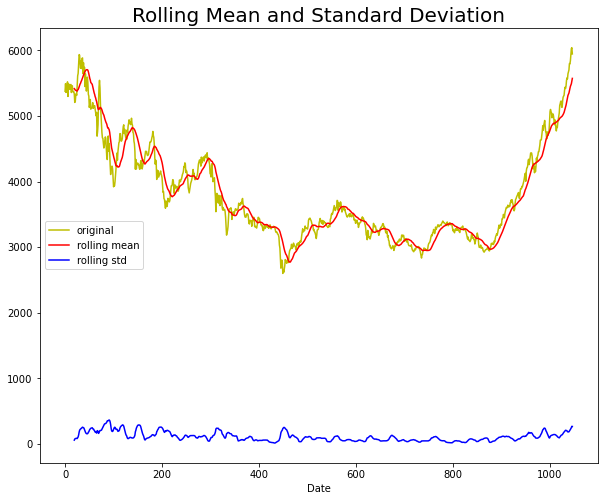

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


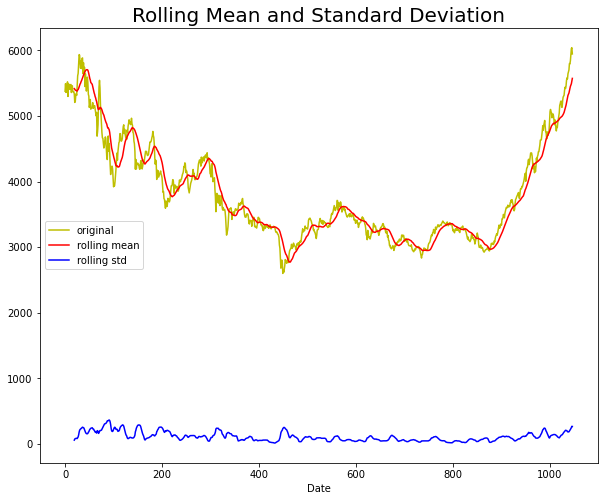

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


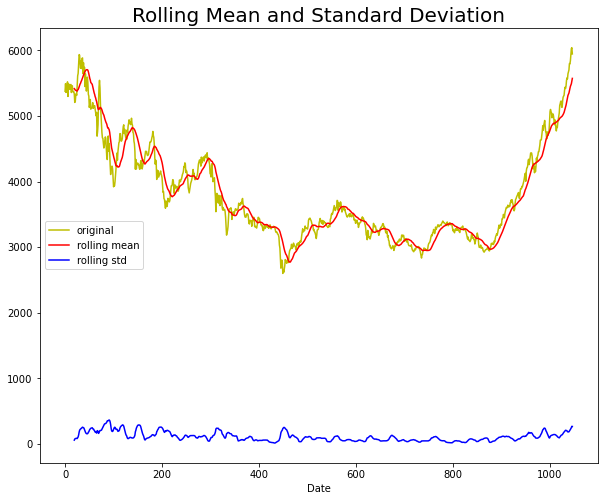

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


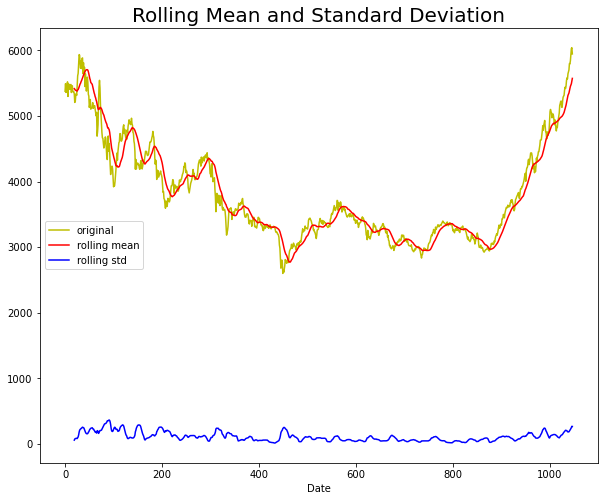

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


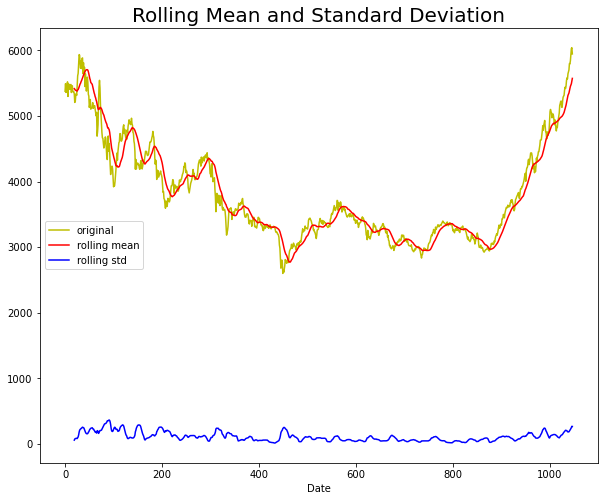

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


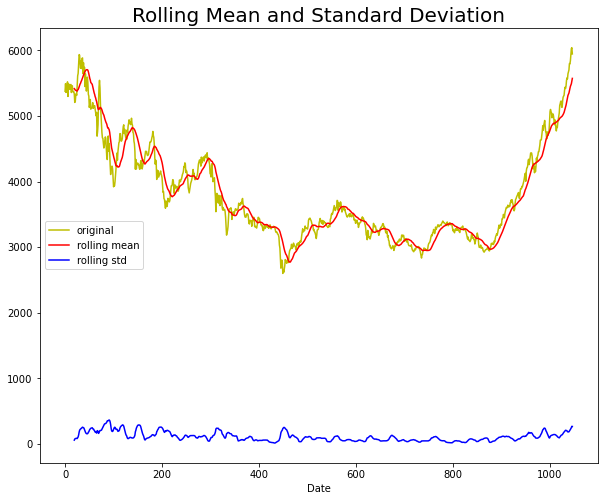

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


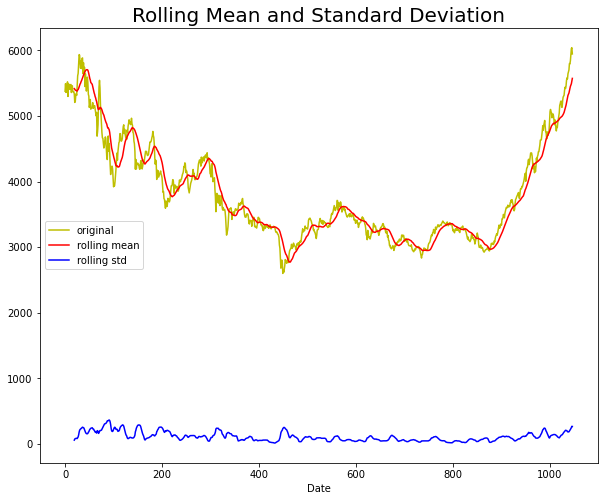

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


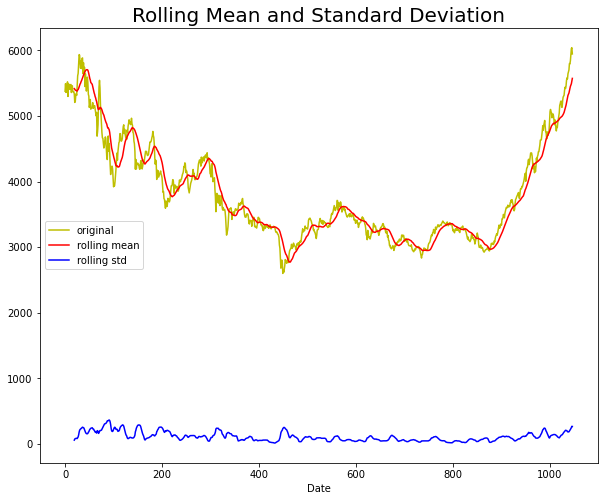

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


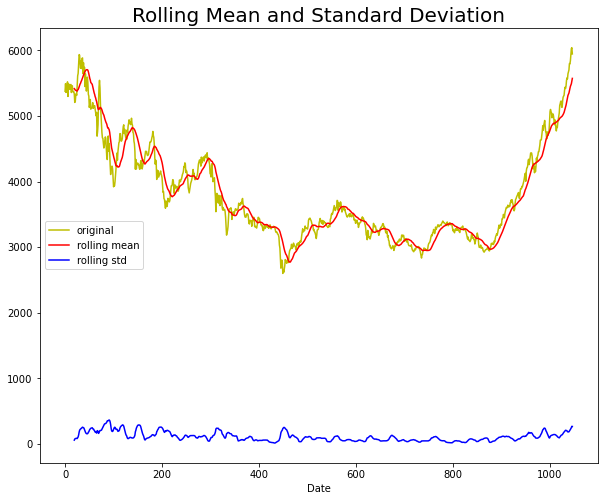

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


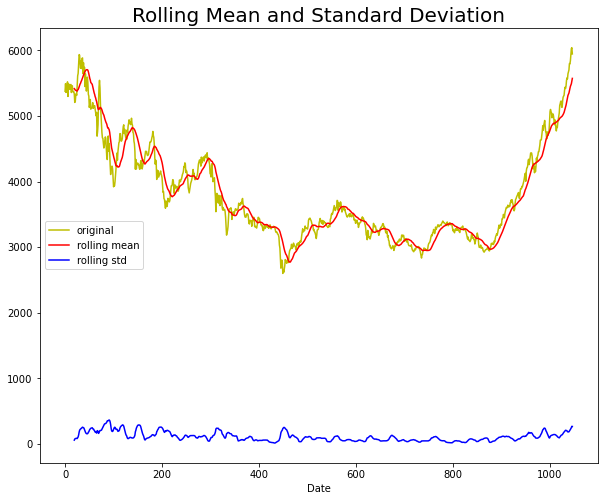

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


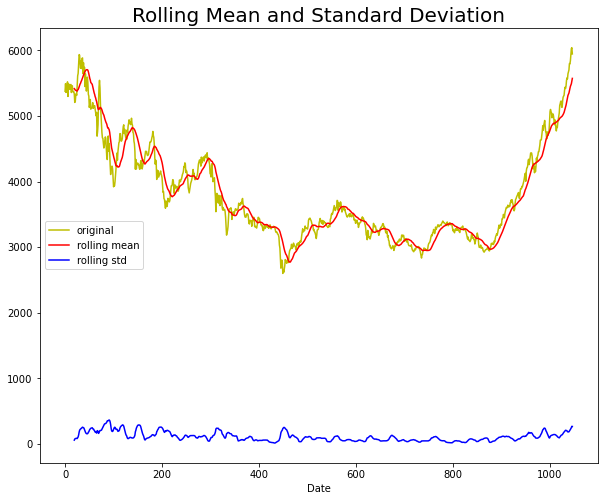

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


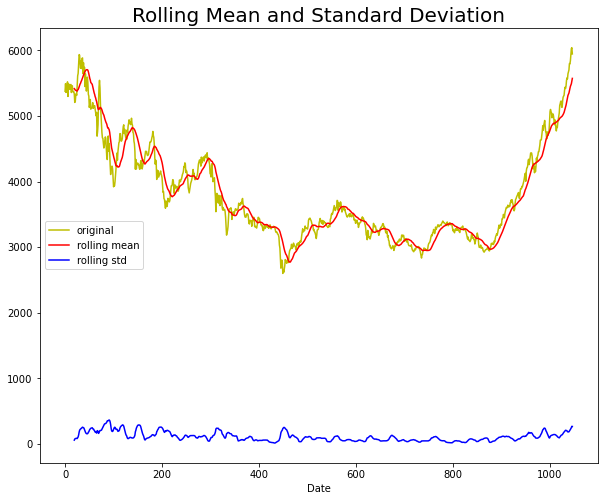

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


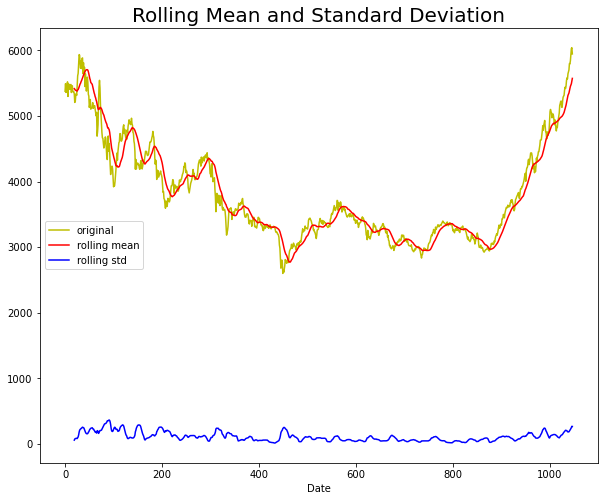

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


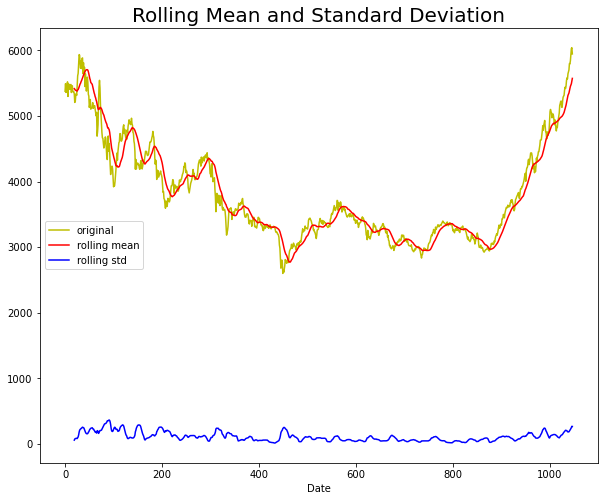

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


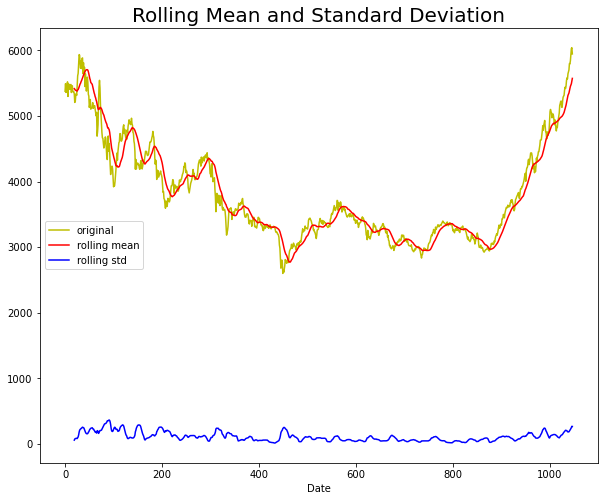

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


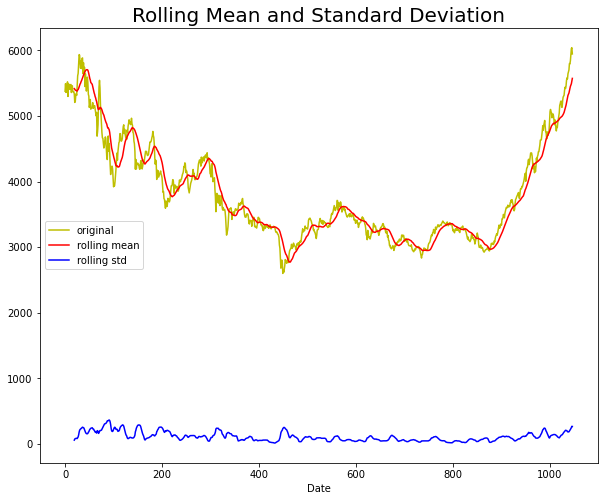

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


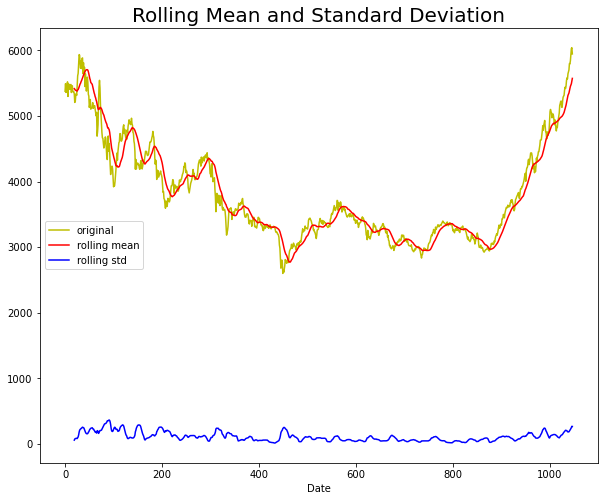

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


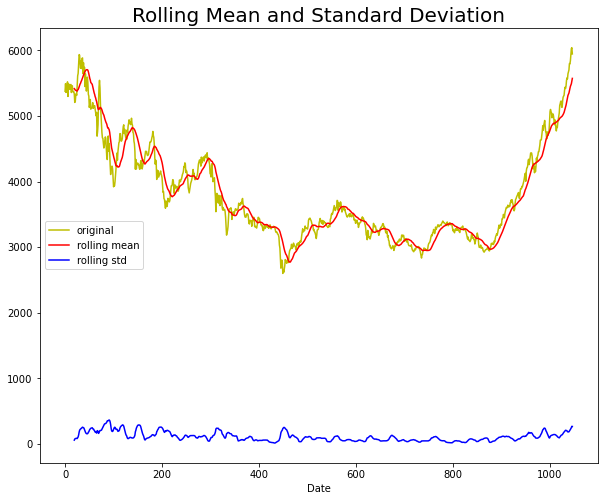

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


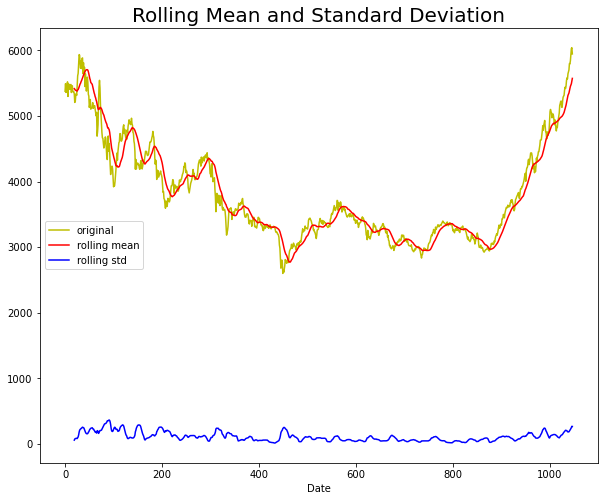

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


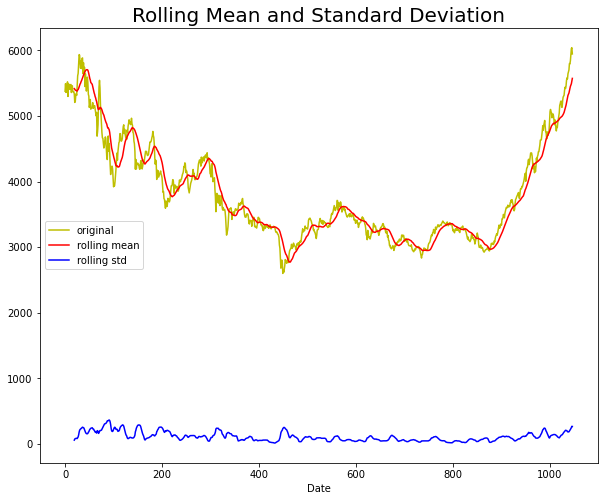

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


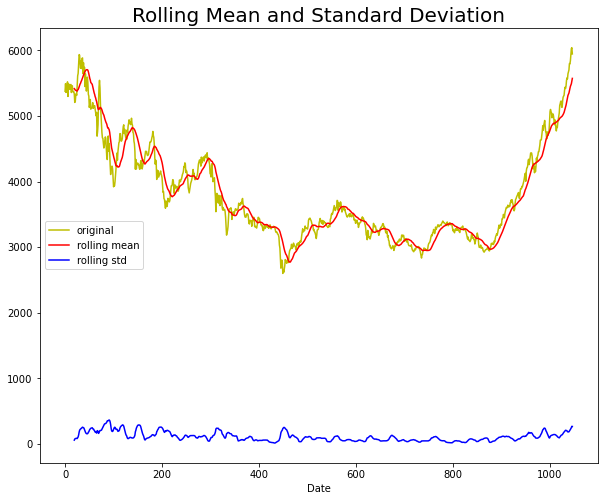

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


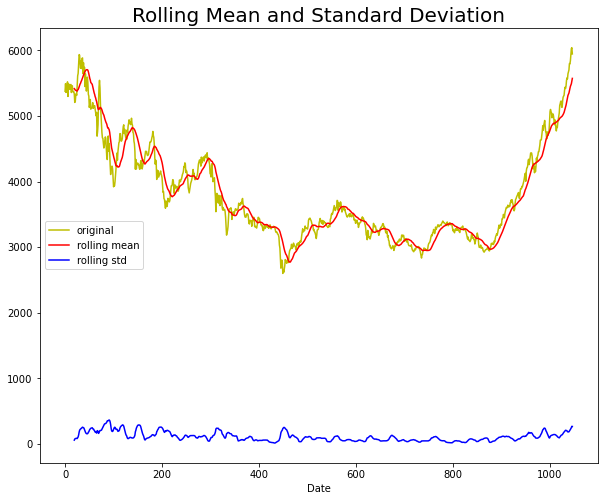

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


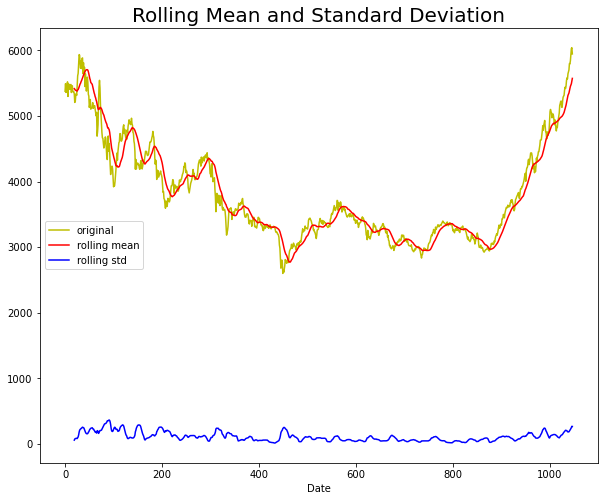

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


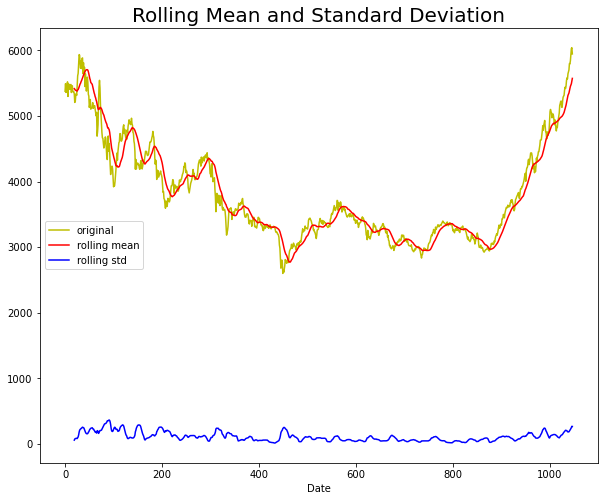

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


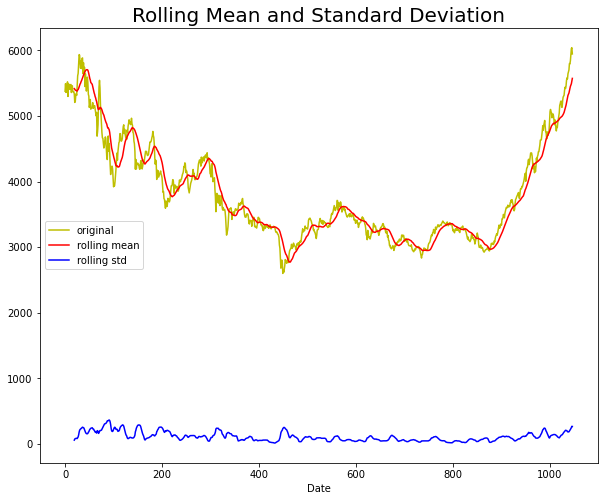

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


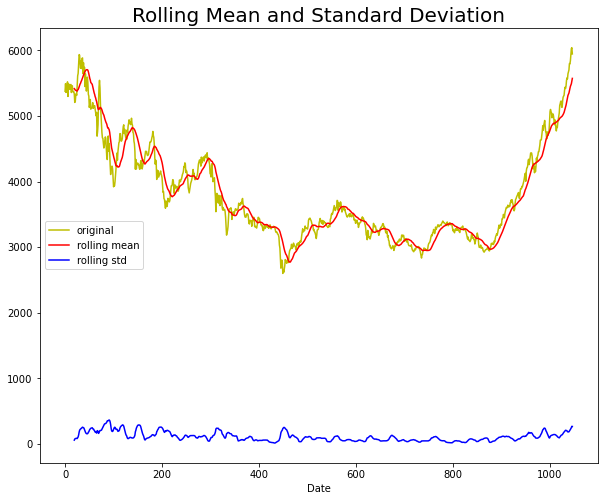

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


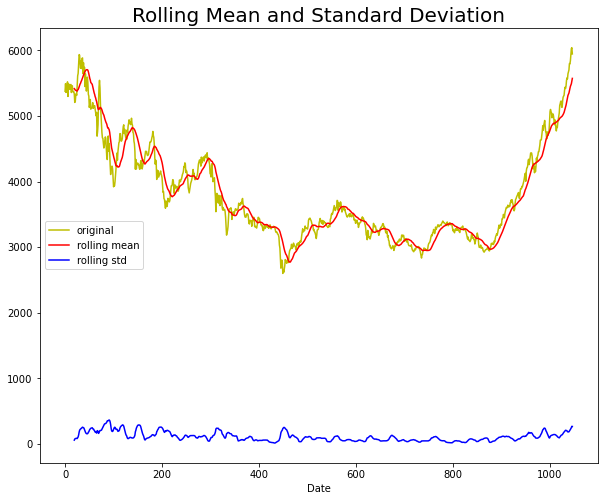

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


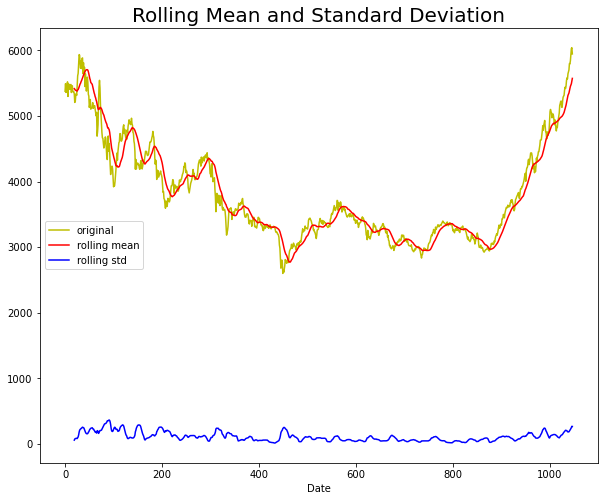

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


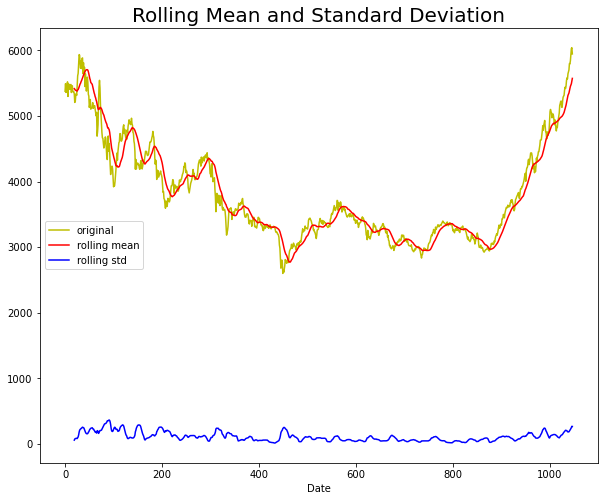

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


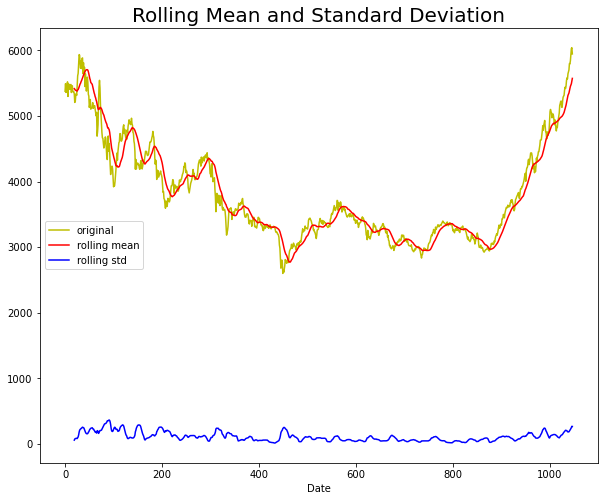

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


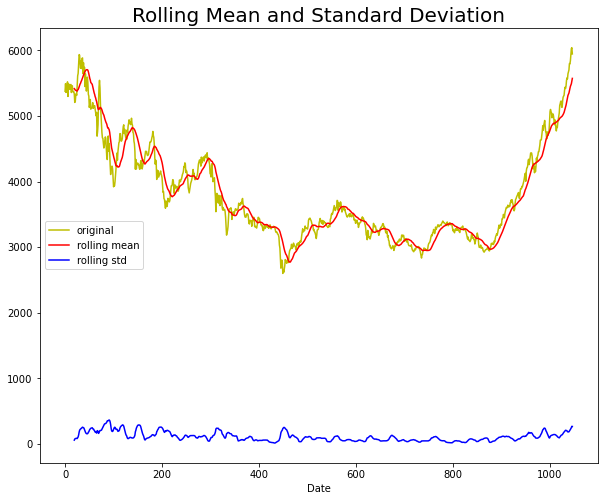

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


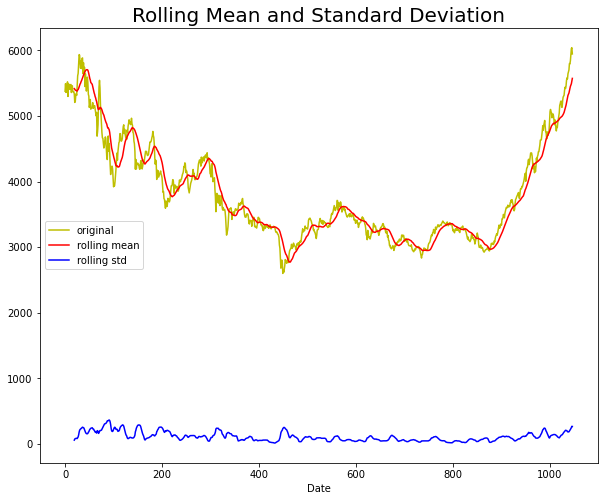

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


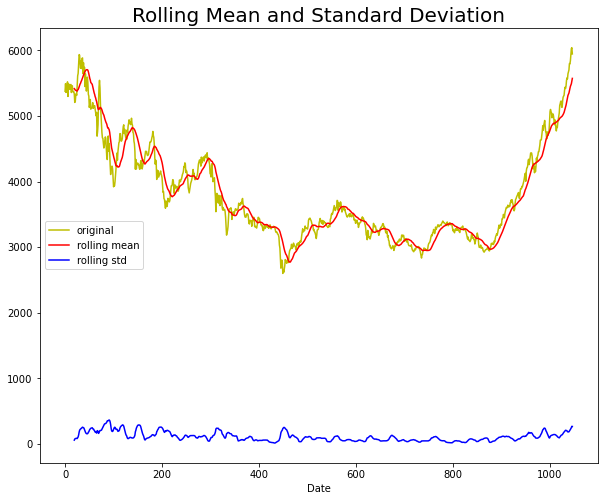

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


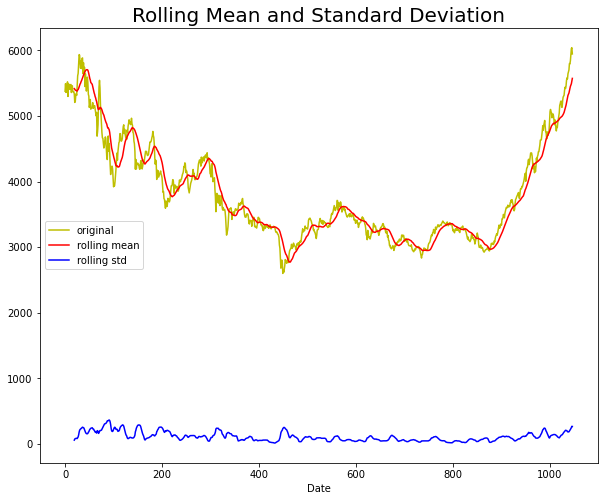

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


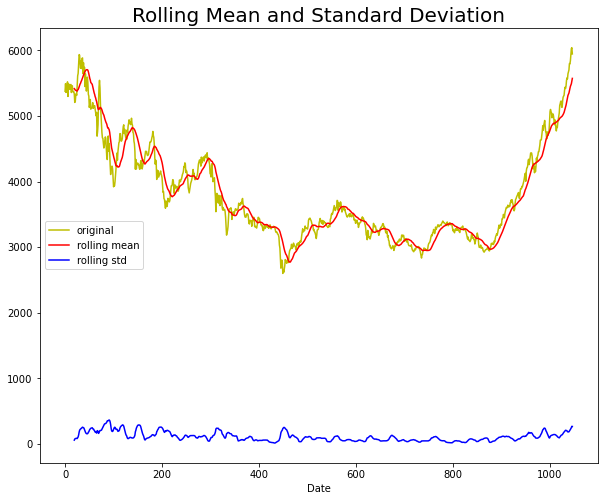

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


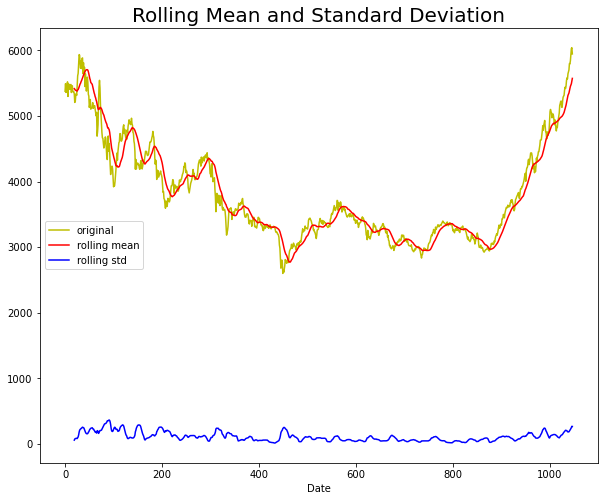

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


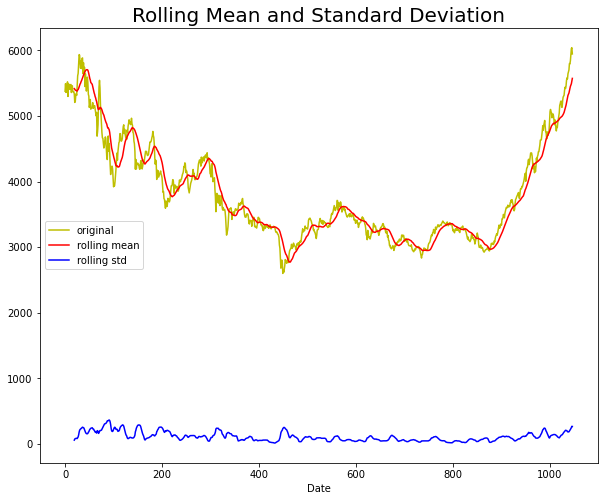

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


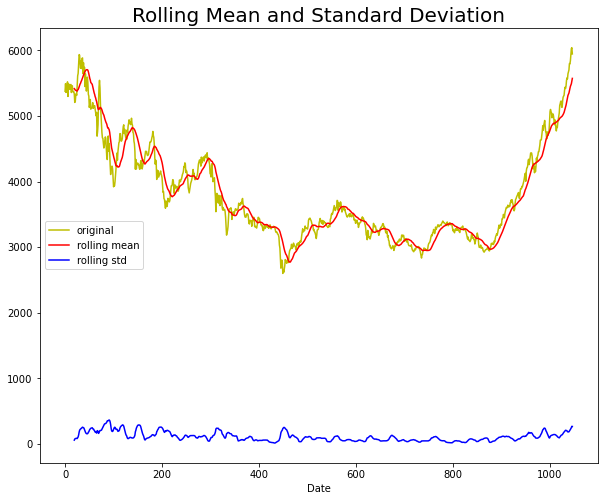

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


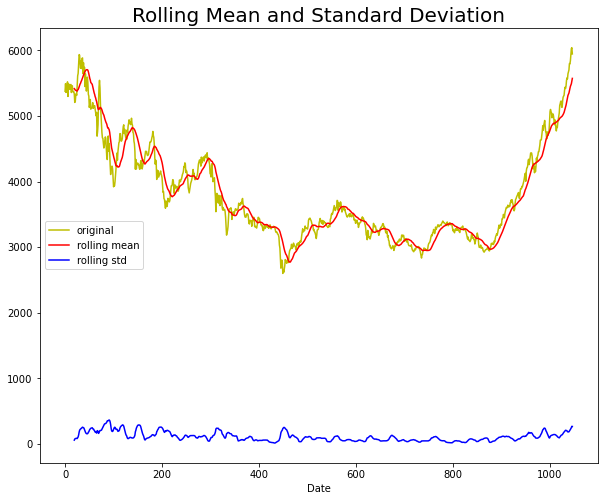

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


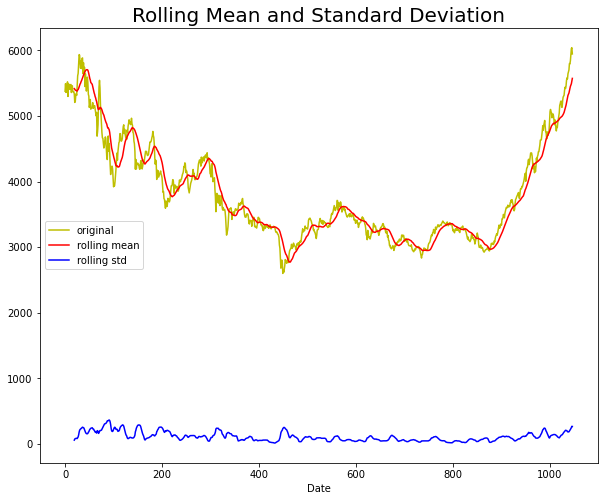

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


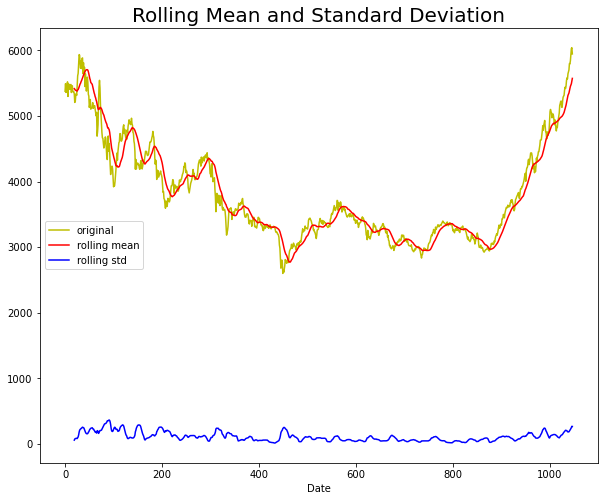

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


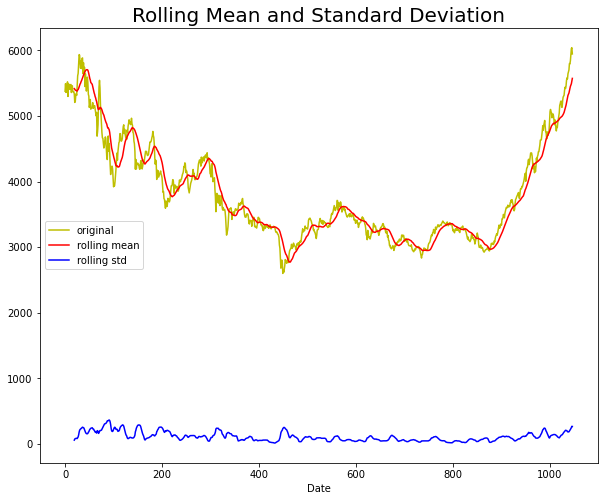

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


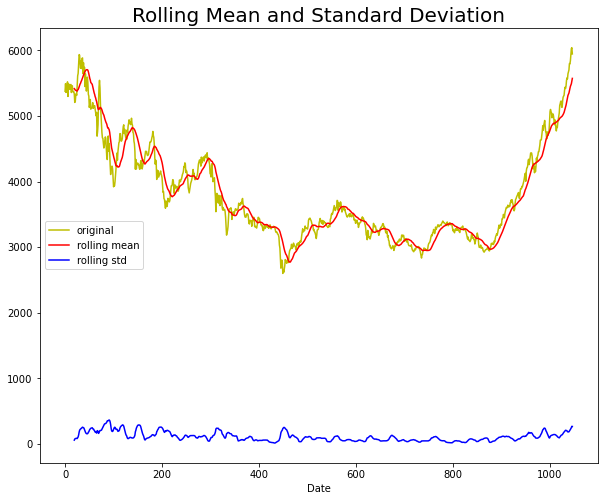

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


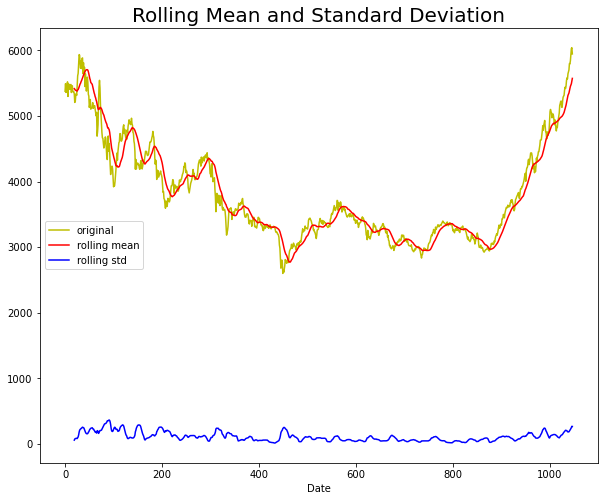

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


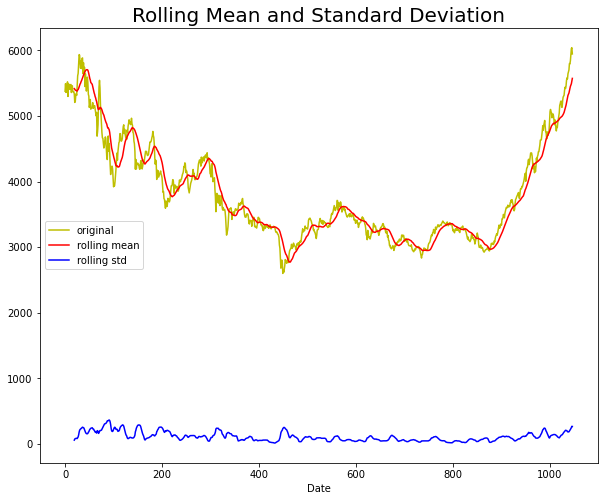

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


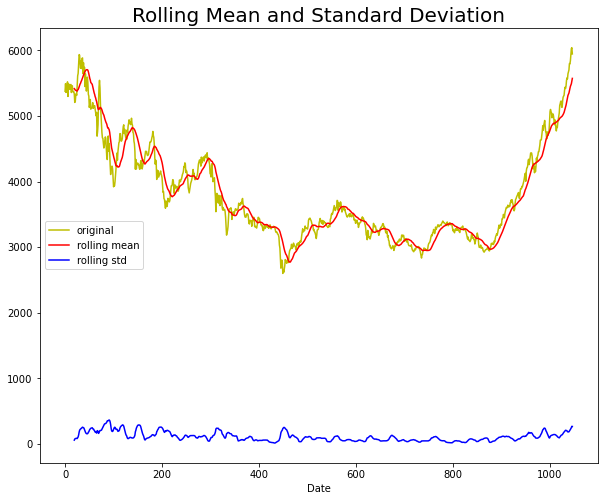

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


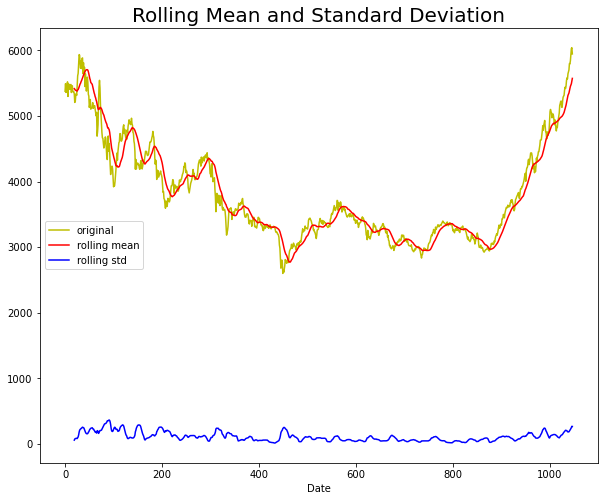

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


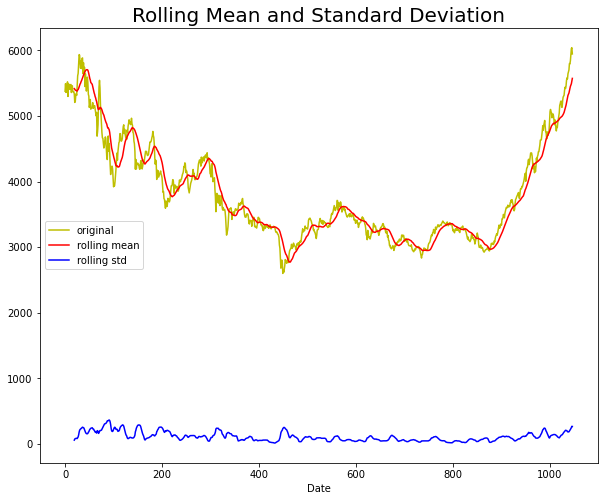

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


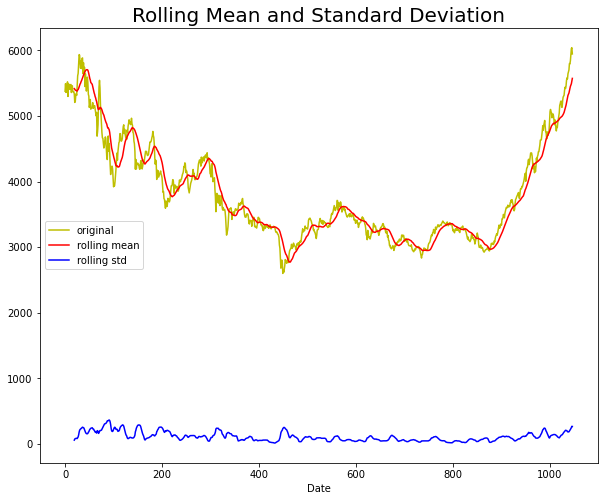

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


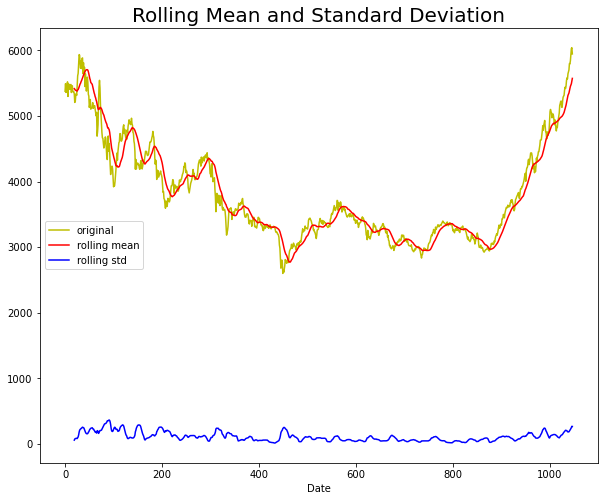

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


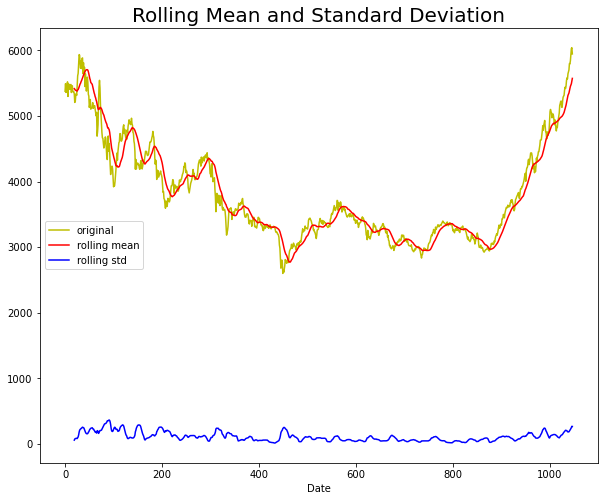

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


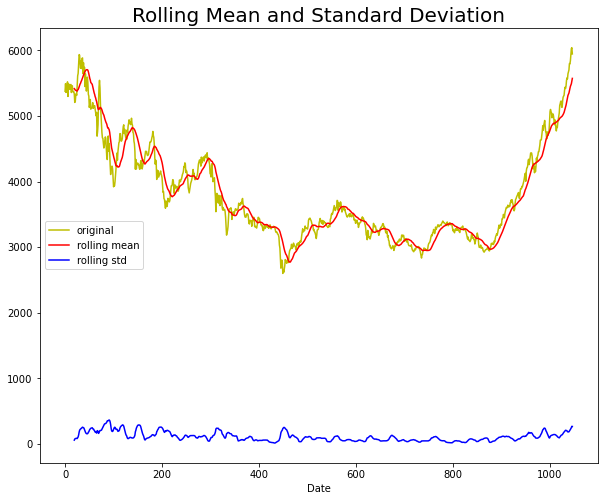

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


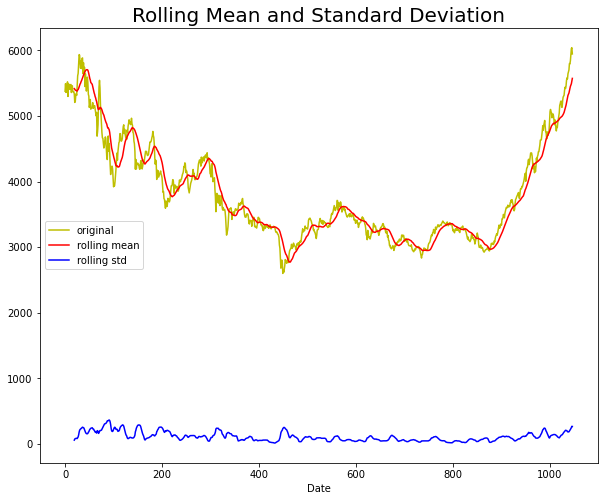

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


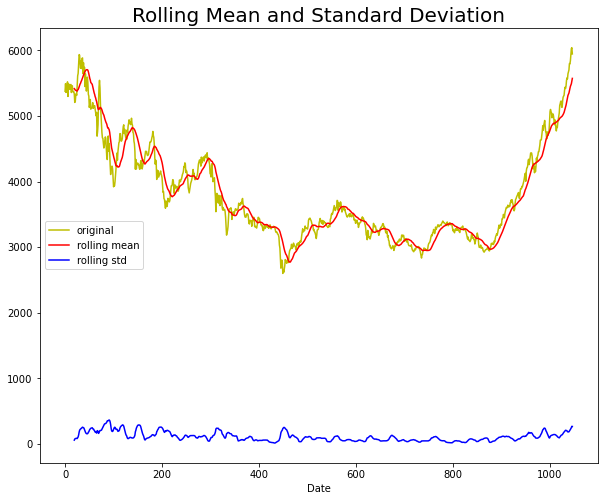

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


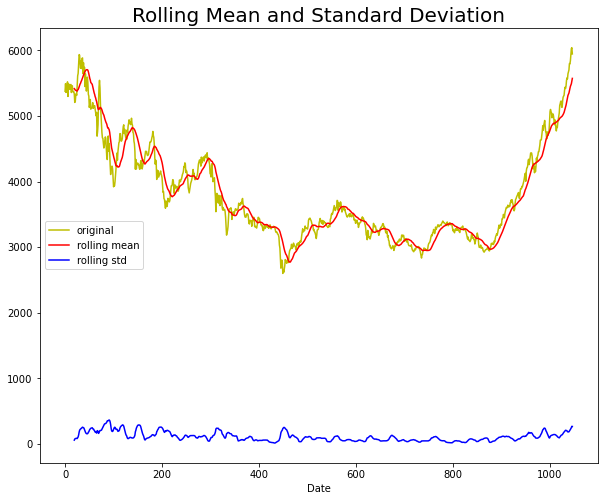

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


KeyboardInterrupt: 

<Figure size 720x576 with 0 Axes>

In [15]:
train_log.dropna(inplace = True)
test_log.dropna(inplace = True)

test_stationarity(train_log)

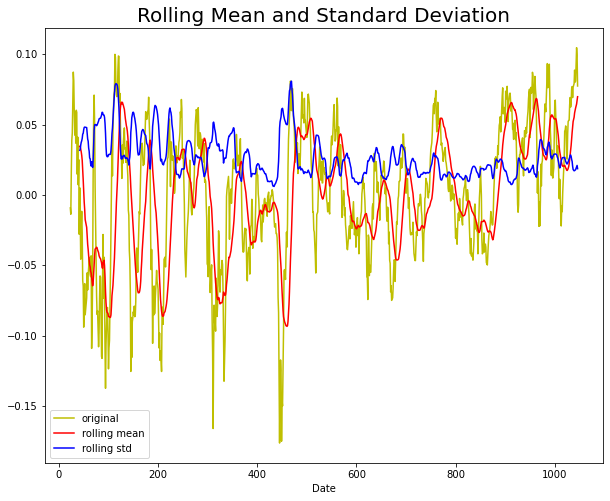

Results of dickey fuller test
ADF Test Statistic : -5.499958719158128
p-value : 2.0820347816989356e-06
#Lags Used : 1
Number of Observations Used : 975
Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary


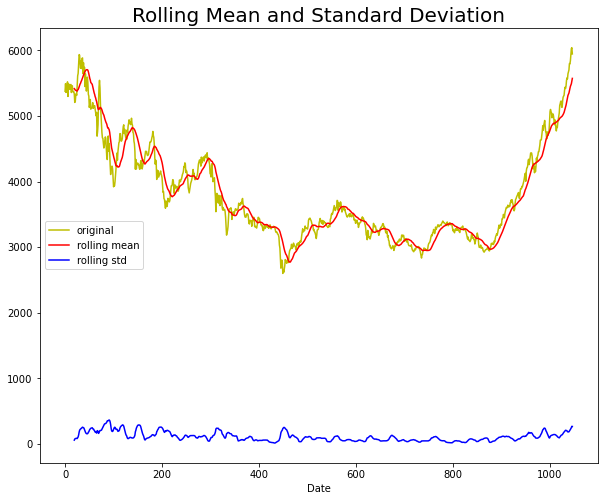

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


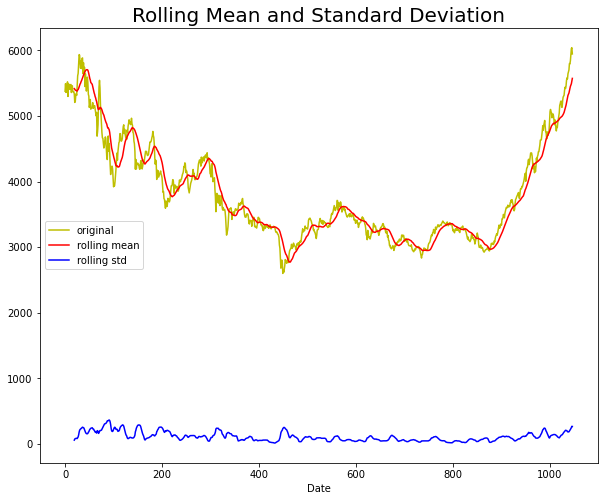

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


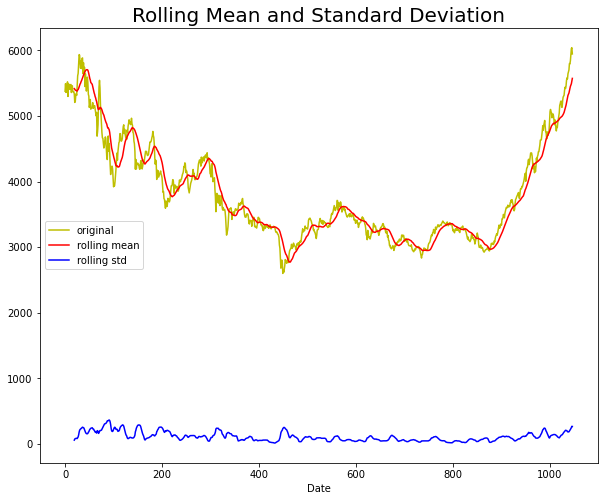

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


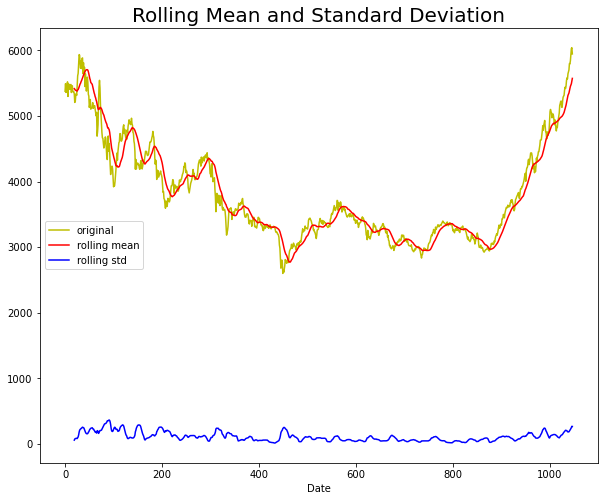

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


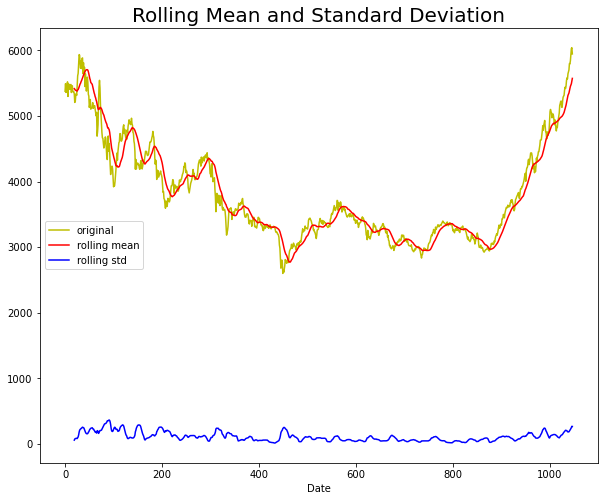

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


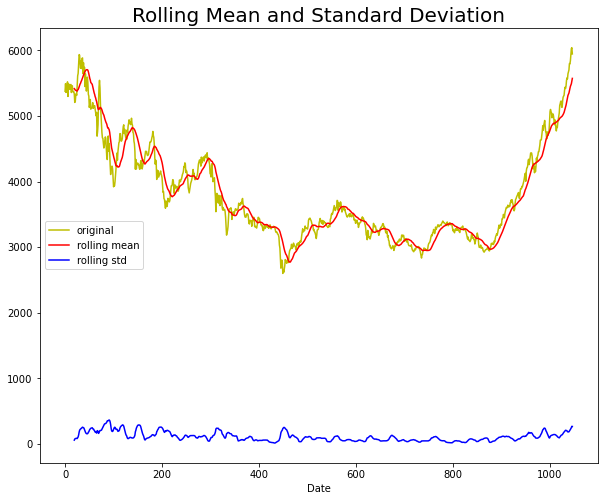

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


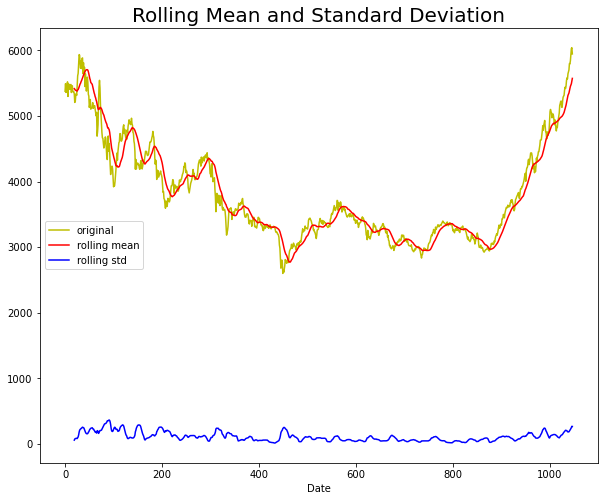

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


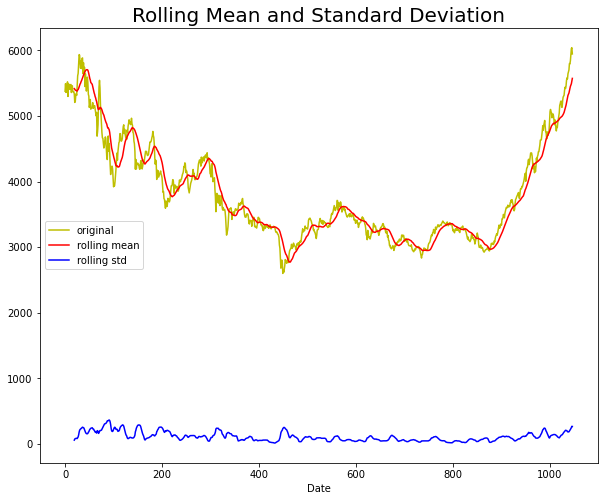

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


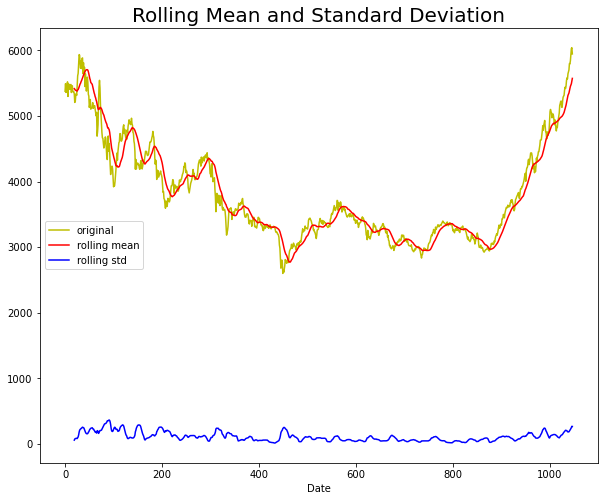

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


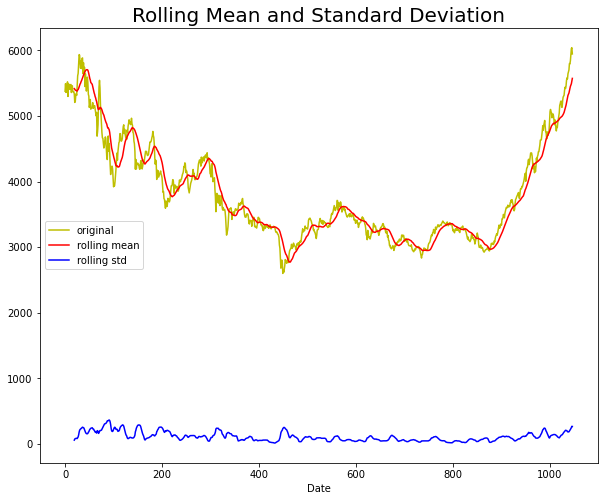

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


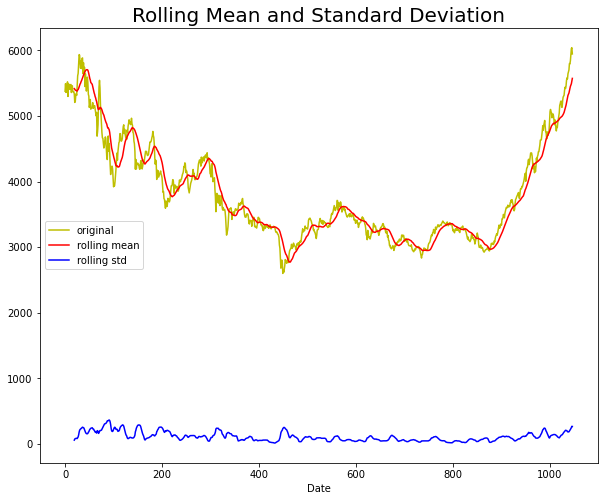

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


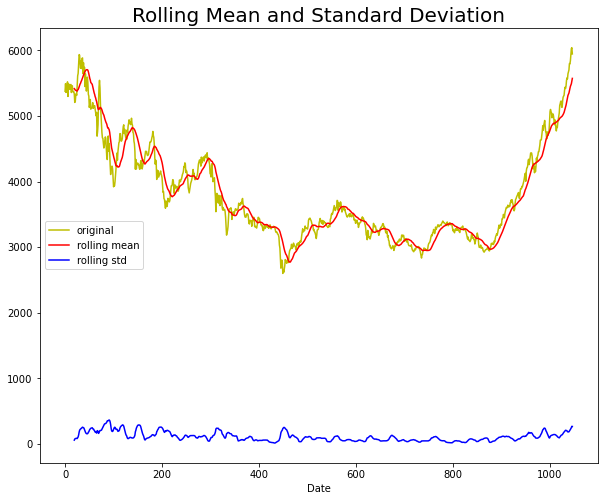

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


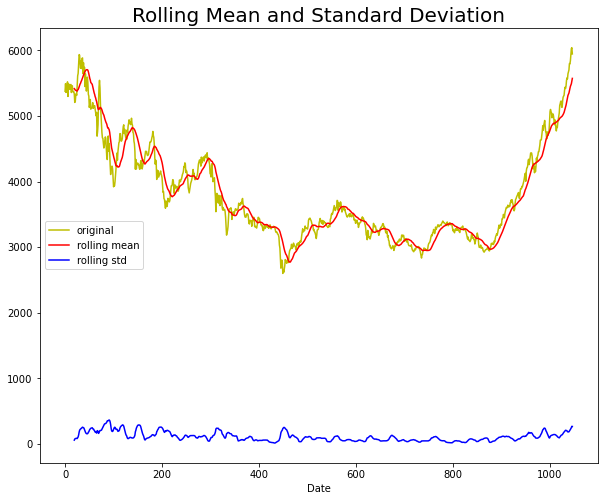

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


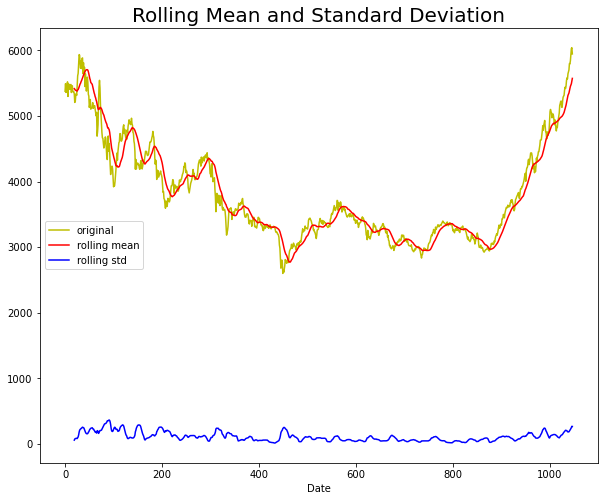

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


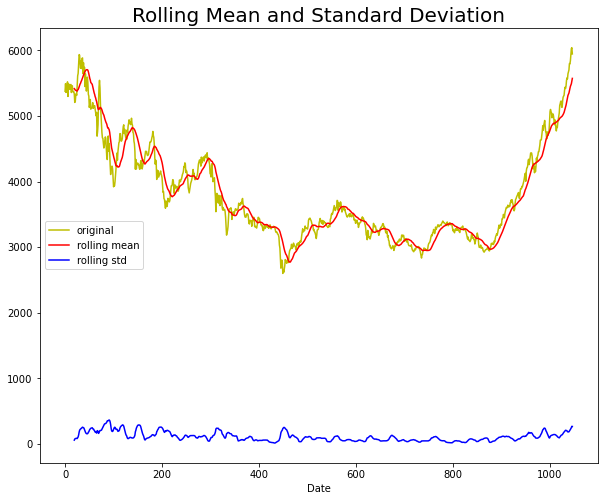

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


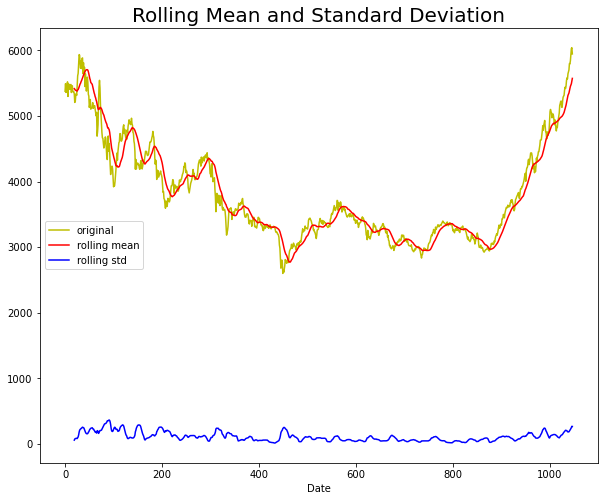

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


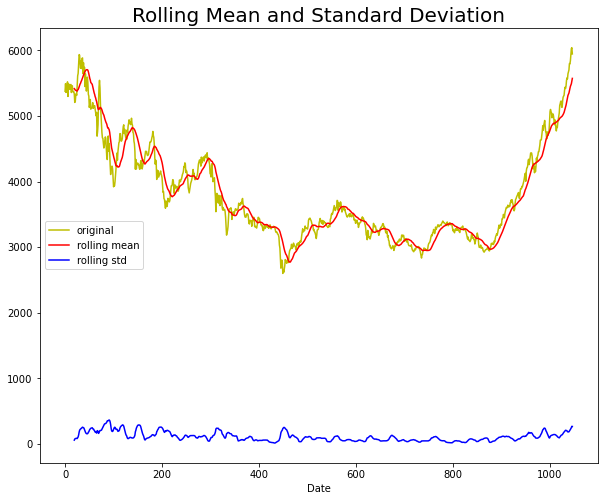

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


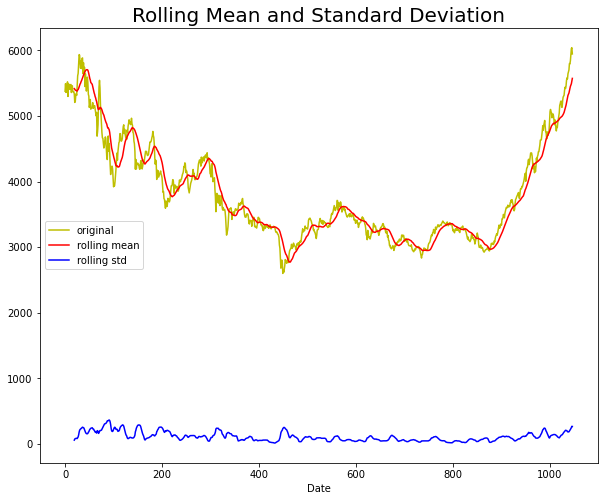

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


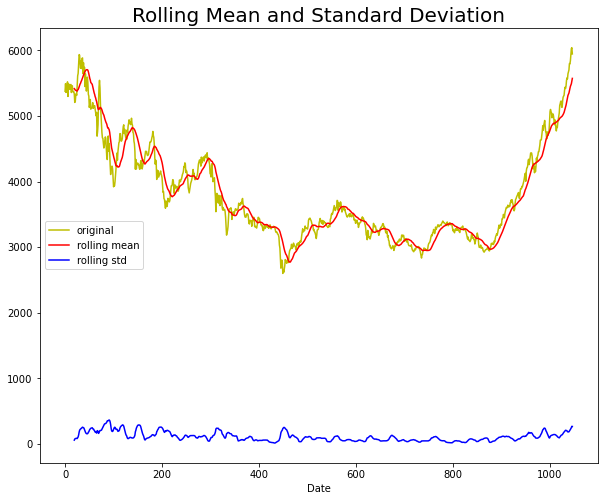

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


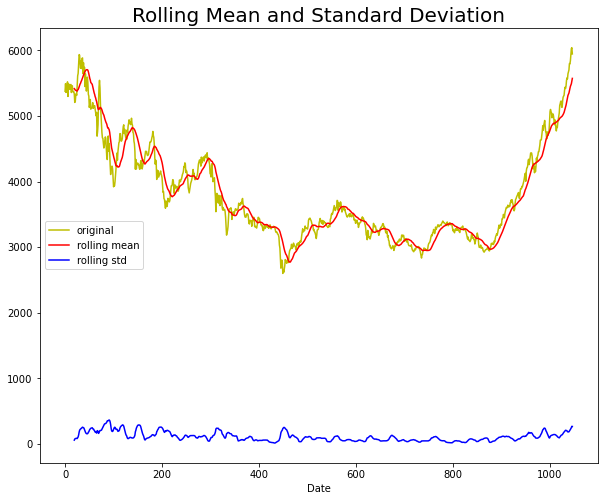

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


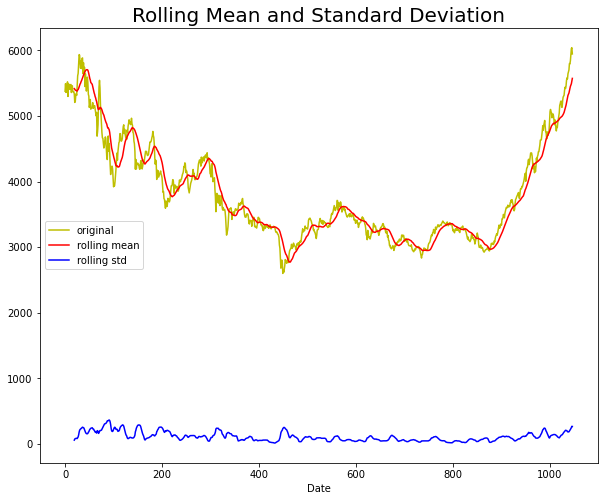

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


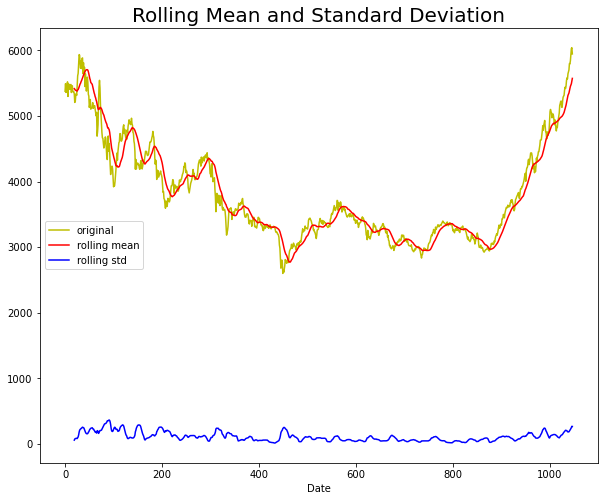

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


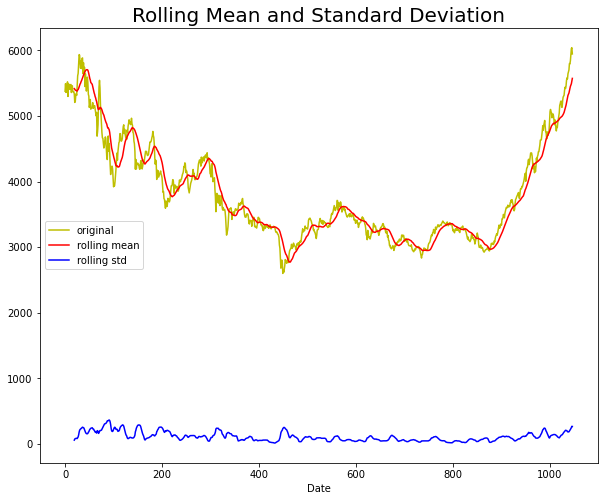

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


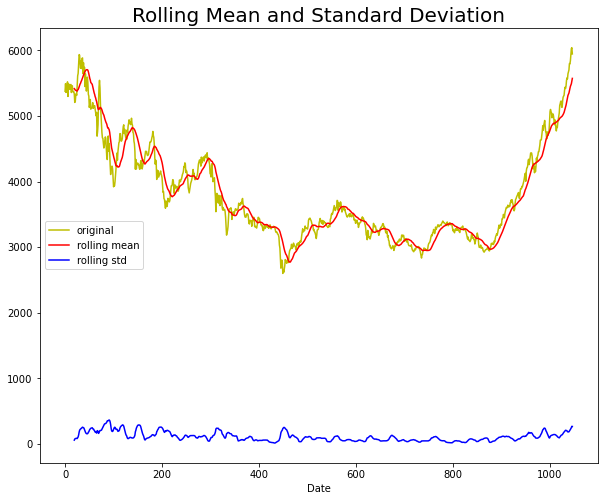

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


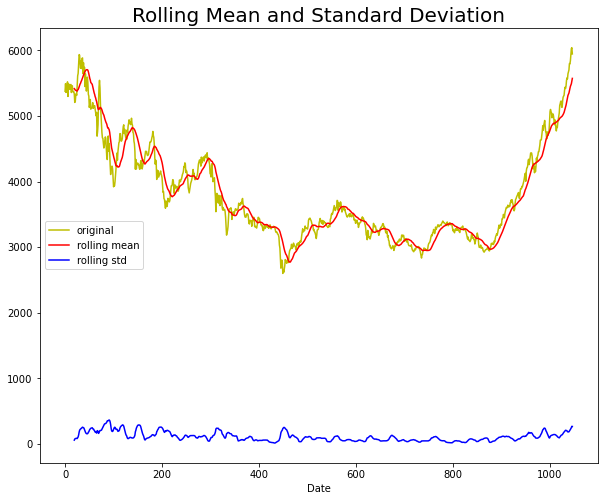

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


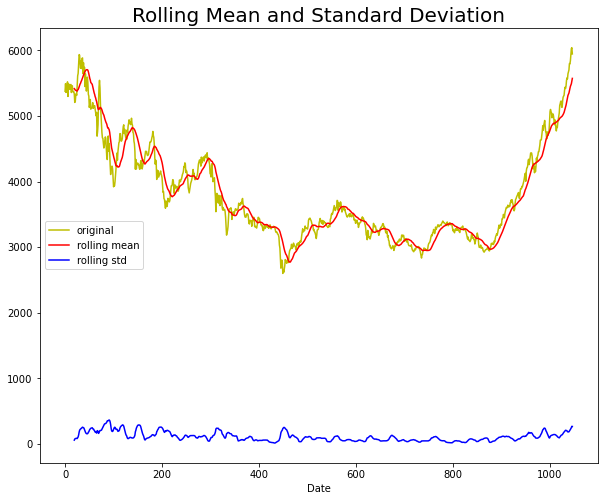

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


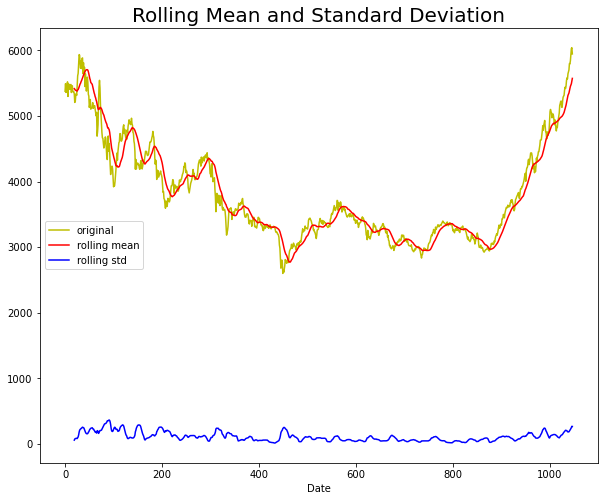

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


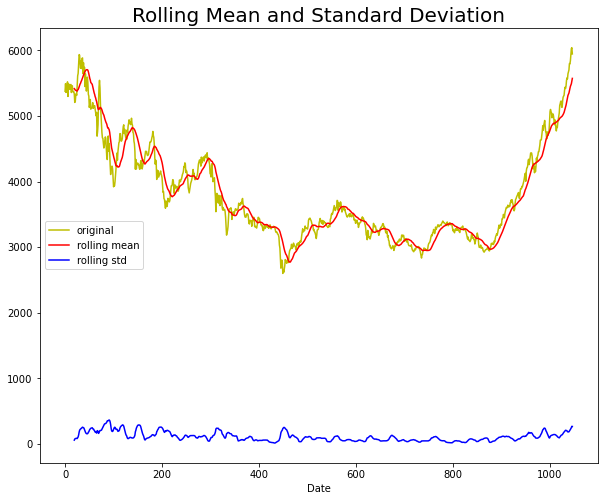

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


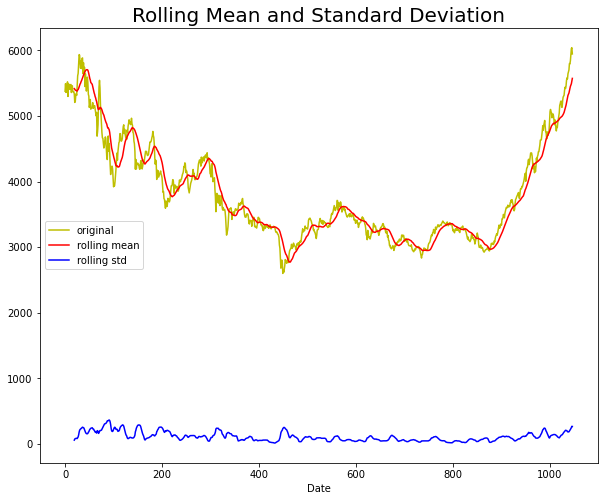

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


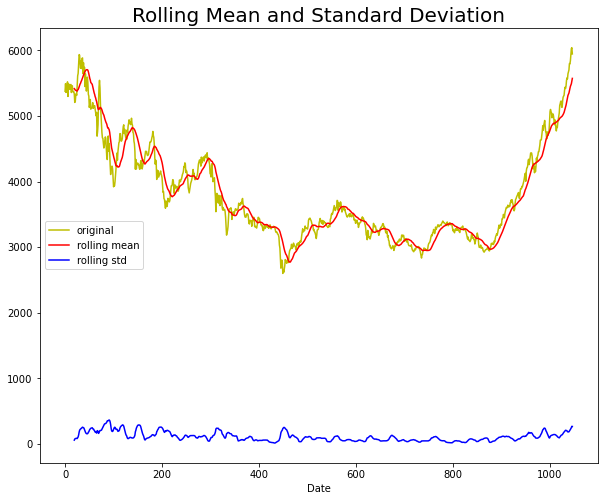

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


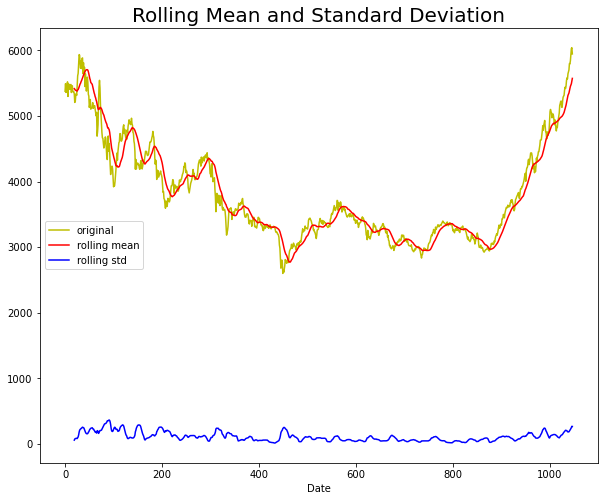

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


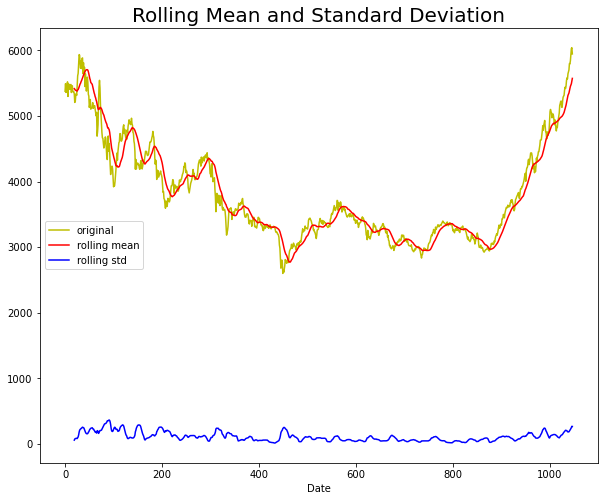

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


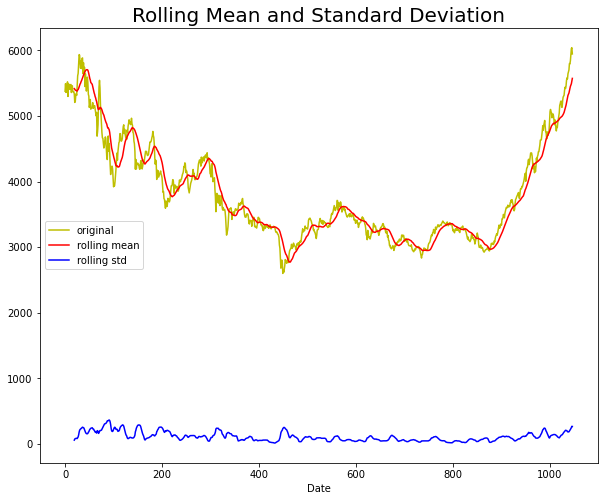

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


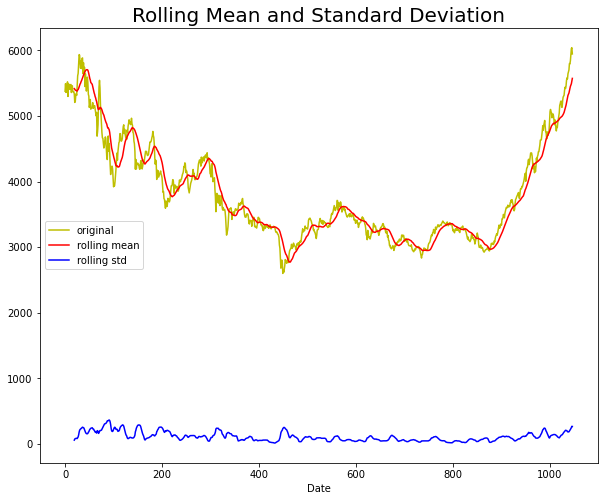

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


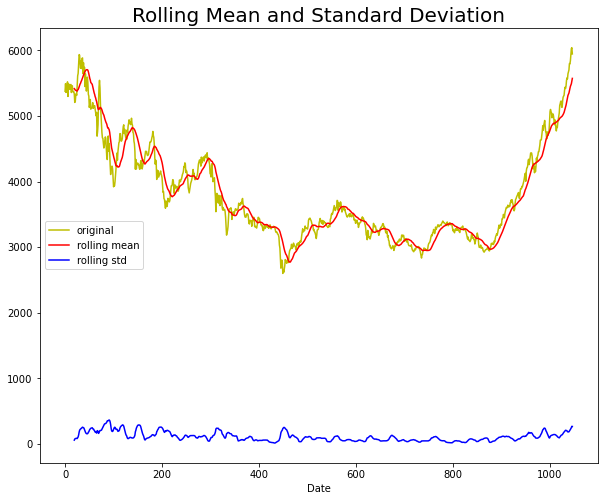

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


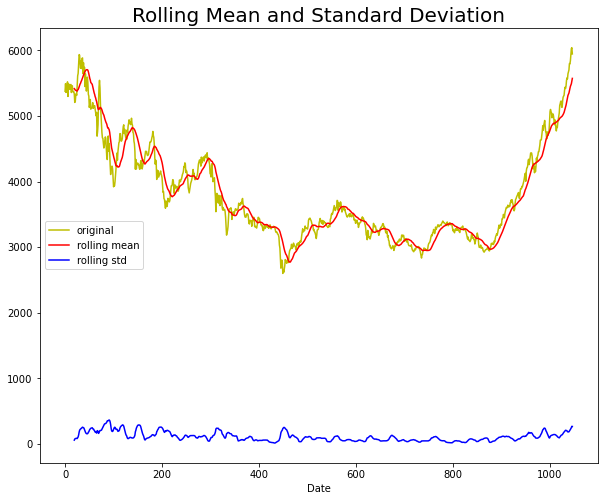

Results of dickey fuller test
ADF Test Statistic : -0.962162328076334
p-value : 0.766813442016743
#Lags Used : 1
Number of Observations Used : 998
Weak evidence against null hypothesis, time series is non-stationary 


KeyboardInterrupt: 

In [16]:
train_log_diff = train_log - mav
train_log_diff.dropna(inplace = True)

test_stationarity(train_log_diff)

In [18]:
pip install pmdarima

  Using cached pmdarima-1.8.5-cp38-cp38-win_amd64.whl (602 kB)
  Using cached statsmodels-0.13.2-cp38-cp38-win_amd64.whl (9.1 MB)
  Using cached numpy-1.23.0-cp38-cp38-win_amd64.whl (14.7 MB)
  Using cached patsy-0.5.2-py2.py3-none-any.whl (233 kB)
  Using cached packaging-21.3-py3-none-any.whl (40 kB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.2
    Uninstalling numpy-1.19.2:
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'c:\\programdata\\anaconda3\\lib\\site-packages\\numpy-1.19.2.dist-info\\direct_url.json'
Consider using the `--user` option or check the permissions.



In [19]:
from pmdarima import auto_arima
model = auto_arima(train_log, trace = True, error_action = 'ignore', suppress_warnings = True)
model.fit(train_log)
predictions = model.predict(n_periods = len(test))
predictions = pd.DataFrame(predictions,index = test_log.index,columns=['Prediction'])

ModuleNotFoundError: No module named 'pmdarima'

In [ ]:
conda install -c saravji pmdarima 